<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Mon Mar 25 15:35:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   32C    P0              76W / 350W |   7251MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 10*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/2)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

2000.0
CPU times: user 18min 15s, sys: 22.9 ms, total: 18min 15s
Wall time: 18min 18s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

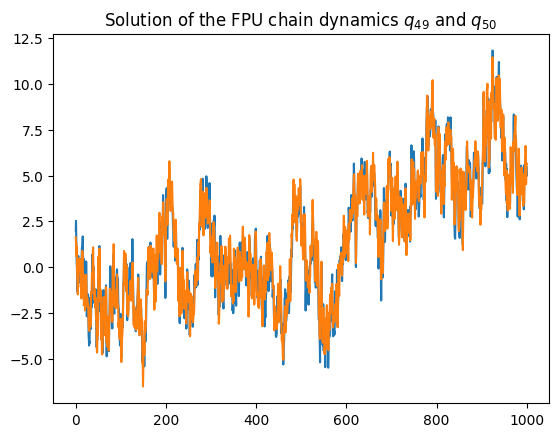

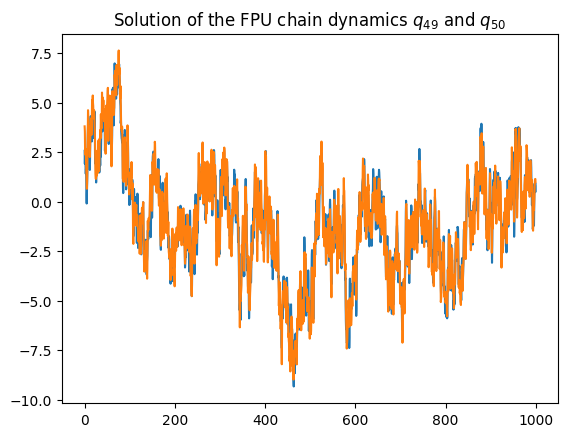

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


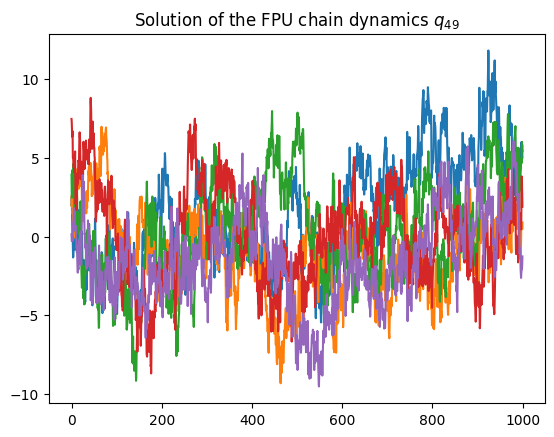

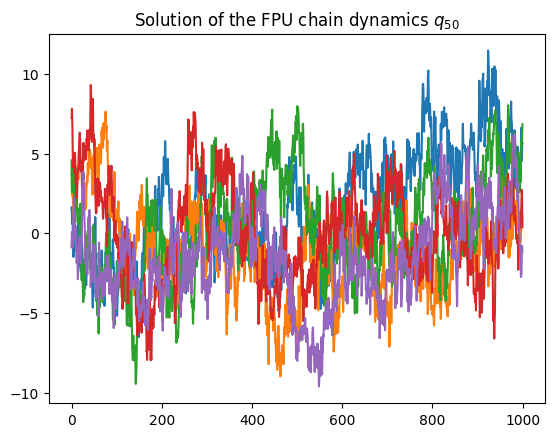

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


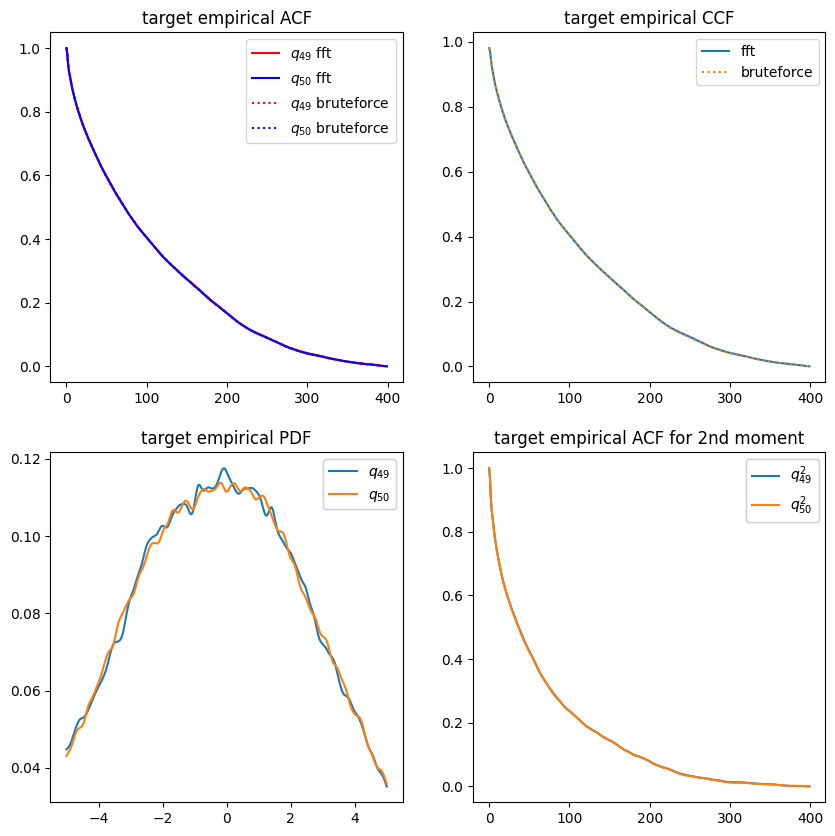

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(x_grid,loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

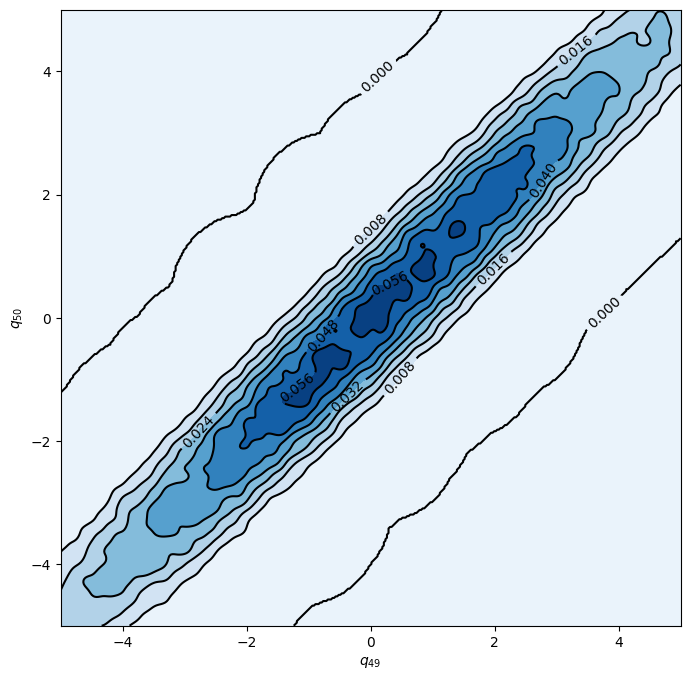

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

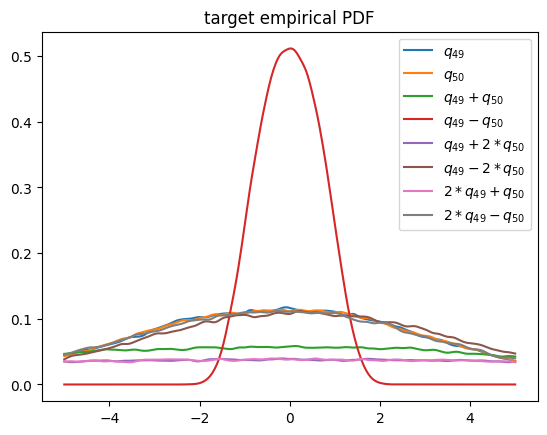

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(0.2).float()
        self.x_pdf2_s = torch.tensor(0.2).float()
        self.x_acf2_s = torch.tensor(0.2).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8754, 0.8725, acf: 0.11321, ccf: 0.12096, pdf: 0.29338, pdf2: 0.28740, acf2: 0.05751
[50]-th step loss: 0.0876, 0.0709, acf: 0.01388, ccf: 0.01348, pdf: 0.02544, pdf2: 0.01685, acf2: 0.00130
[100]-th step loss: 0.0268, 0.0282, acf: 0.00250, ccf: 0.00316, pdf: 0.01355, pdf2: 0.00834, acf2: 0.00067
[150]-th step loss: 0.0748, 0.0566, acf: 0.00991, ccf: 0.01189, pdf: 0.02195, pdf2: 0.00961, acf2: 0.00321
[200]-th step loss: 0.0624, 0.0524, acf: 0.01793, ccf: 0.01929, pdf: 0.00963, pdf2: 0.00399, acf2: 0.00153
[250]-th step loss: 0.1574, 0.1617, acf: 0.06117, ccf: 0.06466, pdf: 0.01573, pdf2: 0.00709, acf2: 0.01307
[300]-th step loss: 0.0913, 0.0864, acf: 0.04050, ccf: 0.04057, pdf: 0.00301, pdf2: 0.00200, acf2: 0.00030
[350]-th step loss: 0.0666, 0.0637, acf: 0.03073, ccf: 0.03074, pdf: 0.00099, pdf2: 0.00056, acf2: 0.00066
[400]-th step loss: 0.0643, 0.0665, acf: 0.03302, ccf: 0.03303, pdf: 0.00008, pdf2: 0.00004, acf2: 0.00035
[450]-th step loss: 0.0459, 0.0400, acf:

[3850]-th step loss: 0.0616, 0.0617, acf: 0.01198, ccf: 0.01819, pdf: 0.00774, pdf2: 0.00345, acf2: 0.02034
[3900]-th step loss: 0.0617, 0.0617, acf: 0.01200, ccf: 0.01830, pdf: 0.00774, pdf2: 0.00343, acf2: 0.02025
[3950]-th step loss: 0.0617, 0.0618, acf: 0.01197, ccf: 0.01827, pdf: 0.00774, pdf2: 0.00342, acf2: 0.02035
[4000]-th step loss: 0.0618, 0.0617, acf: 0.01203, ccf: 0.01843, pdf: 0.00774, pdf2: 0.00341, acf2: 0.02012
[4050]-th step loss: 0.0617, 0.0618, acf: 0.01202, ccf: 0.01839, pdf: 0.00774, pdf2: 0.00341, acf2: 0.02024
[4100]-th step loss: 0.0618, 0.0618, acf: 0.01206, ccf: 0.01847, pdf: 0.00774, pdf2: 0.00340, acf2: 0.02011
[4150]-th step loss: 0.0619, 0.0618, acf: 0.01199, ccf: 0.01830, pdf: 0.00774, pdf2: 0.00340, acf2: 0.02040
[4200]-th step loss: 0.0619, 0.0619, acf: 0.01194, ccf: 0.01818, pdf: 0.00774, pdf2: 0.00340, acf2: 0.02061
[4250]-th step loss: 0.0618, 0.0618, acf: 0.01206, ccf: 0.01842, pdf: 0.00774, pdf2: 0.00339, acf2: 0.02017
[4300]-th step loss: 0.0617,

[7650]-th step loss: 0.0286, 0.0217, acf: 0.00243, ccf: 0.00231, pdf: 0.00774, pdf2: 0.00367, acf2: 0.00559
[7700]-th step loss: 0.0232, 0.0208, acf: 0.00147, ccf: 0.00164, pdf: 0.00774, pdf2: 0.00359, acf2: 0.00633
[7750]-th step loss: 0.0205, 0.0206, acf: 0.00078, ccf: 0.00115, pdf: 0.00774, pdf2: 0.00353, acf2: 0.00743
[7800]-th step loss: 0.0205, 0.0215, acf: 0.00031, ccf: 0.00082, pdf: 0.00774, pdf2: 0.00366, acf2: 0.00894
[7850]-th step loss: 0.0210, 0.0263, acf: 0.00022, ccf: 0.00063, pdf: 0.00774, pdf2: 0.00349, acf2: 0.01418
[7900]-th step loss: 0.2217, 0.2114, acf: 0.07568, ccf: 0.08615, pdf: 0.00774, pdf2: 0.00997, acf2: 0.03187
[7950]-th step loss: 0.0332, 0.0287, acf: 0.00401, ccf: 0.00532, pdf: 0.00772, pdf2: 0.00561, acf2: 0.00604
[8000]-th step loss: 0.0219, 0.0213, acf: 0.00191, ccf: 0.00225, pdf: 0.00771, pdf2: 0.00474, acf2: 0.00470
[8050]-th step loss: 0.0248, 0.0207, acf: 0.00200, ccf: 0.00224, pdf: 0.00770, pdf2: 0.00417, acf2: 0.00459
[8100]-th step loss: 0.0238,

[11450]-th step loss: 0.0264, 0.0245, acf: 0.00659, ccf: 0.00670, pdf: 0.00778, pdf2: 0.00328, acf2: 0.00017
[11500]-th step loss: 0.0254, 0.0206, acf: 0.00436, ccf: 0.00443, pdf: 0.00784, pdf2: 0.00333, acf2: 0.00067
[11550]-th step loss: 0.0187, 0.0319, acf: 0.01014, ccf: 0.01024, pdf: 0.00769, pdf2: 0.00338, acf2: 0.00043
[11600]-th step loss: 0.0216, 0.0180, acf: 0.00251, ccf: 0.00262, pdf: 0.00771, pdf2: 0.00337, acf2: 0.00180
[11650]-th step loss: 0.0208, 0.0179, acf: 0.00283, ccf: 0.00290, pdf: 0.00773, pdf2: 0.00329, acf2: 0.00113
[11700]-th step loss: 0.0181, 0.0175, acf: 0.00065, ccf: 0.00069, pdf: 0.00923, pdf2: 0.00347, acf2: 0.00346
[11750]-th step loss: 0.0221, 0.0216, acf: 0.00059, ccf: 0.00064, pdf: 0.00769, pdf2: 0.00366, acf2: 0.00900
[11800]-th step loss: 0.0243, 0.0178, acf: 0.00023, ccf: 0.00030, pdf: 0.00768, pdf2: 0.00340, acf2: 0.00616
[11850]-th step loss: 0.0180, 0.0199, acf: 0.00028, ccf: 0.00034, pdf: 0.00769, pdf2: 0.00331, acf2: 0.00829
[11900]-th step los

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

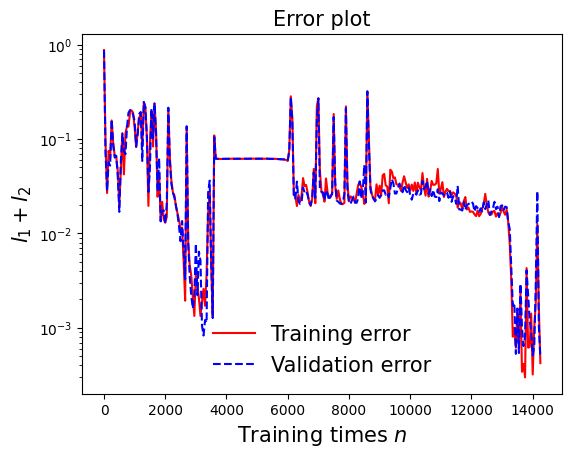

In [25]:
draw_loss(model)

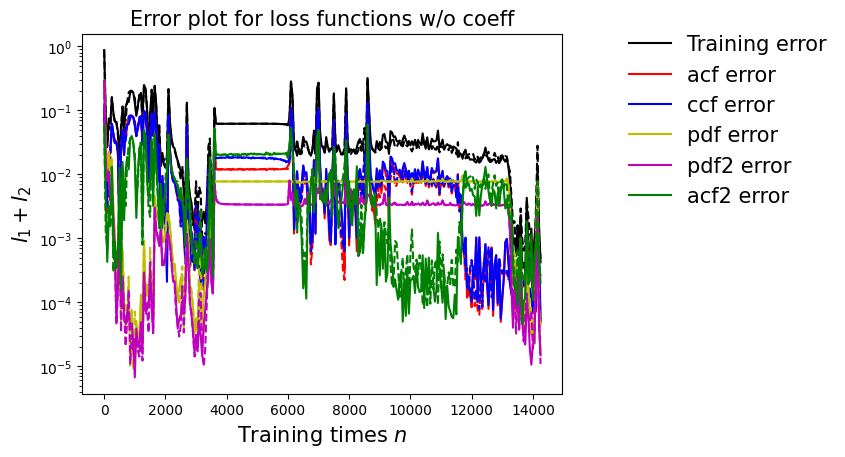

In [26]:
draw_errors(model)

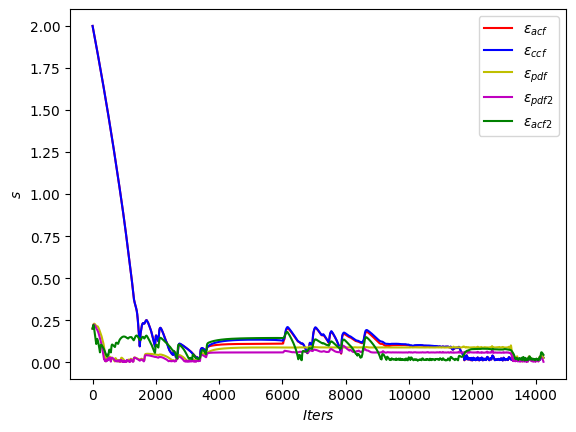

In [27]:
draw_adaptive_w(model)

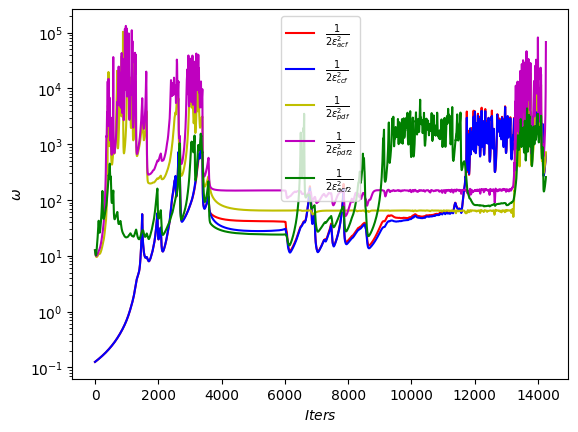

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

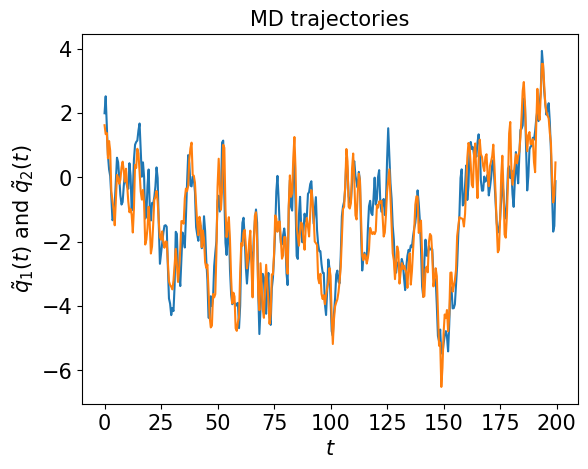

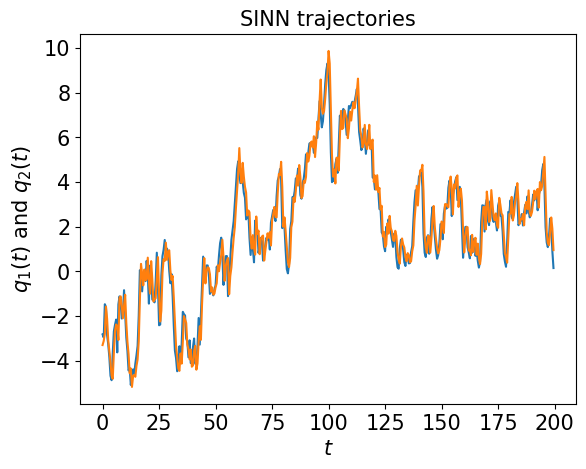

In [36]:
test1(model)

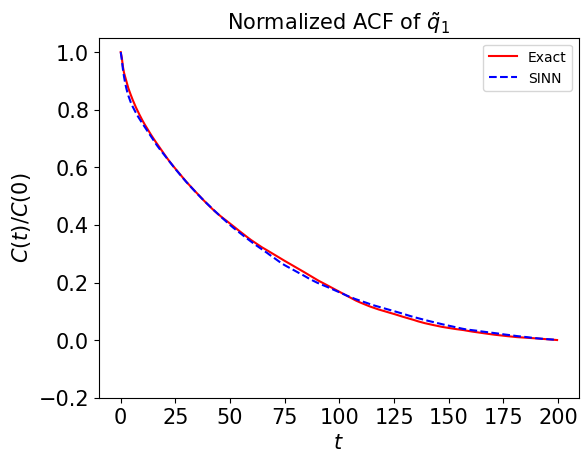

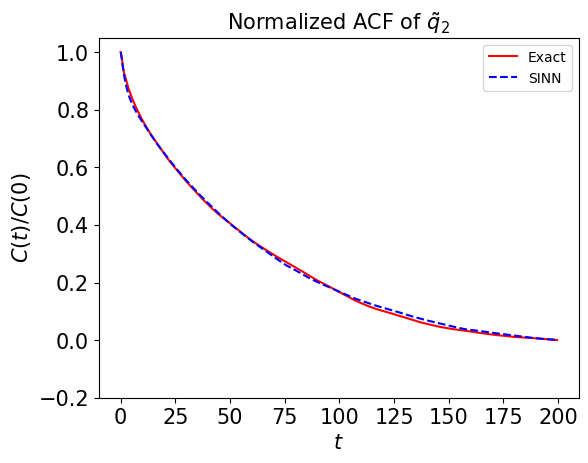

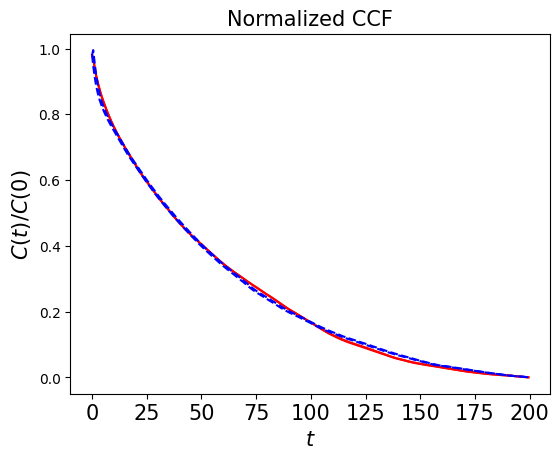

In [37]:
test2(model)

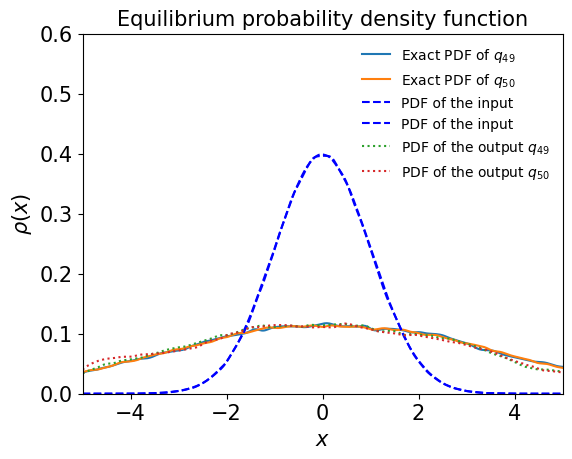

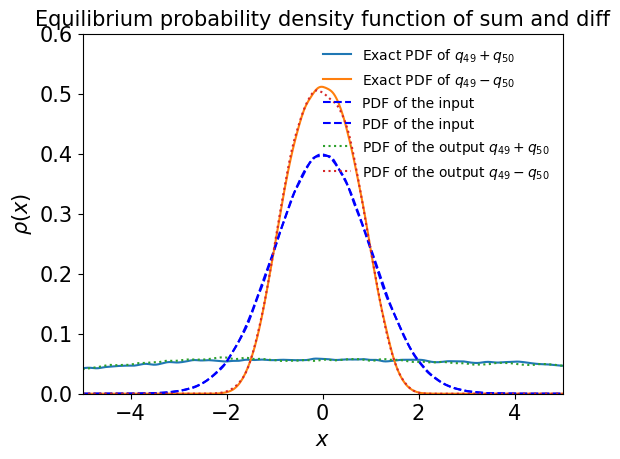

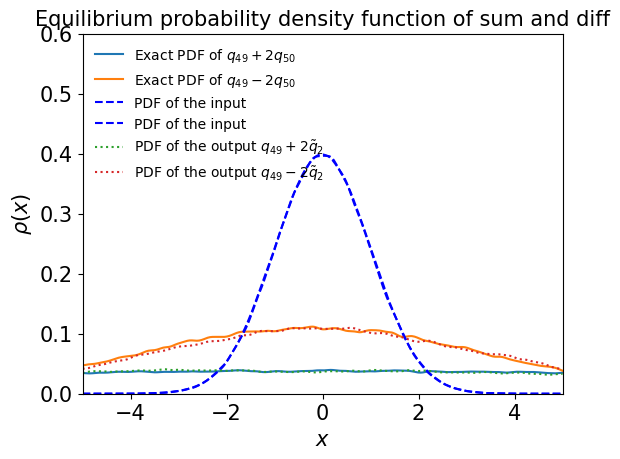

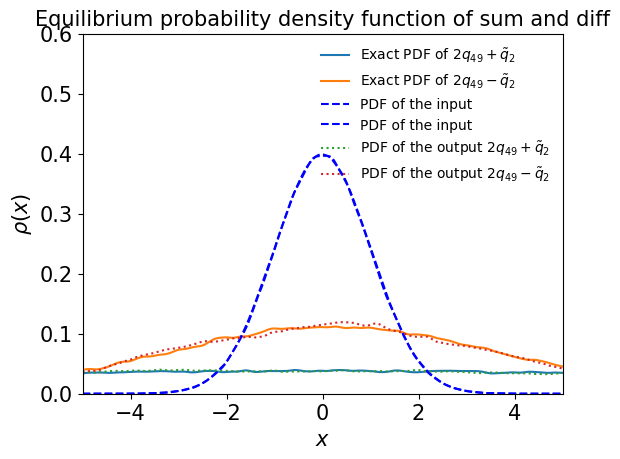

In [38]:
test3(model)

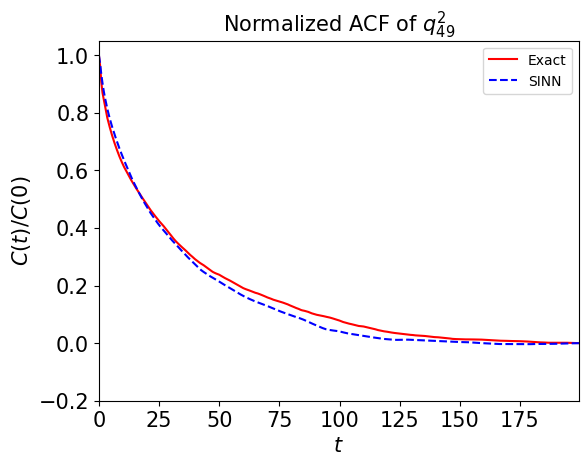

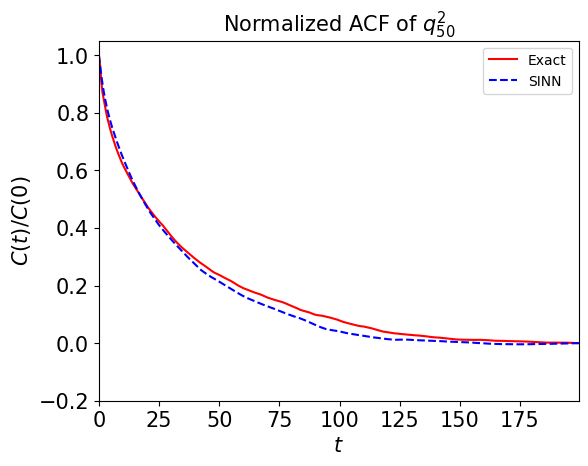

In [39]:
test4(model)

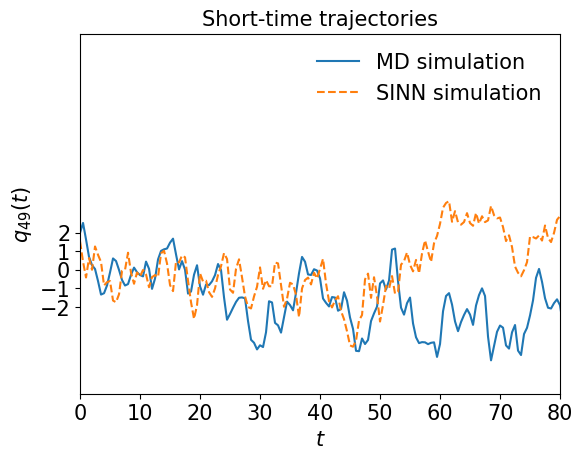

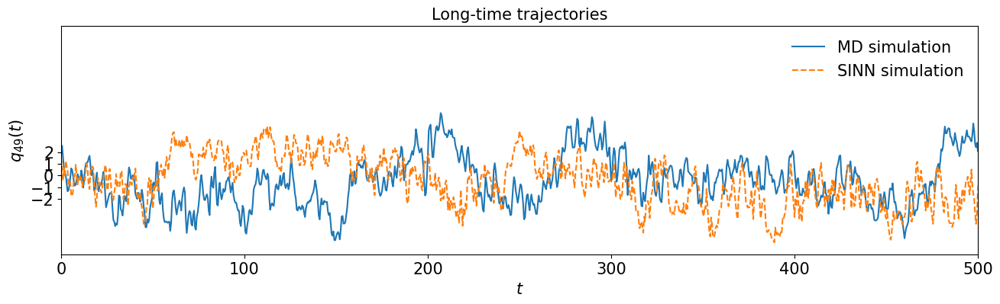

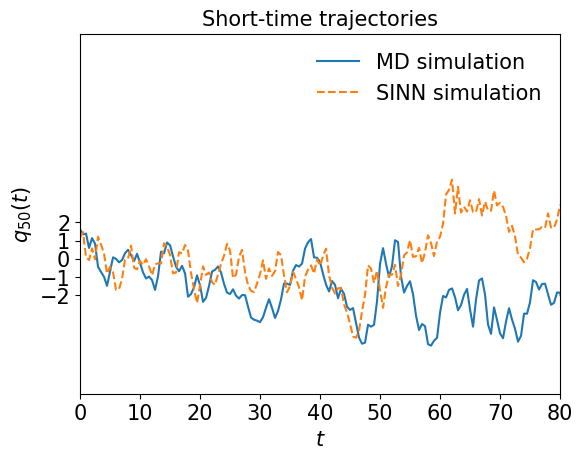

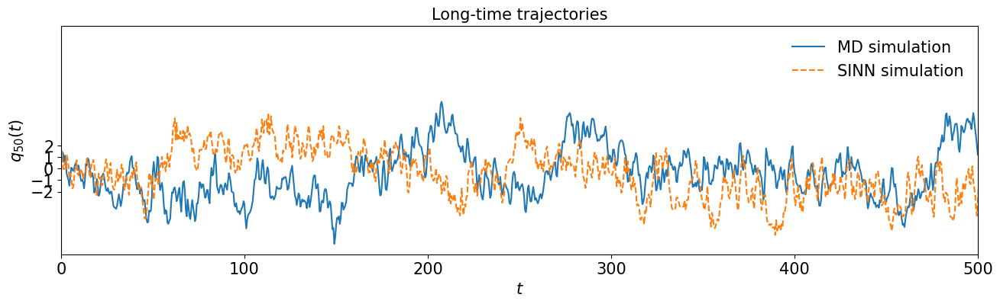

In [40]:
test5(model)

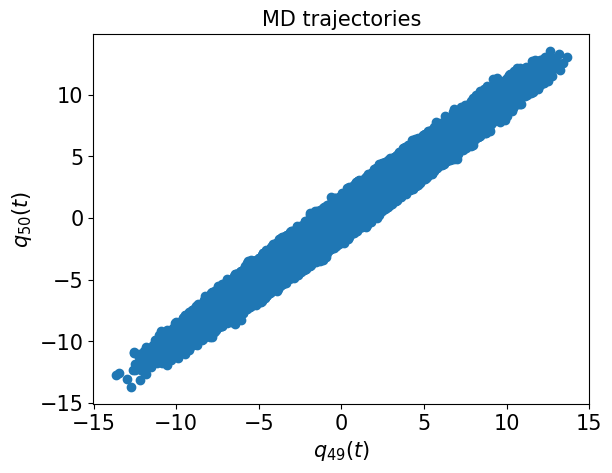

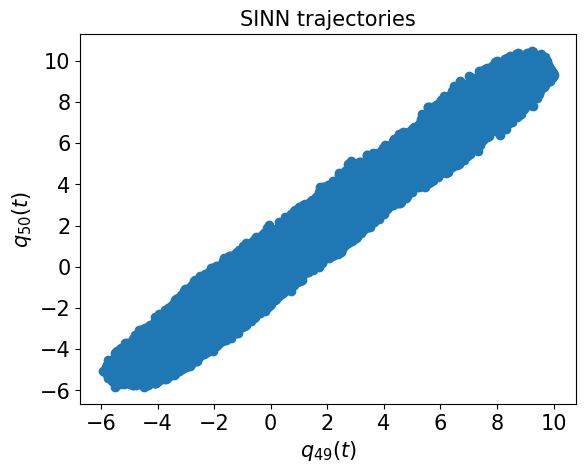

In [41]:
test6(model)

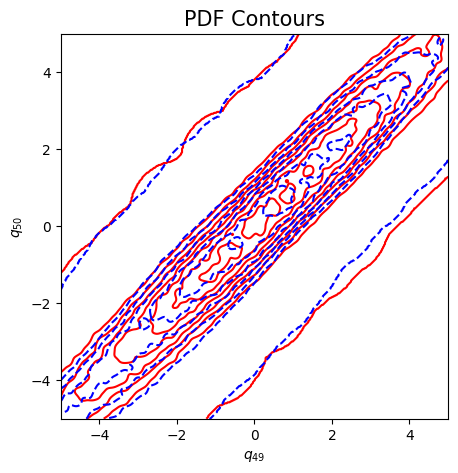

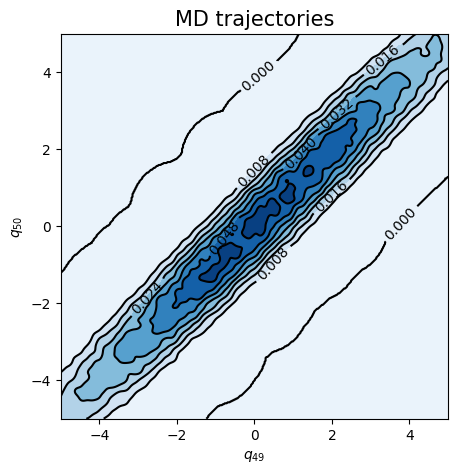

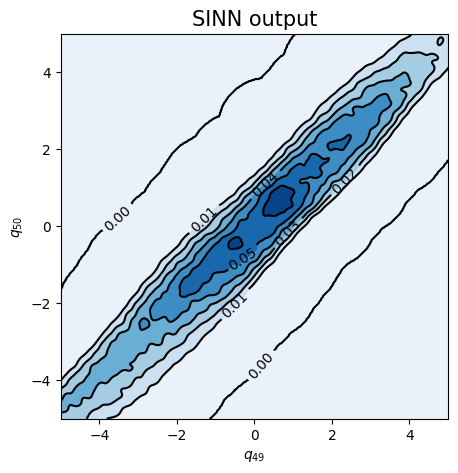

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8910, 0.8900, acf: 0.11459, ccf: 0.13840, pdf: 0.29285, pdf2: 0.28532, acf2: 0.05882
[50]-th step loss: 0.3973, 0.4063, acf: 0.04092, ccf: 0.31409, pdf: 0.01861, pdf2: 0.02106, acf2: 0.01159
[100]-th step loss: 0.3823, 0.3838, acf: 0.01035, ccf: 0.35740, pdf: 0.00608, pdf2: 0.00911, acf2: 0.00091
[150]-th step loss: 0.3795, 0.3963, acf: 0.01522, ccf: 0.35175, pdf: 0.01699, pdf2: 0.01186, acf2: 0.00053
[200]-th step loss: 0.4235, 0.4111, acf: 0.00421, ccf: 0.38980, pdf: 0.00838, pdf2: 0.00808, acf2: 0.00067
[250]-th step loss: 0.4322, 0.4210, acf: 0.02905, ccf: 0.36556, pdf: 0.01339, pdf2: 0.00612, acf2: 0.00687
[300]-th step loss: 0.4237, 0.4195, acf: 0.02044, ccf: 0.38130, pdf: 0.00851, pdf2: 0.00567, acf2: 0.00358
[350]-th step loss: 0.4186, 0.4099, acf: 0.01341, ccf: 0.38307, pdf: 0.00586, pdf2: 0.00594, acf2: 0.00163
[400]-th step loss: 0.4073, 0.3991, acf: 0.00958, ccf: 0.37819, pdf: 0.00472, pdf2: 0.00589, acf2: 0.00075
[450]-th step loss: 0.4739, 0.4065, acf:

[3850]-th step loss: 0.4298, 0.4510, acf: 0.00275, ccf: 0.43710, pdf: 0.00302, pdf2: 0.00710, acf2: 0.00105
[3900]-th step loss: 0.4400, 0.4562, acf: 0.00290, ccf: 0.44080, pdf: 0.00291, pdf2: 0.00774, acf2: 0.00186
[3950]-th step loss: 0.4796, 0.4543, acf: 0.00397, ccf: 0.43787, pdf: 0.00320, pdf2: 0.00821, acf2: 0.00106
[4000]-th step loss: 0.4412, 0.4566, acf: 0.00308, ccf: 0.44403, pdf: 0.00113, pdf2: 0.00791, acf2: 0.00045
[4050]-th step loss: 0.4577, 0.4605, acf: 0.00223, ccf: 0.44902, pdf: 0.00106, pdf2: 0.00783, acf2: 0.00039
[4100]-th step loss: 0.4752, 0.4866, acf: 0.00121, ccf: 0.47423, pdf: 0.00130, pdf2: 0.00841, acf2: 0.00149
[4150]-th step loss: 0.4818, 0.4853, acf: 0.00204, ccf: 0.47241, pdf: 0.00168, pdf2: 0.00804, acf2: 0.00112
[4200]-th step loss: 0.4717, 0.4819, acf: 0.00077, ccf: 0.47184, pdf: 0.00150, pdf2: 0.00747, acf2: 0.00034
[4250]-th step loss: 0.4730, 0.4700, acf: 0.00535, ccf: 0.44993, pdf: 0.00177, pdf2: 0.00842, acf2: 0.00452
[4300]-th step loss: 0.4686,

[7650]-th step loss: 0.0368, 0.0363, acf: 0.00036, ccf: 0.00038, pdf: 0.00770, pdf2: 0.01191, acf2: 0.01591
[7700]-th step loss: 0.0302, 0.0293, acf: 0.00018, ccf: 0.00018, pdf: 0.00765, pdf2: 0.01157, acf2: 0.00975
[7750]-th step loss: 0.0288, 0.0338, acf: 0.00008, ccf: 0.00009, pdf: 0.00765, pdf2: 0.01242, acf2: 0.01360
[7800]-th step loss: 0.0332, 0.0310, acf: 0.00005, ccf: 0.00004, pdf: 0.00767, pdf2: 0.01158, acf2: 0.01161
[7850]-th step loss: 0.0320, 0.0329, acf: 0.00010, ccf: 0.00010, pdf: 0.00769, pdf2: 0.01181, acf2: 0.01324
[7900]-th step loss: 0.0310, 0.0305, acf: 0.00018, ccf: 0.00018, pdf: 0.00771, pdf2: 0.01106, acf2: 0.01135
[7950]-th step loss: 0.0349, 0.0331, acf: 0.00026, ccf: 0.00026, pdf: 0.00772, pdf2: 0.01117, acf2: 0.01369
[8000]-th step loss: 0.0355, 0.0279, acf: 0.00049, ccf: 0.00048, pdf: 0.00773, pdf2: 0.01195, acf2: 0.00727
[8050]-th step loss: 0.0338, 0.0344, acf: 0.00034, ccf: 0.00035, pdf: 0.00773, pdf2: 0.01121, acf2: 0.01477
[8100]-th step loss: 0.0345,

[11450]-th step loss: 0.0369, 0.0368, acf: 0.00030, ccf: 0.00028, pdf: 0.00774, pdf2: 0.01772, acf2: 0.01080
[11500]-th step loss: 0.0393, 0.0368, acf: 0.00023, ccf: 0.00021, pdf: 0.00772, pdf2: 0.01717, acf2: 0.01142
[11550]-th step loss: 0.0476, 0.0403, acf: 0.00045, ccf: 0.00045, pdf: 0.00769, pdf2: 0.01634, acf2: 0.01538
[11600]-th step loss: 0.0381, 0.0371, acf: 0.00019, ccf: 0.00019, pdf: 0.00766, pdf2: 0.01592, acf2: 0.01317
[11650]-th step loss: 0.0411, 0.0478, acf: 0.00114, ccf: 0.00115, pdf: 0.00770, pdf2: 0.01834, acf2: 0.01948
[11700]-th step loss: 0.0350, 0.0362, acf: 0.00008, ccf: 0.00008, pdf: 0.00763, pdf2: 0.01633, acf2: 0.01210
[11750]-th step loss: 0.0357, 0.0383, acf: 0.00014, ccf: 0.00011, pdf: 0.00770, pdf2: 0.01834, acf2: 0.01205
[11800]-th step loss: 0.0397, 0.0335, acf: 0.00042, ccf: 0.00041, pdf: 0.00764, pdf2: 0.01710, acf2: 0.00792
[11850]-th step loss: 0.0346, 0.0370, acf: 0.00006, ccf: 0.00006, pdf: 0.00764, pdf2: 0.01749, acf2: 0.01176
[11900]-th step los

[15250]-th step loss: 0.0258, 0.0225, acf: 0.00743, ccf: 0.00162, pdf: 0.00372, pdf2: 0.00919, acf2: 0.00055
[15300]-th step loss: 0.0324, 0.0248, acf: 0.00731, ccf: 0.00389, pdf: 0.00406, pdf2: 0.00938, acf2: 0.00014
[15350]-th step loss: 0.0305, 0.0302, acf: 0.01167, ccf: 0.00419, pdf: 0.00390, pdf2: 0.00936, acf2: 0.00109
[15400]-th step loss: 0.0196, 0.0210, acf: 0.00645, ccf: 0.00237, pdf: 0.00281, pdf2: 0.00905, acf2: 0.00028
[15450]-th step loss: 0.0220, 0.0247, acf: 0.00728, ccf: 0.00482, pdf: 0.00327, pdf2: 0.00909, acf2: 0.00021
[15500]-th step loss: 0.0195, 0.0202, acf: 0.00628, ccf: 0.00173, pdf: 0.00264, pdf2: 0.00921, acf2: 0.00029
[15550]-th step loss: 0.0196, 0.0208, acf: 0.00627, ccf: 0.00176, pdf: 0.00265, pdf2: 0.00991, acf2: 0.00023
[15600]-th step loss: 0.0190, 0.0196, acf: 0.00598, ccf: 0.00143, pdf: 0.00242, pdf2: 0.00944, acf2: 0.00030
[15650]-th step loss: 0.0194, 0.0202, acf: 0.00640, ccf: 0.00127, pdf: 0.00226, pdf2: 0.00965, acf2: 0.00060
[15700]-th step los

[19050]-th step loss: 0.0022, 0.0005, acf: 0.00013, ccf: 0.00013, pdf: 0.00005, pdf2: 0.00004, acf2: 0.00016
[19100]-th step loss: 0.0009, 0.0007, acf: 0.00014, ccf: 0.00009, pdf: 0.00011, pdf2: 0.00005, acf2: 0.00027
[19150]-th step loss: 0.0008, 0.0005, acf: 0.00010, ccf: 0.00014, pdf: 0.00006, pdf2: 0.00007, acf2: 0.00015
[19200]-th step loss: 0.0008, 0.0008, acf: 0.00010, ccf: 0.00011, pdf: 0.00009, pdf2: 0.00004, acf2: 0.00049
[19250]-th step loss: 0.0005, 0.0009, acf: 0.00025, ccf: 0.00030, pdf: 0.00002, pdf2: 0.00007, acf2: 0.00031
[19300]-th step loss: 0.0052, 0.0053, acf: 0.00188, ccf: 0.00199, pdf: 0.00067, pdf2: 0.00037, acf2: 0.00036
[19350]-th step loss: 0.0005, 0.0008, acf: 0.00026, ccf: 0.00029, pdf: 0.00007, pdf2: 0.00004, acf2: 0.00013
[19400]-th step loss: 0.0008, 0.0004, acf: 0.00007, ccf: 0.00010, pdf: 0.00004, pdf2: 0.00003, acf2: 0.00014
[19450]-th step loss: 0.0006, 0.0007, acf: 0.00017, ccf: 0.00017, pdf: 0.00006, pdf2: 0.00008, acf2: 0.00021
[19500]-th step los

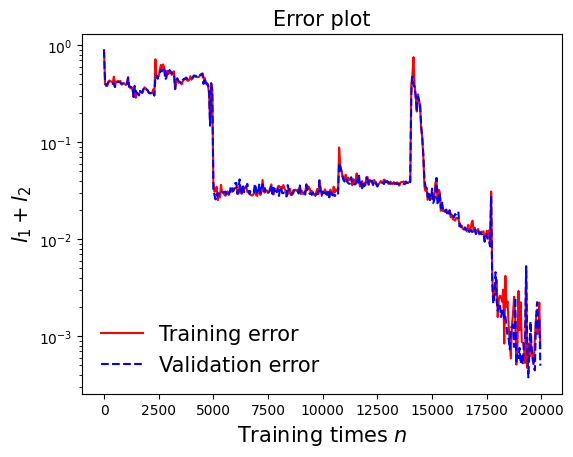

In [44]:
draw_loss(model1)

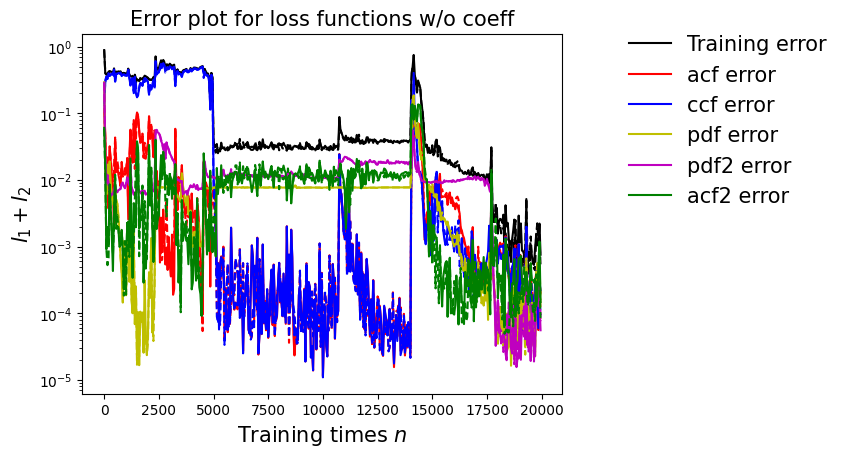

In [45]:
draw_errors(model1)

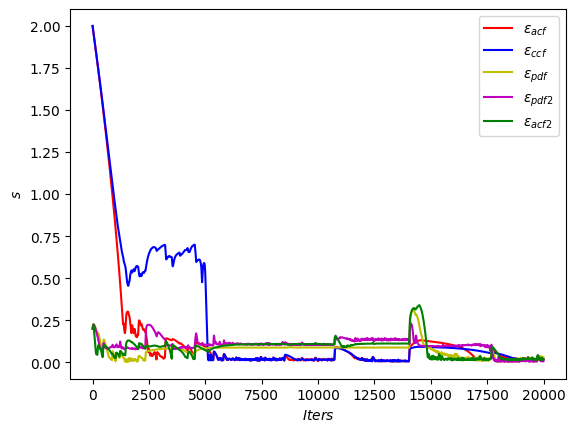

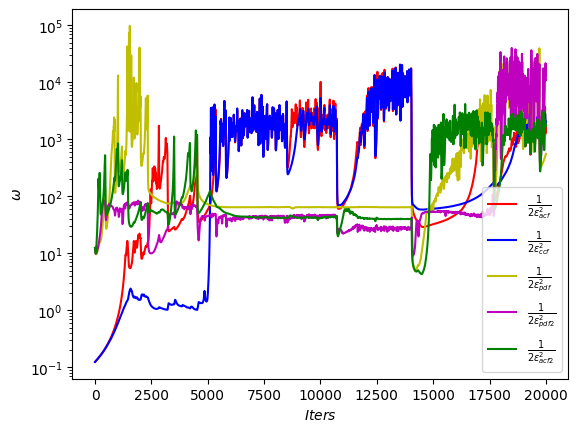

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

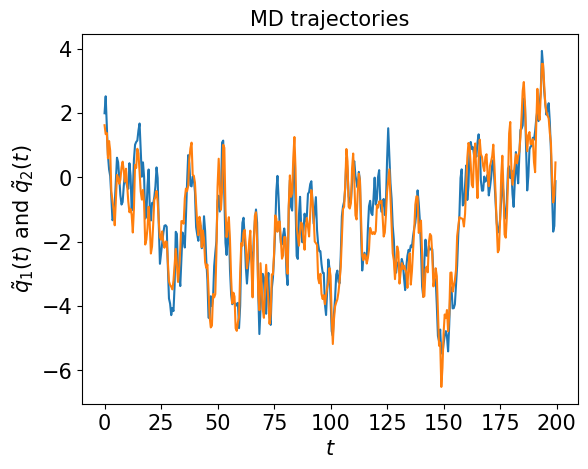

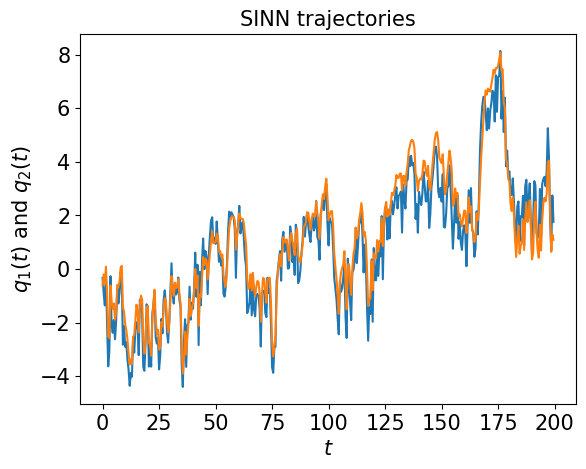

In [47]:
test1(model1)

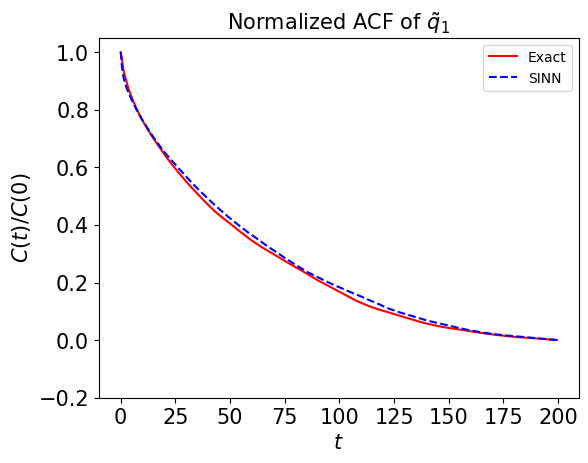

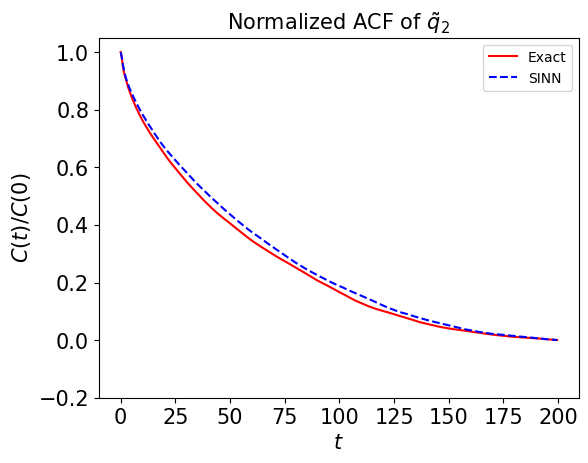

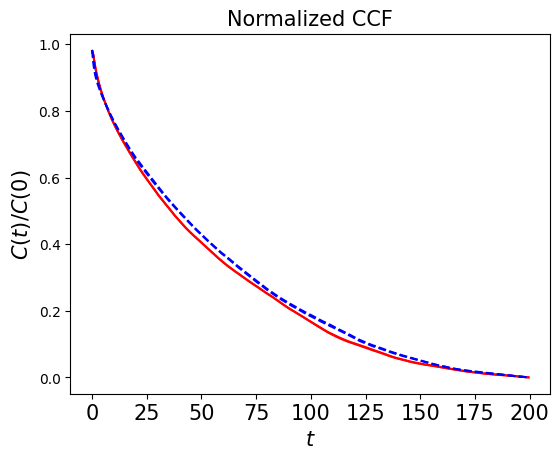

In [48]:
test2(model1)

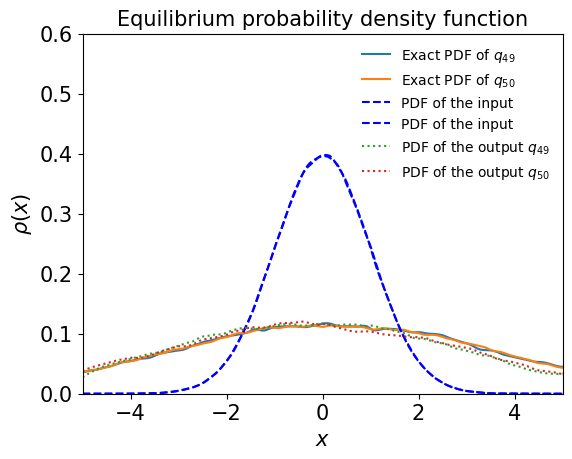

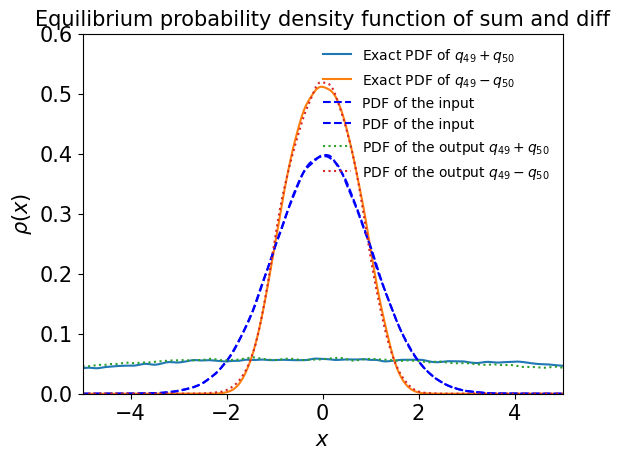

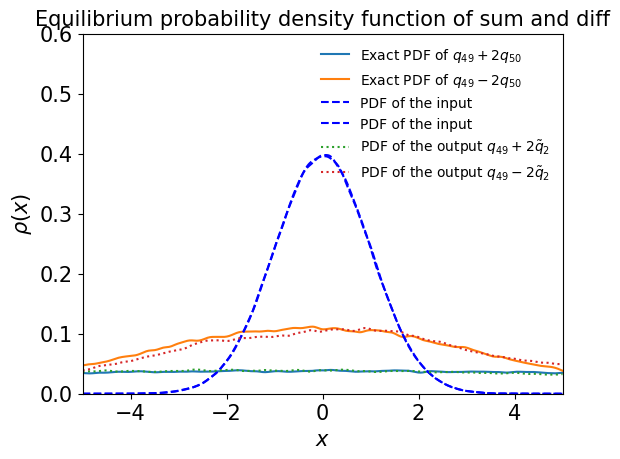

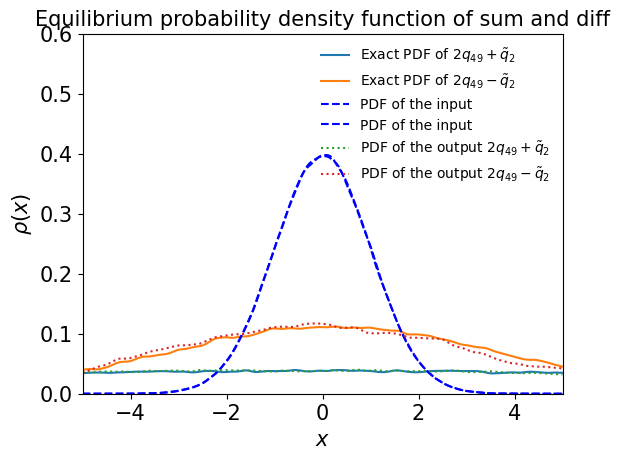

In [49]:
test3(model1)

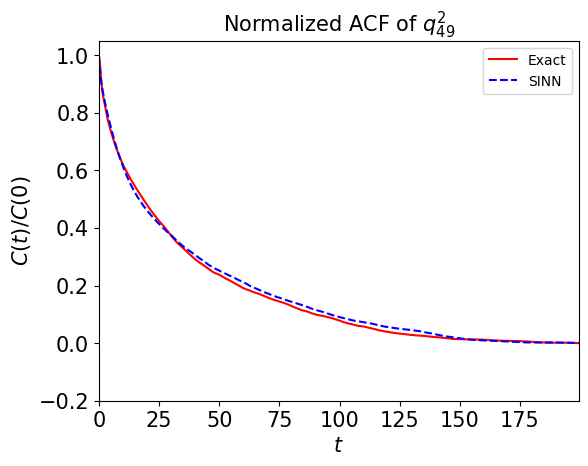

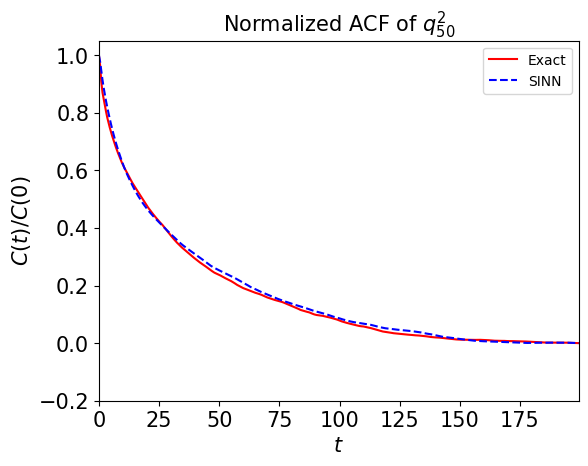

In [50]:
test4(model1)

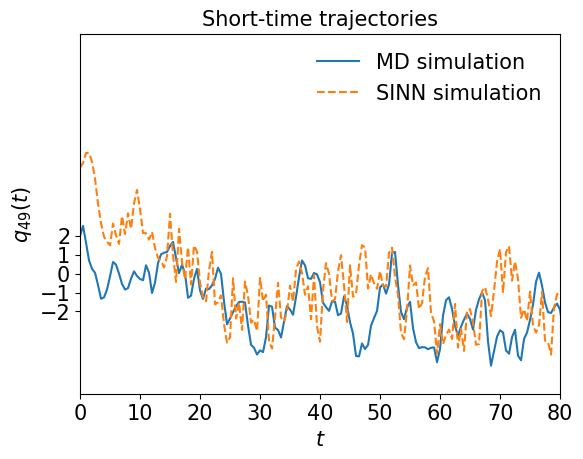

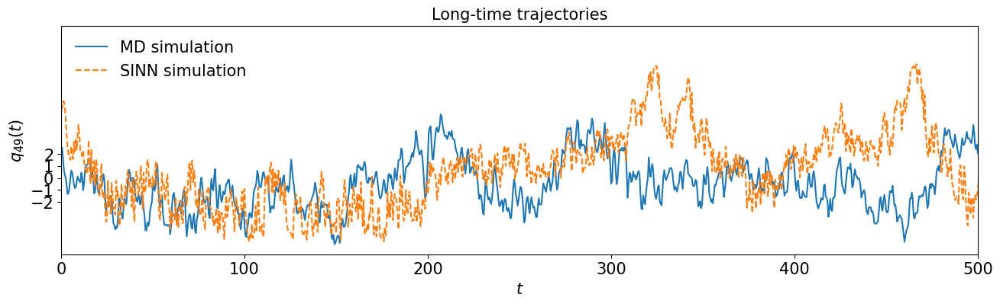

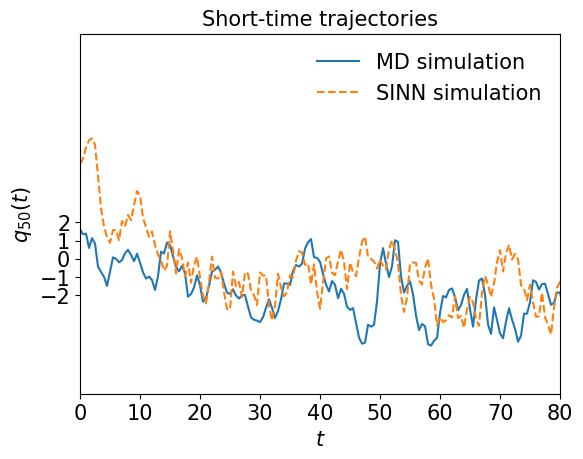

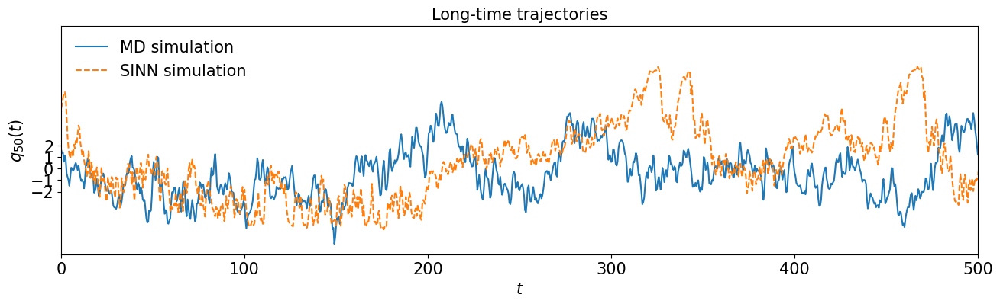

In [51]:
test5(model1)

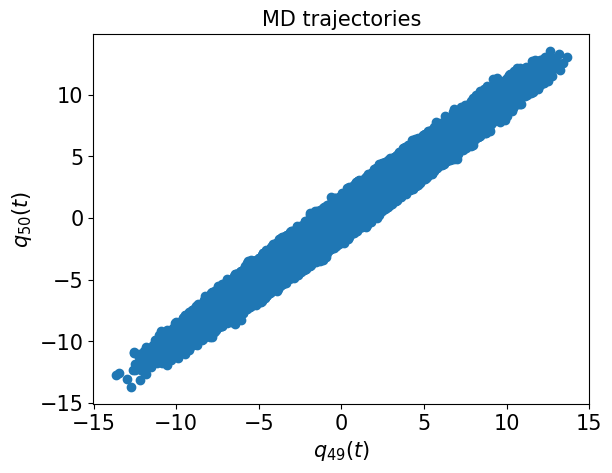

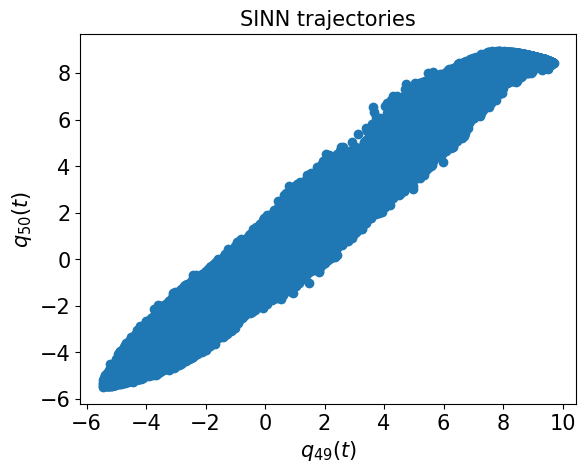

In [52]:
test6(model1)

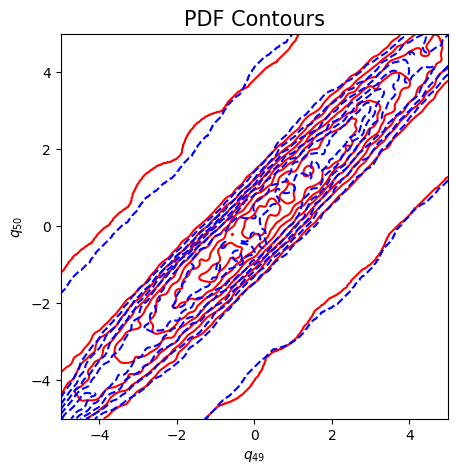

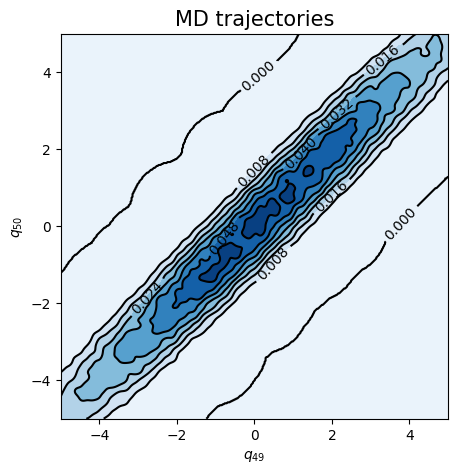

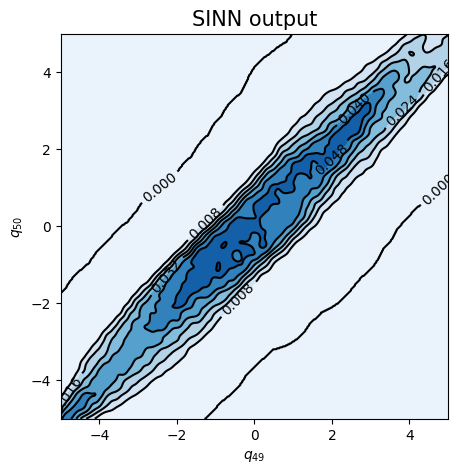

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8765, 0.8683, acf: 0.11288, ccf: 0.11501, pdf: 0.29383, pdf2: 0.28910, acf2: 0.05744
[50]-th step loss: 0.1948, 0.1932, acf: 0.05939, ccf: 0.05942, pdf: 0.03006, pdf2: 0.01774, acf2: 0.02656
[100]-th step loss: 0.0208, 0.0232, acf: 0.00183, ccf: 0.00183, pdf: 0.00931, pdf2: 0.00850, acf2: 0.00176
[150]-th step loss: 0.0909, 0.0877, acf: 0.02448, ccf: 0.02467, pdf: 0.02256, pdf2: 0.01306, acf2: 0.00289
[200]-th step loss: 0.1038, 0.1275, acf: 0.05116, ccf: 0.05212, pdf: 0.01188, pdf2: 0.00554, acf2: 0.00684
[250]-th step loss: 0.0395, 0.0419, acf: 0.01690, ccf: 0.01739, pdf: 0.00392, pdf2: 0.00188, acf2: 0.00178
[300]-th step loss: 0.0449, 0.0364, acf: 0.00670, ccf: 0.00713, pdf: 0.01746, pdf2: 0.00410, acf2: 0.00098
[350]-th step loss: 0.0452, 0.0274, acf: 0.01012, ccf: 0.01029, pdf: 0.00472, pdf2: 0.00060, acf2: 0.00171
[400]-th step loss: 0.1450, 0.1046, acf: 0.04821, ccf: 0.04825, pdf: 0.00049, pdf2: 0.00023, acf2: 0.00739
[450]-th step loss: 0.0363, 0.0349, acf:

[3850]-th step loss: 0.0598, 0.0621, acf: 0.00004, ccf: 0.00004, pdf: 0.00774, pdf2: 0.04184, acf2: 0.01247
[3900]-th step loss: 0.0621, 0.0617, acf: 0.00002, ccf: 0.00002, pdf: 0.00774, pdf2: 0.04160, acf2: 0.01233
[3950]-th step loss: 0.0586, 0.0614, acf: 0.00005, ccf: 0.00005, pdf: 0.00774, pdf2: 0.04198, acf2: 0.01163
[4000]-th step loss: 0.0620, 0.0603, acf: 0.00006, ccf: 0.00006, pdf: 0.00774, pdf2: 0.04170, acf2: 0.01078
[4050]-th step loss: 0.0625, 0.0622, acf: 0.00005, ccf: 0.00005, pdf: 0.00774, pdf2: 0.04141, acf2: 0.01299
[4100]-th step loss: 0.0623, 0.0617, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.04131, acf2: 0.01258
[4150]-th step loss: 0.0589, 0.0600, acf: 0.00002, ccf: 0.00002, pdf: 0.00774, pdf2: 0.04110, acf2: 0.01109
[4200]-th step loss: 0.0646, 0.0623, acf: 0.00010, ccf: 0.00011, pdf: 0.00774, pdf2: 0.04119, acf2: 0.01316
[4250]-th step loss: 0.0574, 0.0601, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.04079, acf2: 0.01154
[4300]-th step loss: 0.0664,

[7650]-th step loss: 0.0312, 0.0335, acf: 0.00024, ccf: 0.00024, pdf: 0.00774, pdf2: 0.01023, acf2: 0.01507
[7700]-th step loss: 0.0285, 0.0299, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.01096, acf2: 0.01115
[7750]-th step loss: 0.0285, 0.0275, acf: 0.00022, ccf: 0.00021, pdf: 0.00774, pdf2: 0.01043, acf2: 0.00889
[7800]-th step loss: 0.0271, 0.0283, acf: 0.00002, ccf: 0.00002, pdf: 0.00774, pdf2: 0.00943, acf2: 0.01110
[7850]-th step loss: 0.0314, 0.0303, acf: 0.00005, ccf: 0.00005, pdf: 0.00774, pdf2: 0.00948, acf2: 0.01298
[7900]-th step loss: 0.0289, 0.0272, acf: 0.00004, ccf: 0.00004, pdf: 0.00774, pdf2: 0.00859, acf2: 0.01075
[7950]-th step loss: 0.0251, 0.0258, acf: 0.00012, ccf: 0.00010, pdf: 0.00774, pdf2: 0.00787, acf2: 0.00994
[8000]-th step loss: 0.0254, 0.0263, acf: 0.00002, ccf: 0.00002, pdf: 0.00774, pdf2: 0.00743, acf2: 0.01106
[8050]-th step loss: 0.0253, 0.0243, acf: 0.00006, ccf: 0.00006, pdf: 0.00774, pdf2: 0.00621, acf2: 0.01020
[8100]-th step loss: 0.0323,

[11450]-th step loss: 0.0227, 0.0234, acf: 0.00009, ccf: 0.00009, pdf: 0.00774, pdf2: 0.00538, acf2: 0.01010
[11500]-th step loss: 0.0216, 0.0236, acf: 0.00002, ccf: 0.00002, pdf: 0.00774, pdf2: 0.00396, acf2: 0.01185
[11550]-th step loss: 0.0213, 0.0229, acf: 0.00002, ccf: 0.00002, pdf: 0.00774, pdf2: 0.00337, acf2: 0.01177
[11600]-th step loss: 0.0220, 0.0225, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.00347, acf2: 0.01120
[11650]-th step loss: 0.0231, 0.0217, acf: 0.00007, ccf: 0.00006, pdf: 0.00774, pdf2: 0.00374, acf2: 0.01013
[11700]-th step loss: 0.0240, 0.0236, acf: 0.00013, ccf: 0.00013, pdf: 0.00774, pdf2: 0.00620, acf2: 0.00944
[11750]-th step loss: 0.0212, 0.0238, acf: 0.00005, ccf: 0.00005, pdf: 0.00774, pdf2: 0.00338, acf2: 0.01254
[11800]-th step loss: 0.0235, 0.0238, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.00354, acf2: 0.01247
[11850]-th step loss: 0.0232, 0.0219, acf: 0.00006, ccf: 0.00006, pdf: 0.00774, pdf2: 0.00368, acf2: 0.01032
[11900]-th step los

[15250]-th step loss: 0.0288, 0.0236, acf: 0.00006, ccf: 0.00006, pdf: 0.00774, pdf2: 0.00336, acf2: 0.01236
[15300]-th step loss: 0.0277, 0.0228, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.00344, acf2: 0.01158
[15350]-th step loss: 0.0242, 0.0227, acf: 0.00004, ccf: 0.00004, pdf: 0.00774, pdf2: 0.00341, acf2: 0.01144
[15400]-th step loss: 0.0268, 0.0235, acf: 0.00004, ccf: 0.00004, pdf: 0.00774, pdf2: 0.00352, acf2: 0.01219
[15450]-th step loss: 0.0223, 0.0221, acf: 0.00007, ccf: 0.00006, pdf: 0.00774, pdf2: 0.00347, acf2: 0.01081
[15500]-th step loss: 0.0234, 0.0243, acf: 0.00007, ccf: 0.00007, pdf: 0.00774, pdf2: 0.00350, acf2: 0.01296
[15550]-th step loss: 0.0266, 0.0245, acf: 0.00005, ccf: 0.00006, pdf: 0.00774, pdf2: 0.00367, acf2: 0.01298
[15600]-th step loss: 0.0280, 0.0255, acf: 0.00002, ccf: 0.00002, pdf: 0.00774, pdf2: 0.00620, acf2: 0.01155
[15650]-th step loss: 0.0230, 0.0229, acf: 0.00006, ccf: 0.00005, pdf: 0.00774, pdf2: 0.00417, acf2: 0.01093
[15700]-th step los

[19050]-th step loss: 0.0225, 0.0239, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.00381, acf2: 0.01226
[19100]-th step loss: 0.0211, 0.0222, acf: 0.00005, ccf: 0.00005, pdf: 0.00774, pdf2: 0.00350, acf2: 0.01085
[19150]-th step loss: 0.0265, 0.0233, acf: 0.00004, ccf: 0.00004, pdf: 0.00774, pdf2: 0.00375, acf2: 0.01174
[19200]-th step loss: 0.0248, 0.0229, acf: 0.00004, ccf: 0.00003, pdf: 0.00774, pdf2: 0.00427, acf2: 0.01079
[19250]-th step loss: 0.0252, 0.0230, acf: 0.00003, ccf: 0.00002, pdf: 0.00774, pdf2: 0.00340, acf2: 0.01179
[19300]-th step loss: 0.0234, 0.0237, acf: 0.00003, ccf: 0.00003, pdf: 0.00774, pdf2: 0.00382, acf2: 0.01204
[19350]-th step loss: 0.0241, 0.0249, acf: 0.00009, ccf: 0.00009, pdf: 0.00774, pdf2: 0.00348, acf2: 0.01353
[19400]-th step loss: 0.0207, 0.0227, acf: 0.00004, ccf: 0.00003, pdf: 0.00774, pdf2: 0.00336, acf2: 0.01156
[19450]-th step loss: 0.0256, 0.0218, acf: 0.00006, ccf: 0.00005, pdf: 0.00774, pdf2: 0.00335, acf2: 0.01057
[19500]-th step los

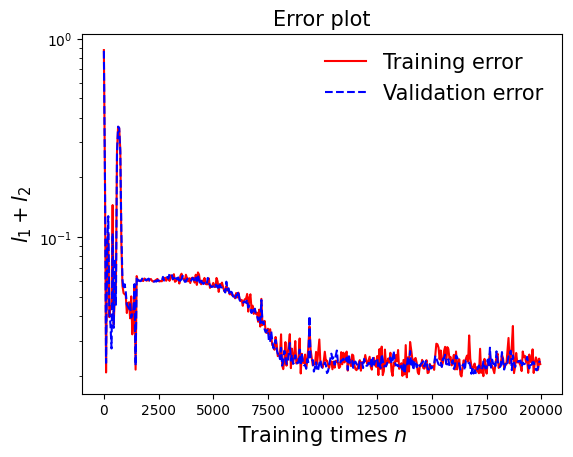

In [55]:
draw_loss(model2)

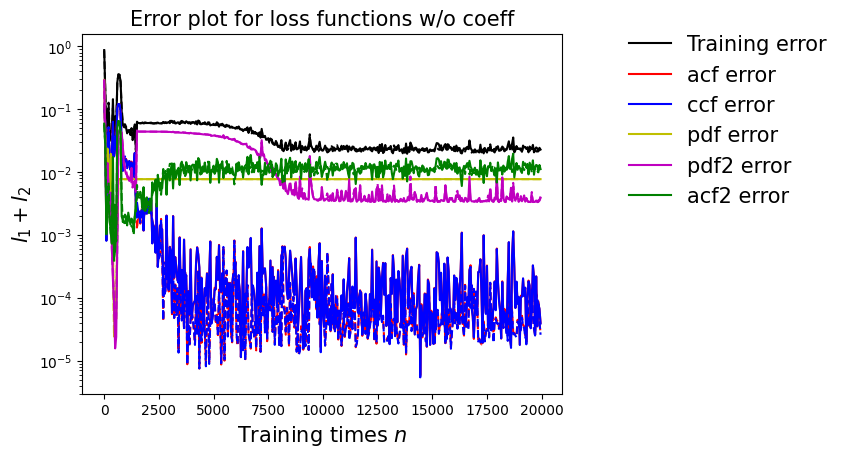

In [56]:
draw_errors(model2)

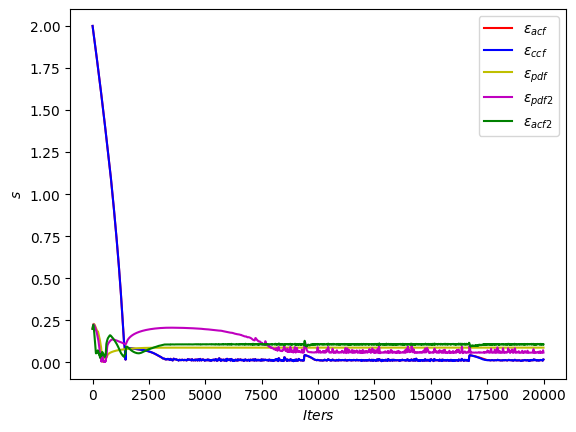

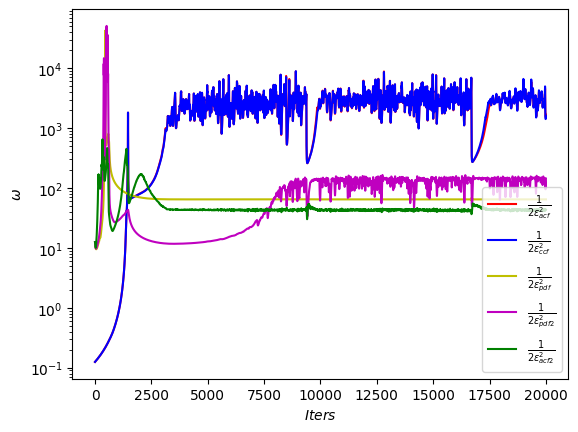

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

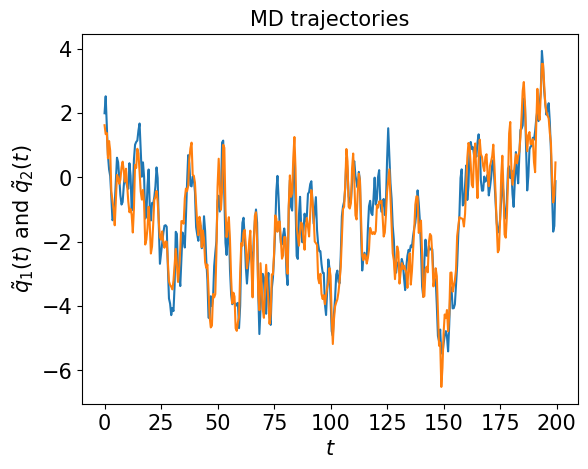

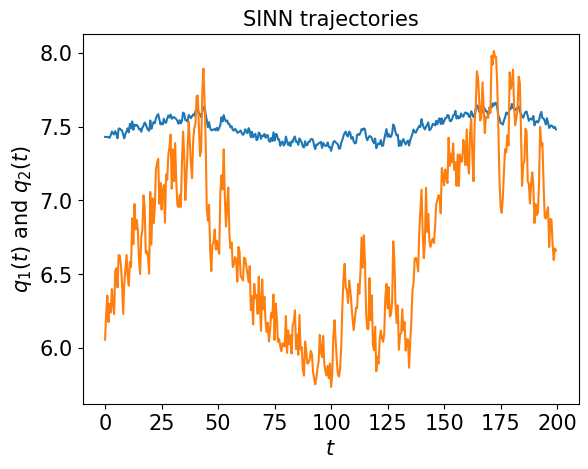

In [58]:
test1(model2)

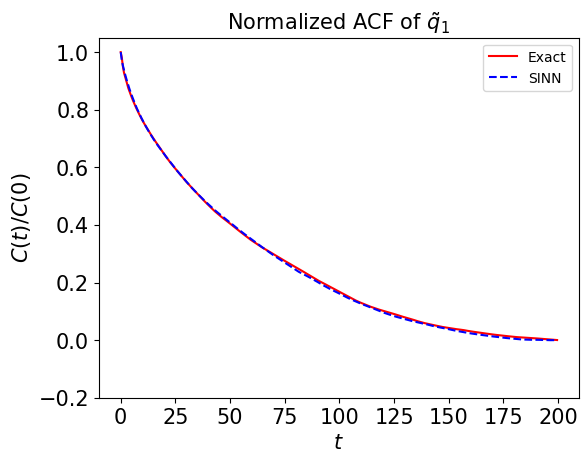

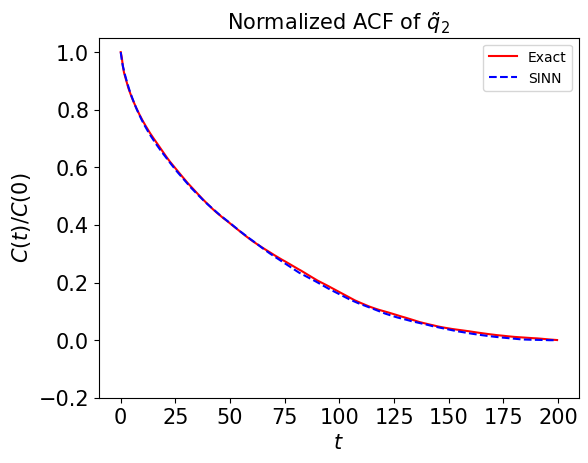

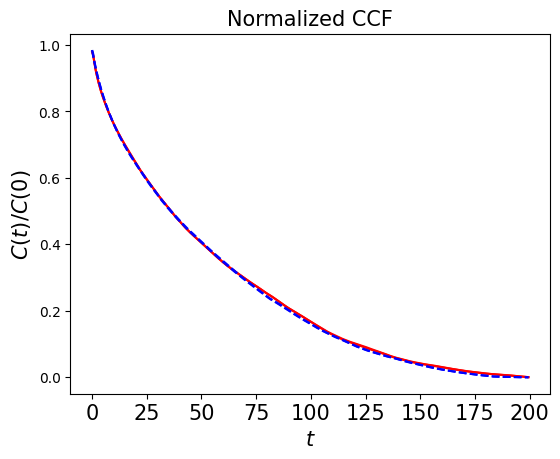

In [59]:
test2(model2)

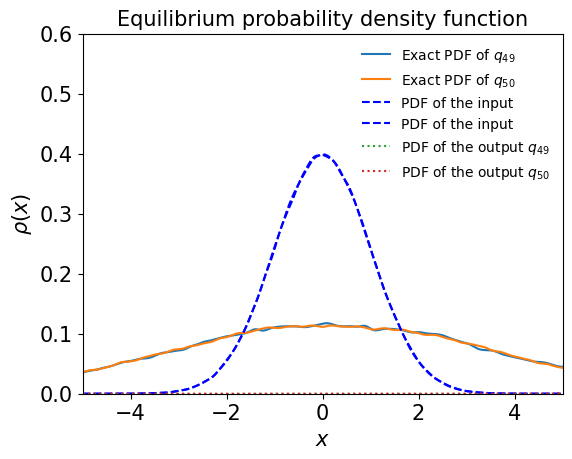

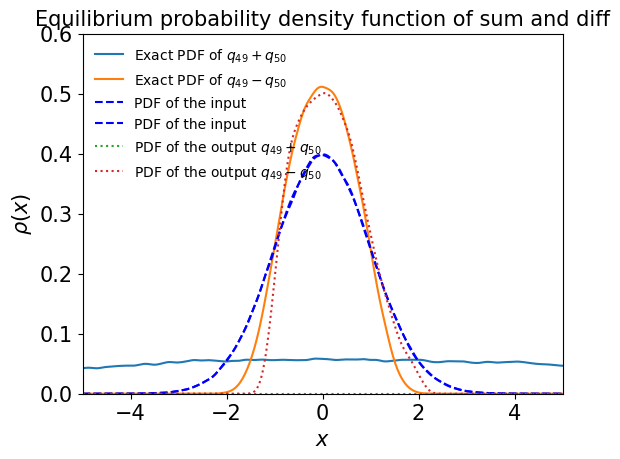

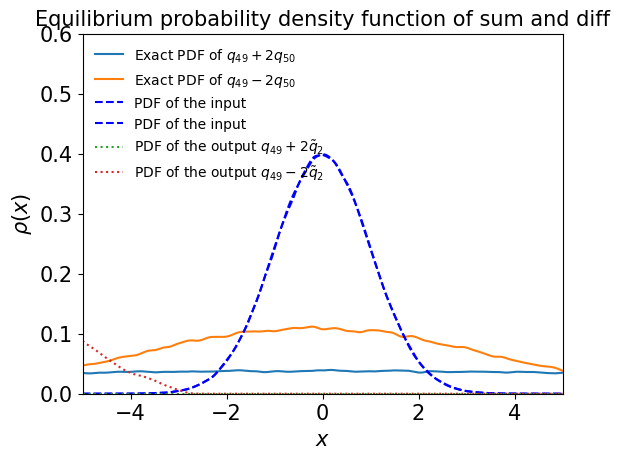

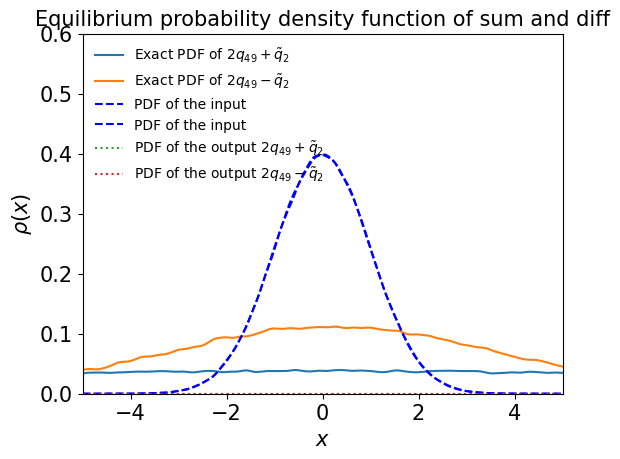

In [60]:
test3(model2)

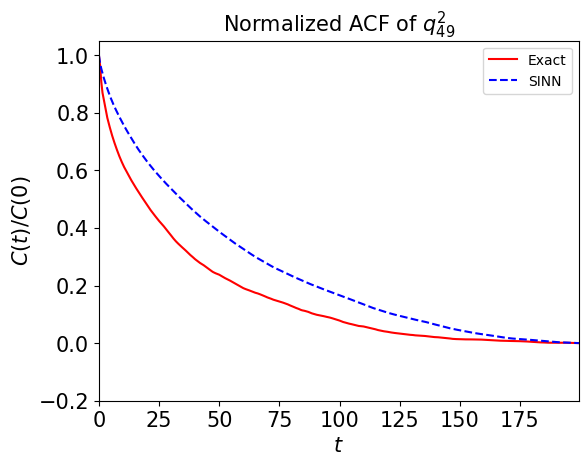

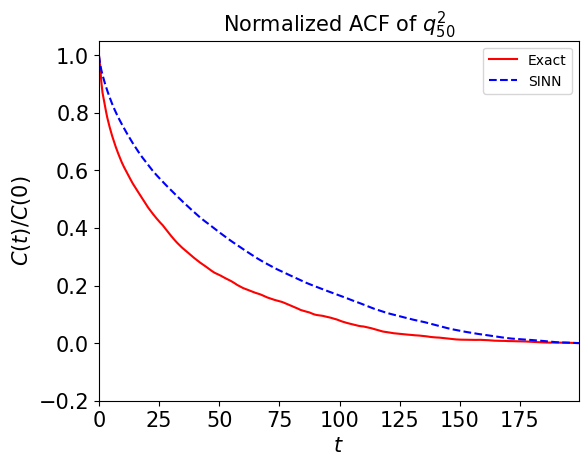

In [61]:
test4(model2)

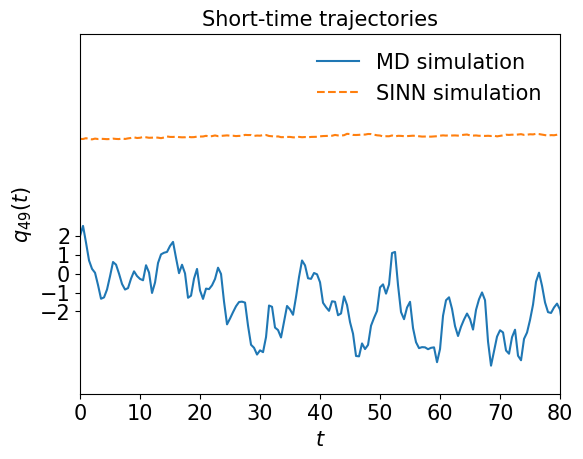

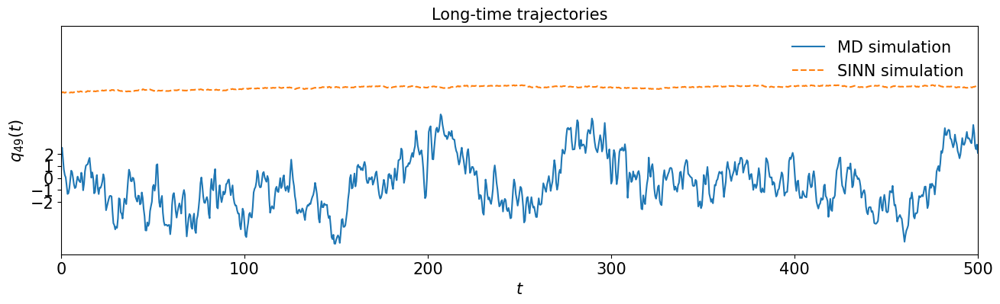

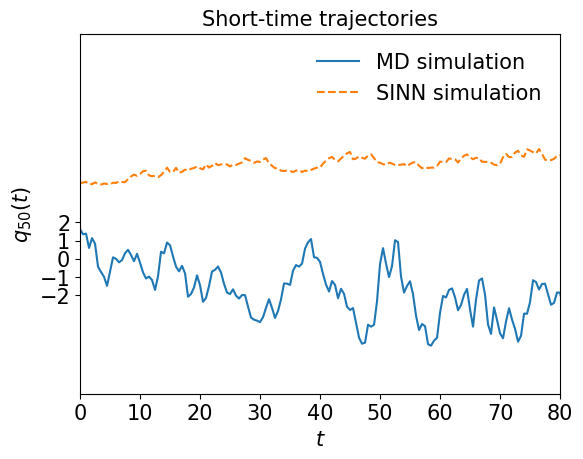

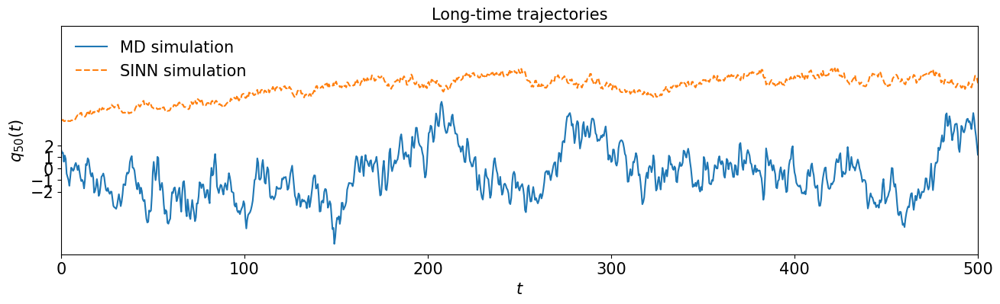

In [62]:
test5(model2)

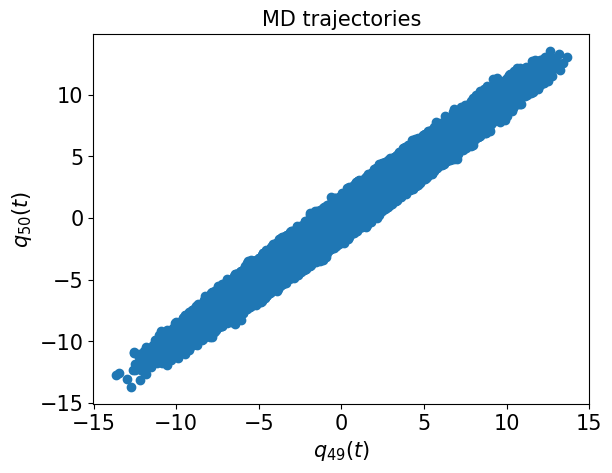

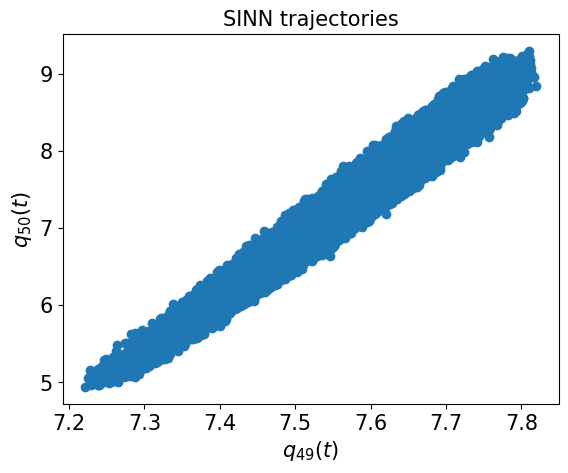

In [63]:
test6(model2)

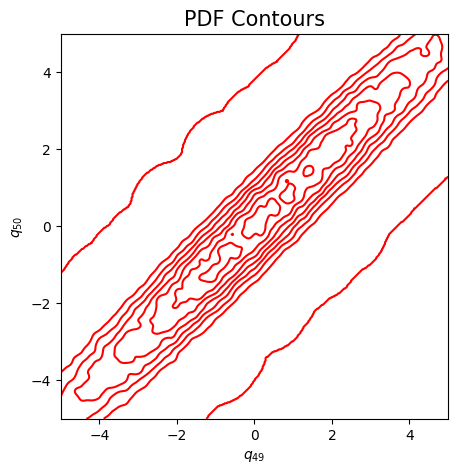

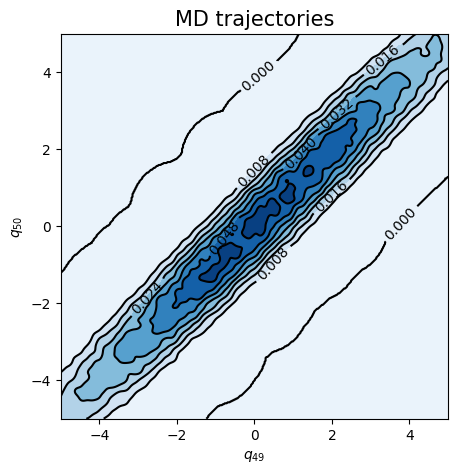

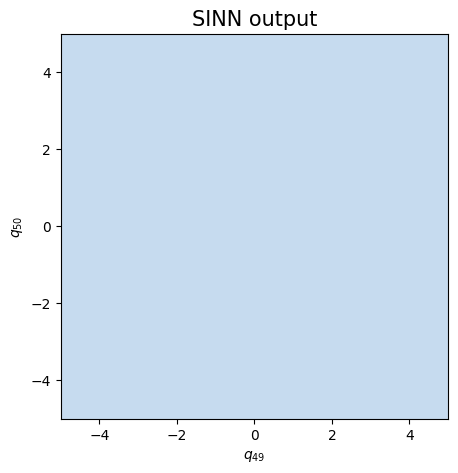

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.9038, 0.9023, acf: 0.11468, ccf: 0.14808, pdf: 0.29330, pdf2: 0.28736, acf2: 0.05891
[50]-th step loss: 0.4309, 0.4252, acf: 0.03115, ccf: 0.33668, pdf: 0.02571, pdf2: 0.02054, acf2: 0.01111
[100]-th step loss: 0.4519, 0.4470, acf: 0.01552, ccf: 0.40130, pdf: 0.01436, pdf2: 0.01323, acf2: 0.00258
[150]-th step loss: 0.4550, 0.4368, acf: 0.02017, ccf: 0.37897, pdf: 0.02850, pdf2: 0.00620, acf2: 0.00295
[200]-th step loss: 0.3795, 0.3808, acf: 0.04762, ccf: 0.28517, pdf: 0.02866, pdf2: 0.00667, acf2: 0.01267
[250]-th step loss: 0.4342, 0.4363, acf: 0.00964, ccf: 0.41008, pdf: 0.00831, pdf2: 0.00652, acf2: 0.00171
[300]-th step loss: 0.4258, 0.3978, acf: 0.03415, ccf: 0.32649, pdf: 0.02264, pdf2: 0.00794, acf2: 0.00657
[350]-th step loss: 0.3805, 0.3740, acf: 0.05538, ccf: 0.27672, pdf: 0.02030, pdf2: 0.00458, acf2: 0.01702
[400]-th step loss: 0.4241, 0.4181, acf: 0.01485, ccf: 0.38985, pdf: 0.00621, pdf2: 0.00555, acf2: 0.00159
[450]-th step loss: 0.4339, 0.4202, acf:

[3850]-th step loss: 0.0331, 0.0312, acf: 0.00012, ccf: 0.00012, pdf: 0.00774, pdf2: 0.01317, acf2: 0.01005
[3900]-th step loss: 0.0326, 0.0292, acf: 0.00077, ccf: 0.00077, pdf: 0.00774, pdf2: 0.01352, acf2: 0.00638
[3950]-th step loss: 0.0408, 0.0340, acf: 0.00017, ccf: 0.00016, pdf: 0.00774, pdf2: 0.01331, acf2: 0.01264
[4000]-th step loss: 0.0575, 0.0697, acf: 0.00685, ccf: 0.00686, pdf: 0.00774, pdf2: 0.01282, acf2: 0.03537
[4050]-th step loss: 0.0332, 0.0329, acf: 0.00031, ccf: 0.00030, pdf: 0.00774, pdf2: 0.01280, acf2: 0.01174
[4100]-th step loss: 0.0290, 0.0296, acf: 0.00043, ccf: 0.00042, pdf: 0.00774, pdf2: 0.01112, acf2: 0.00986
[4150]-th step loss: 0.0289, 0.0305, acf: 0.00021, ccf: 0.00021, pdf: 0.00774, pdf2: 0.01091, acf2: 0.01139
[4200]-th step loss: 0.0291, 0.0295, acf: 0.00014, ccf: 0.00014, pdf: 0.00774, pdf2: 0.01079, acf2: 0.01069
[4250]-th step loss: 0.0287, 0.0302, acf: 0.00005, ccf: 0.00005, pdf: 0.00774, pdf2: 0.01072, acf2: 0.01165
[4300]-th step loss: 0.0279,

[7650]-th step loss: 0.0278, 0.0334, acf: 0.00026, ccf: 0.00020, pdf: 0.00767, pdf2: 0.01136, acf2: 0.01387
[7700]-th step loss: 0.0367, 0.0300, acf: 0.00040, ccf: 0.00039, pdf: 0.00772, pdf2: 0.01302, acf2: 0.00847
[7750]-th step loss: 0.0372, 0.0316, acf: 0.00076, ccf: 0.00075, pdf: 0.00774, pdf2: 0.01331, acf2: 0.00903
[7800]-th step loss: 0.0357, 0.0304, acf: 0.00038, ccf: 0.00038, pdf: 0.00774, pdf2: 0.01233, acf2: 0.00957
[7850]-th step loss: 0.0342, 0.0298, acf: 0.00005, ccf: 0.00006, pdf: 0.00773, pdf2: 0.01123, acf2: 0.01078
[7900]-th step loss: 0.0316, 0.0279, acf: 0.00029, ccf: 0.00029, pdf: 0.00773, pdf2: 0.01158, acf2: 0.00803
[7950]-th step loss: 0.0307, 0.0283, acf: 0.00020, ccf: 0.00012, pdf: 0.00765, pdf2: 0.01039, acf2: 0.00998
[8000]-th step loss: 0.0262, 0.0254, acf: 0.00052, ccf: 0.00053, pdf: 0.00765, pdf2: 0.01056, acf2: 0.00611
[8050]-th step loss: 0.0264, 0.0253, acf: 0.00047, ccf: 0.00055, pdf: 0.00764, pdf2: 0.01027, acf2: 0.00634
[8100]-th step loss: 0.0281,

[11450]-th step loss: 0.0360, 0.0418, acf: 0.01154, ccf: 0.01149, pdf: 0.00774, pdf2: 0.01093, acf2: 0.00006
[11500]-th step loss: 0.0410, 0.0388, acf: 0.01013, ccf: 0.01005, pdf: 0.00774, pdf2: 0.01079, acf2: 0.00007
[11550]-th step loss: 0.0344, 0.0415, acf: 0.01158, ccf: 0.01152, pdf: 0.00774, pdf2: 0.01064, acf2: 0.00006
[11600]-th step loss: 0.0373, 0.0389, acf: 0.01009, ccf: 0.01002, pdf: 0.00774, pdf2: 0.01099, acf2: 0.00007
[11650]-th step loss: 0.0423, 0.0427, acf: 0.01166, ccf: 0.01159, pdf: 0.00774, pdf2: 0.01158, acf2: 0.00008
[11700]-th step loss: 0.0454, 0.0394, acf: 0.01052, ccf: 0.01047, pdf: 0.00774, pdf2: 0.01065, acf2: 0.00006
[11750]-th step loss: 0.0461, 0.0446, acf: 0.01308, ccf: 0.01301, pdf: 0.00774, pdf2: 0.01066, acf2: 0.00014
[11800]-th step loss: 0.0386, 0.0423, acf: 0.01193, ccf: 0.01186, pdf: 0.00774, pdf2: 0.01068, acf2: 0.00007
[11850]-th step loss: 0.0347, 0.0385, acf: 0.00982, ccf: 0.00978, pdf: 0.00774, pdf2: 0.01107, acf2: 0.00011
[11900]-th step los

[15250]-th step loss: 0.0186, 0.0182, acf: 0.00016, ccf: 0.00017, pdf: 0.00422, pdf2: 0.00883, acf2: 0.00483
[15300]-th step loss: 0.0223, 0.0216, acf: 0.00029, ccf: 0.00028, pdf: 0.00600, pdf2: 0.00952, acf2: 0.00556
[15350]-th step loss: 0.0187, 0.0185, acf: 0.00009, ccf: 0.00009, pdf: 0.00389, pdf2: 0.00879, acf2: 0.00564
[15400]-th step loss: 0.0182, 0.0188, acf: 0.00010, ccf: 0.00009, pdf: 0.00411, pdf2: 0.00872, acf2: 0.00578
[15450]-th step loss: 0.0222, 0.0191, acf: 0.00011, ccf: 0.00009, pdf: 0.00415, pdf2: 0.00887, acf2: 0.00591
[15500]-th step loss: 0.0202, 0.0198, acf: 0.00015, ccf: 0.00015, pdf: 0.00400, pdf2: 0.00891, acf2: 0.00662
[15550]-th step loss: 0.0206, 0.0205, acf: 0.00015, ccf: 0.00016, pdf: 0.00476, pdf2: 0.00908, acf2: 0.00636
[15600]-th step loss: 0.0206, 0.0198, acf: 0.00008, ccf: 0.00008, pdf: 0.00447, pdf2: 0.00912, acf2: 0.00606
[15650]-th step loss: 0.0188, 0.0188, acf: 0.00010, ccf: 0.00011, pdf: 0.00393, pdf2: 0.00881, acf2: 0.00579
[15700]-th step los

[19050]-th step loss: 0.0221, 0.0210, acf: 0.00012, ccf: 0.00012, pdf: 0.00471, pdf2: 0.00912, acf2: 0.00689
[19100]-th step loss: 0.0227, 0.0201, acf: 0.00016, ccf: 0.00016, pdf: 0.00422, pdf2: 0.00889, acf2: 0.00665
[19150]-th step loss: 0.0203, 0.0203, acf: 0.00019, ccf: 0.00020, pdf: 0.00406, pdf2: 0.00881, acf2: 0.00700
[19200]-th step loss: 0.0184, 0.0178, acf: 0.00017, ccf: 0.00016, pdf: 0.00406, pdf2: 0.00889, acf2: 0.00456
[19250]-th step loss: 0.0188, 0.0181, acf: 0.00007, ccf: 0.00007, pdf: 0.00384, pdf2: 0.00878, acf2: 0.00538
[19300]-th step loss: 0.0189, 0.0185, acf: 0.00008, ccf: 0.00008, pdf: 0.00397, pdf2: 0.00870, acf2: 0.00569
[19350]-th step loss: 0.0186, 0.0191, acf: 0.00009, ccf: 0.00009, pdf: 0.00410, pdf2: 0.00882, acf2: 0.00602
[19400]-th step loss: 0.0228, 0.0218, acf: 0.00013, ccf: 0.00013, pdf: 0.00483, pdf2: 0.00907, acf2: 0.00761
[19450]-th step loss: 0.0183, 0.0177, acf: 0.00008, ccf: 0.00007, pdf: 0.00390, pdf2: 0.00878, acf2: 0.00485
[19500]-th step los

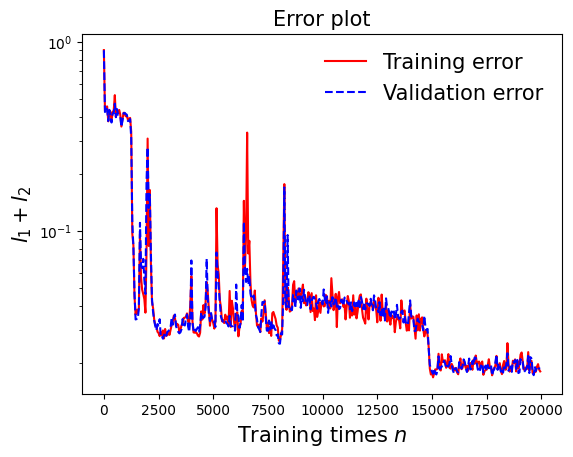

In [66]:
draw_loss(model3)

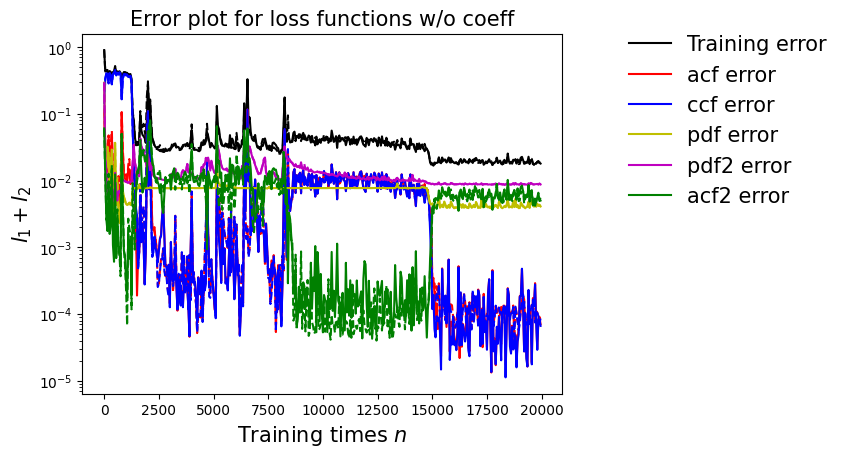

In [67]:
draw_errors(model3)

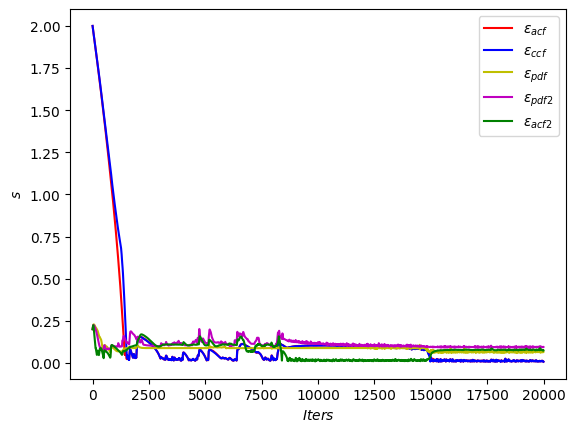

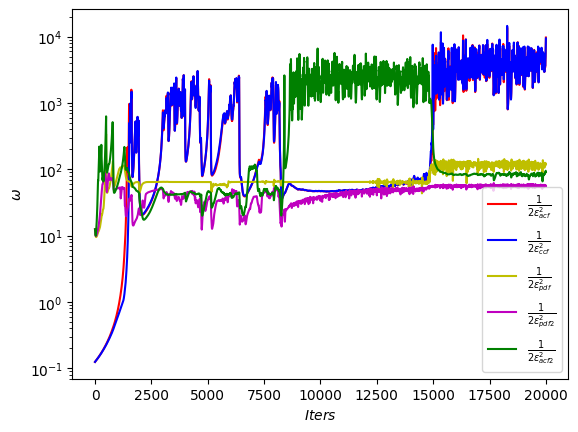

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

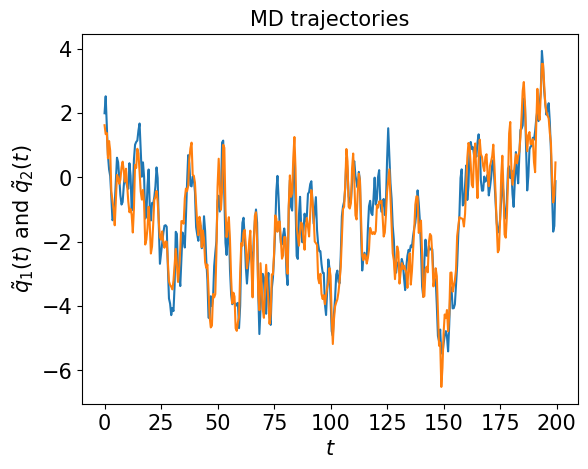

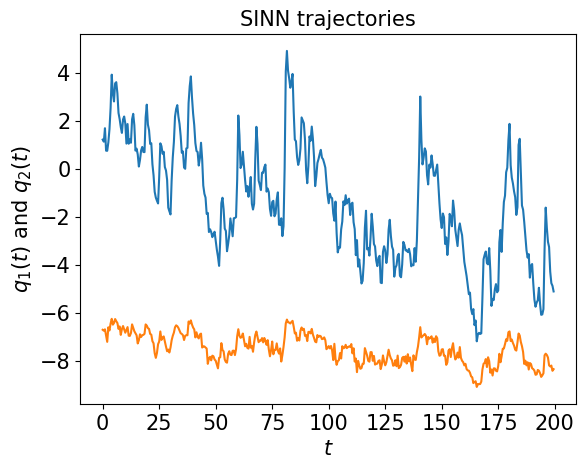

In [69]:
test1(model3)

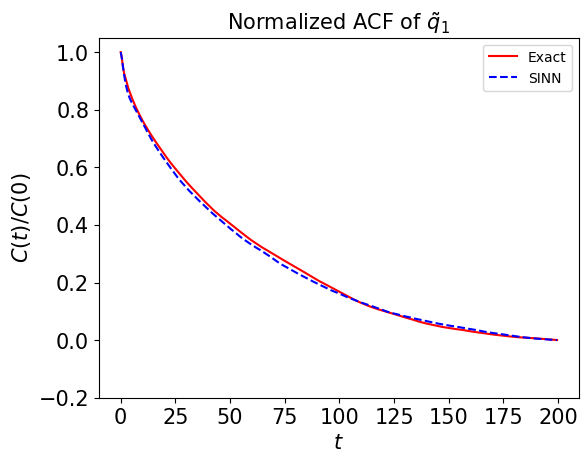

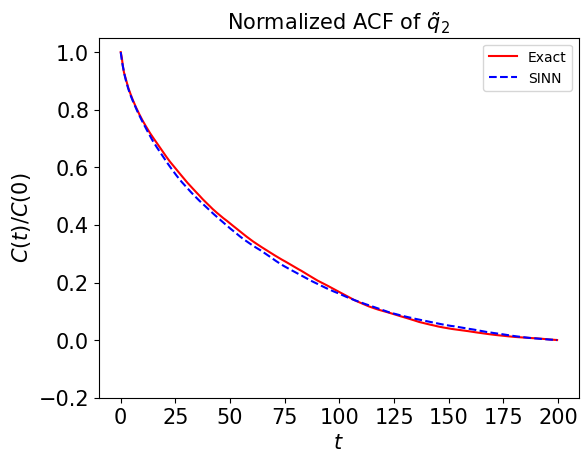

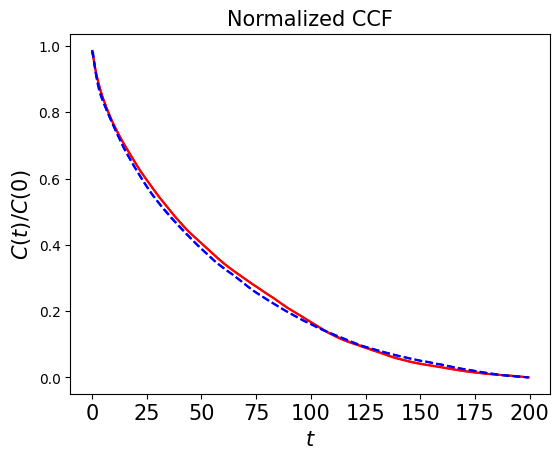

In [70]:
test2(model3)

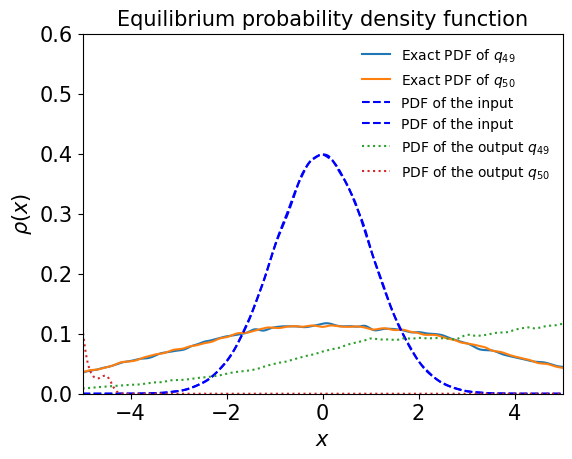

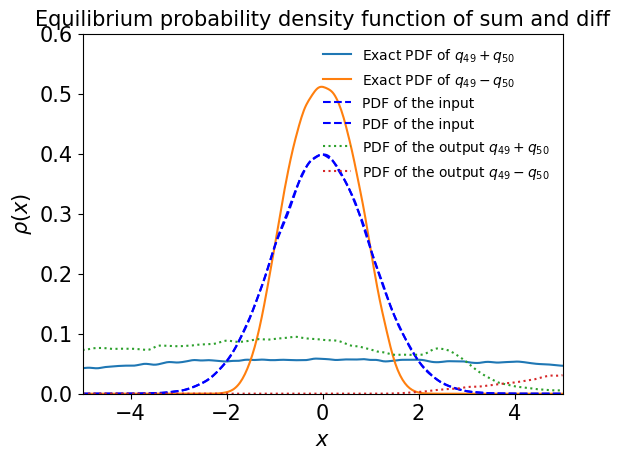

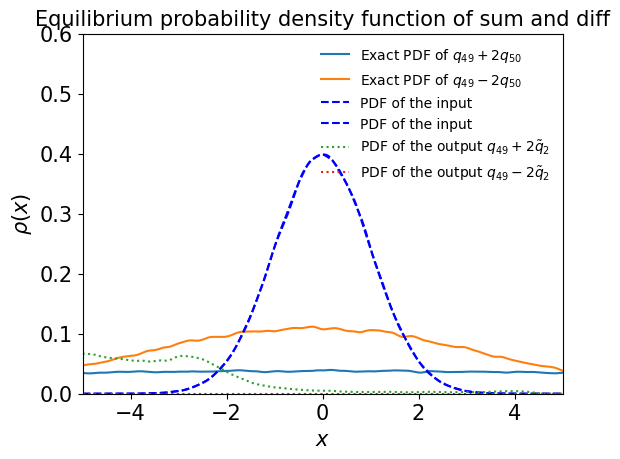

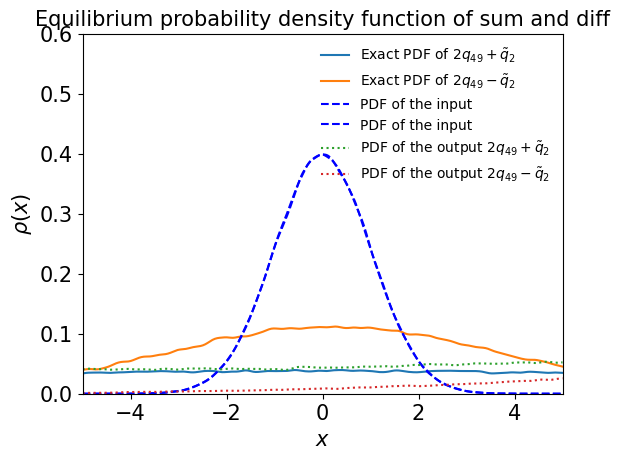

In [71]:
test3(model3)

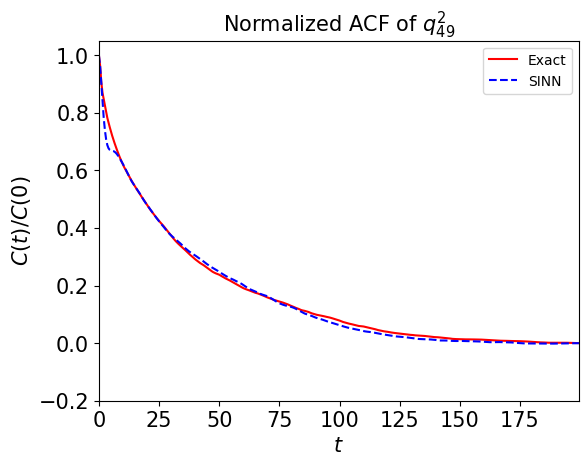

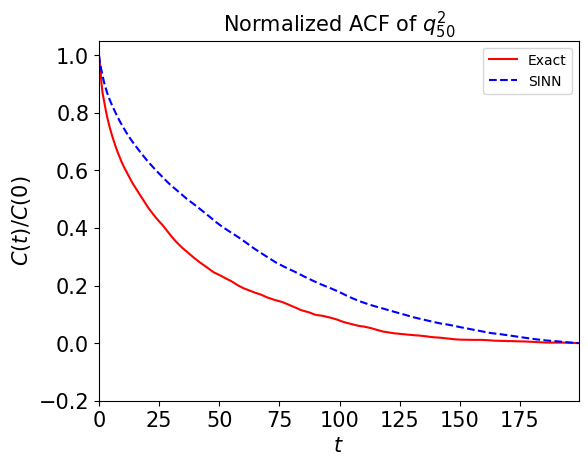

In [72]:
test4(model3)

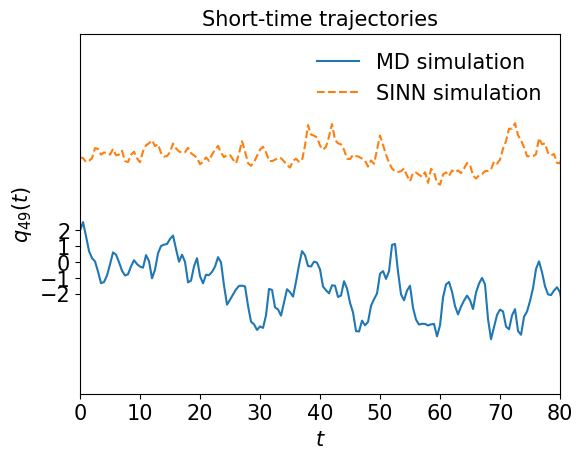

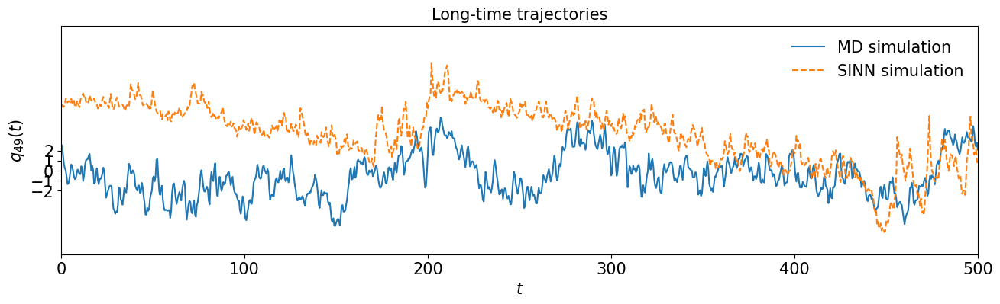

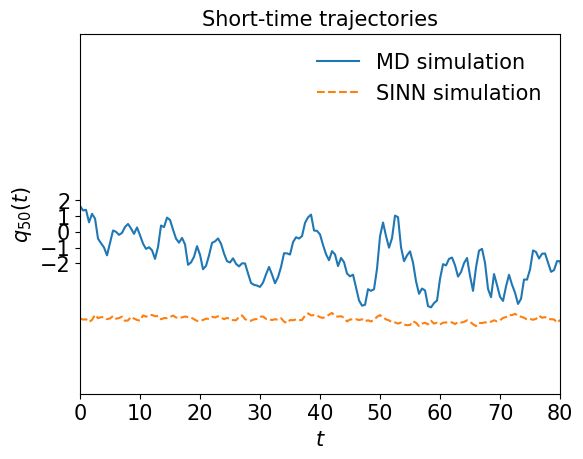

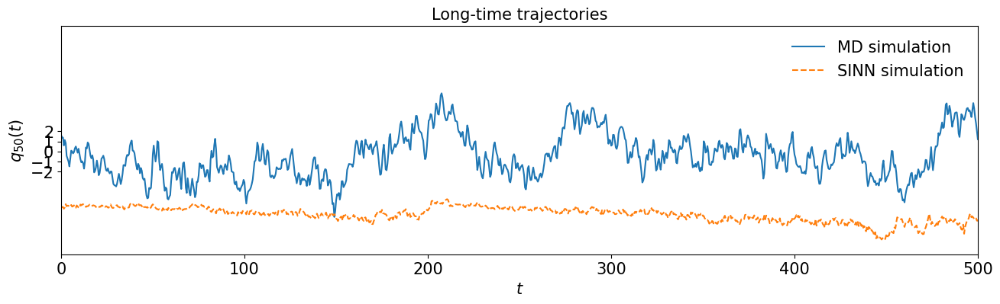

In [73]:
test5(model3)

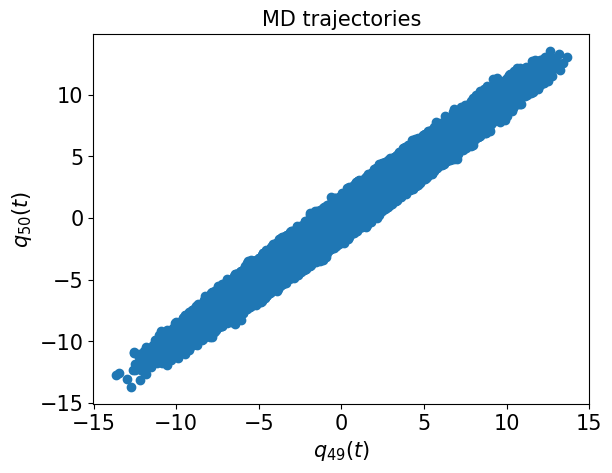

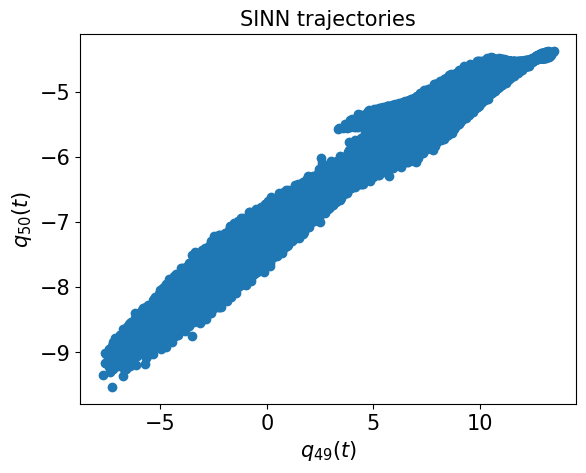

In [74]:
test6(model3)

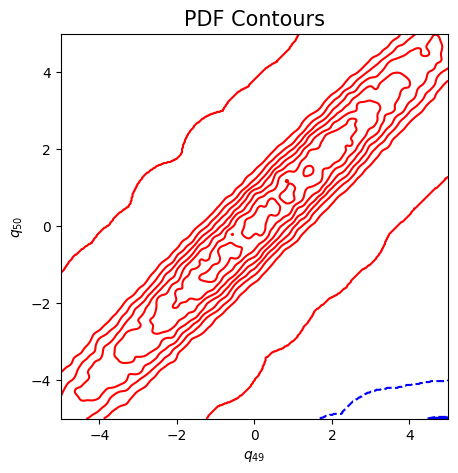

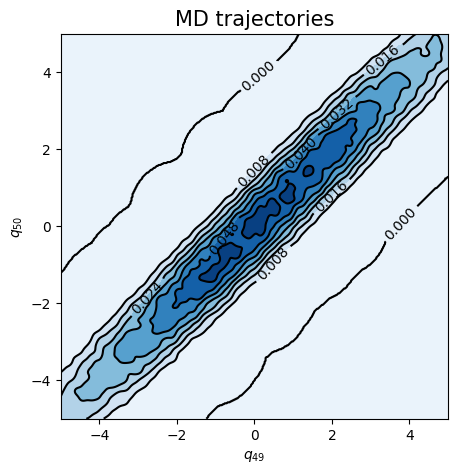

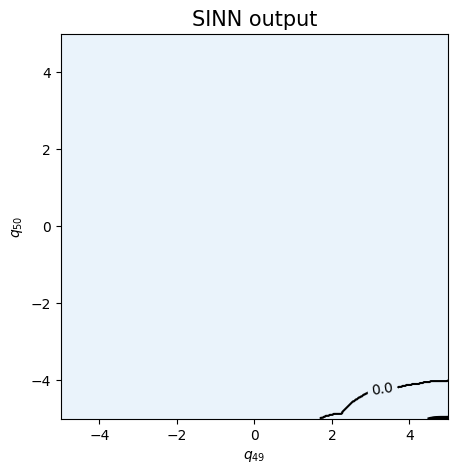

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8887, 0.8752, acf: 0.11305, ccf: 0.12168, pdf: 0.29367, pdf2: 0.28932, acf2: 0.05752
[50]-th step loss: 0.2506, 0.2588, acf: 0.03862, ccf: 0.16526, pdf: 0.02242, pdf2: 0.02008, acf2: 0.01247
[100]-th step loss: 0.1622, 0.1573, acf: 0.02136, ccf: 0.12018, pdf: 0.00710, pdf2: 0.00680, acf2: 0.00188
[150]-th step loss: 0.5183, 0.5016, acf: 0.07987, ccf: 0.21984, pdf: 0.14176, pdf2: 0.02777, acf2: 0.03235
[200]-th step loss: 0.4533, 0.4200, acf: 0.05833, ccf: 0.25623, pdf: 0.07088, pdf2: 0.01810, acf2: 0.01644
[250]-th step loss: 0.5063, 0.4794, acf: 0.02013, ccf: 0.36494, pdf: 0.07293, pdf2: 0.01948, acf2: 0.00187
[300]-th step loss: 0.4843, 0.4582, acf: 0.00865, ccf: 0.42161, pdf: 0.01705, pdf2: 0.00998, acf2: 0.00086
[350]-th step loss: 0.0880, 0.0964, acf: 0.01712, ccf: 0.04079, pdf: 0.02093, pdf2: 0.00999, acf2: 0.00757
[400]-th step loss: 0.1858, 0.1452, acf: 0.00758, ccf: 0.10125, pdf: 0.02313, pdf2: 0.01004, acf2: 0.00320
[450]-th step loss: 0.1415, 0.1377, acf:

[3850]-th step loss: 0.5088, 0.5217, acf: 0.00012, ccf: 0.49903, pdf: 0.00774, pdf2: 0.00346, acf2: 0.01132
[3900]-th step loss: 0.5074, 0.5286, acf: 0.00004, ccf: 0.50532, pdf: 0.00774, pdf2: 0.00361, acf2: 0.01184
[3950]-th step loss: 0.5183, 0.5339, acf: 0.00011, ccf: 0.50971, pdf: 0.00774, pdf2: 0.00363, acf2: 0.01271
[4000]-th step loss: 0.5362, 0.5298, acf: 0.00009, ccf: 0.50627, pdf: 0.00774, pdf2: 0.00345, acf2: 0.01227
[4050]-th step loss: 0.5519, 0.5583, acf: 0.00060, ccf: 0.52954, pdf: 0.00774, pdf2: 0.00384, acf2: 0.01659
[4100]-th step loss: 0.4850, 0.5302, acf: 0.00010, ccf: 0.50665, pdf: 0.00774, pdf2: 0.00347, acf2: 0.01227
[4150]-th step loss: 0.5210, 0.5251, acf: 0.00005, ccf: 0.50208, pdf: 0.00774, pdf2: 0.00377, acf2: 0.01143
[4200]-th step loss: 0.5276, 0.5126, acf: 0.00013, ccf: 0.49192, pdf: 0.00774, pdf2: 0.00357, acf2: 0.00928
[4250]-th step loss: 0.5479, 0.5390, acf: 0.00015, ccf: 0.51310, pdf: 0.00774, pdf2: 0.00475, acf2: 0.01326
[4300]-th step loss: 0.5258,

[7650]-th step loss: 0.5292, 0.5232, acf: 0.00007, ccf: 0.50184, pdf: 0.00774, pdf2: 0.00335, acf2: 0.01023
[7700]-th step loss: 0.5617, 0.5369, acf: 0.00010, ccf: 0.51371, pdf: 0.00774, pdf2: 0.00328, acf2: 0.01202
[7750]-th step loss: 0.5118, 0.5209, acf: 0.00007, ccf: 0.50013, pdf: 0.00774, pdf2: 0.00344, acf2: 0.00949
[7800]-th step loss: 0.5141, 0.5454, acf: 0.00034, ccf: 0.51836, pdf: 0.00773, pdf2: 0.00516, acf2: 0.01381
[7850]-th step loss: 0.5413, 0.5439, acf: 0.00024, ccf: 0.51962, pdf: 0.00774, pdf2: 0.00330, acf2: 0.01299
[7900]-th step loss: 0.5293, 0.5297, acf: 0.00007, ccf: 0.50755, pdf: 0.00774, pdf2: 0.00347, acf2: 0.01091
[7950]-th step loss: 0.5567, 0.5473, acf: 0.00024, ccf: 0.52253, pdf: 0.00774, pdf2: 0.00346, acf2: 0.01338
[8000]-th step loss: 0.5346, 0.5367, acf: 0.00010, ccf: 0.51359, pdf: 0.00774, pdf2: 0.00342, acf2: 0.01188
[8050]-th step loss: 0.5108, 0.5481, acf: 0.00031, ccf: 0.52309, pdf: 0.00773, pdf2: 0.00330, acf2: 0.01367
[8100]-th step loss: 0.5377,

[11450]-th step loss: 0.5018, 0.5105, acf: 0.00014, ccf: 0.49202, pdf: 0.00772, pdf2: 0.00328, acf2: 0.00735
[11500]-th step loss: 0.5100, 0.5243, acf: 0.00004, ccf: 0.50415, pdf: 0.00773, pdf2: 0.00330, acf2: 0.00904
[11550]-th step loss: 0.5132, 0.5149, acf: 0.00005, ccf: 0.49598, pdf: 0.00773, pdf2: 0.00330, acf2: 0.00789
[11600]-th step loss: 0.5481, 0.5193, acf: 0.00003, ccf: 0.49885, pdf: 0.00773, pdf2: 0.00371, acf2: 0.00894
[11650]-th step loss: 0.5245, 0.5242, acf: 0.00003, ccf: 0.50334, pdf: 0.00773, pdf2: 0.00345, acf2: 0.00962
[11700]-th step loss: 0.5410, 0.5203, acf: 0.00006, ccf: 0.49929, pdf: 0.00773, pdf2: 0.00375, acf2: 0.00945
[11750]-th step loss: 0.5083, 0.5173, acf: 0.00005, ccf: 0.49709, pdf: 0.00773, pdf2: 0.00353, acf2: 0.00888
[11800]-th step loss: 0.5318, 0.5227, acf: 0.00003, ccf: 0.50228, pdf: 0.00773, pdf2: 0.00336, acf2: 0.00934
[11850]-th step loss: 0.5166, 0.5057, acf: 0.00018, ccf: 0.48725, pdf: 0.00773, pdf2: 0.00340, acf2: 0.00715
[11900]-th step los

[15250]-th step loss: 0.5033, 0.4946, acf: 0.00010, ccf: 0.47629, pdf: 0.00771, pdf2: 0.00337, acf2: 0.00707
[15300]-th step loss: 0.5007, 0.4948, acf: 0.00003, ccf: 0.47597, pdf: 0.00770, pdf2: 0.00330, acf2: 0.00780
[15350]-th step loss: 0.4805, 0.4880, acf: 0.00007, ccf: 0.46917, pdf: 0.00767, pdf2: 0.00368, acf2: 0.00743
[15400]-th step loss: 0.4949, 0.4989, acf: 0.00007, ccf: 0.47874, pdf: 0.00767, pdf2: 0.00330, acf2: 0.00916
[15450]-th step loss: 0.4836, 0.4884, acf: 0.00007, ccf: 0.46999, pdf: 0.00769, pdf2: 0.00334, acf2: 0.00734
[15500]-th step loss: 0.4761, 0.4884, acf: 0.00008, ccf: 0.46921, pdf: 0.00771, pdf2: 0.00332, acf2: 0.00807
[15550]-th step loss: 0.4615, 0.4674, acf: 0.00016, ccf: 0.44973, pdf: 0.00771, pdf2: 0.00336, acf2: 0.00643
[15600]-th step loss: 0.4539, 0.4370, acf: 0.00019, ccf: 0.42008, pdf: 0.00770, pdf2: 0.00336, acf2: 0.00571
[15650]-th step loss: 0.4342, 0.4409, acf: 0.00006, ccf: 0.42300, pdf: 0.00772, pdf2: 0.00333, acf2: 0.00680
[15700]-th step los

[19050]-th step loss: 0.0190, 0.0163, acf: 0.00038, ccf: 0.00037, pdf: 0.00771, pdf2: 0.00358, acf2: 0.00426
[19100]-th step loss: 0.0167, 0.0163, acf: 0.00028, ccf: 0.00028, pdf: 0.00772, pdf2: 0.00344, acf2: 0.00458
[19150]-th step loss: 0.0167, 0.0167, acf: 0.00181, ccf: 0.00180, pdf: 0.00772, pdf2: 0.00391, acf2: 0.00151
[19200]-th step loss: 0.0168, 0.0160, acf: 0.00104, ccf: 0.00103, pdf: 0.00772, pdf2: 0.00367, acf2: 0.00260
[19250]-th step loss: 0.0162, 0.0156, acf: 0.00088, ccf: 0.00086, pdf: 0.00780, pdf2: 0.00355, acf2: 0.00253
[19300]-th step loss: 0.0217, 0.0174, acf: 0.00077, ccf: 0.00077, pdf: 0.00771, pdf2: 0.00361, acf2: 0.00449
[19350]-th step loss: 0.0177, 0.0165, acf: 0.00036, ccf: 0.00036, pdf: 0.00773, pdf2: 0.00346, acf2: 0.00461
[19400]-th step loss: 0.0189, 0.0165, acf: 0.00015, ccf: 0.00015, pdf: 0.00772, pdf2: 0.00347, acf2: 0.00501
[19450]-th step loss: 0.0212, 0.0185, acf: 0.00016, ccf: 0.00016, pdf: 0.00774, pdf2: 0.00495, acf2: 0.00548
[19500]-th step los

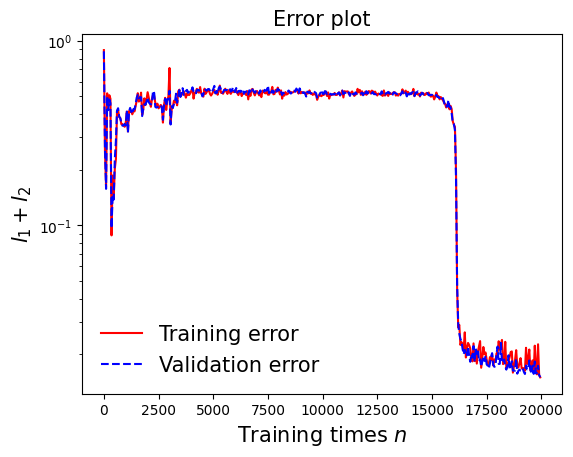

In [77]:
draw_loss(model4)

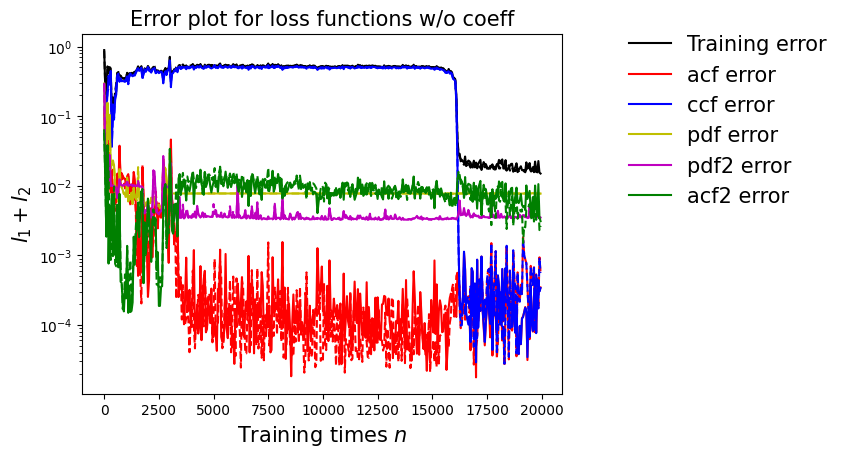

In [78]:
draw_errors(model4)

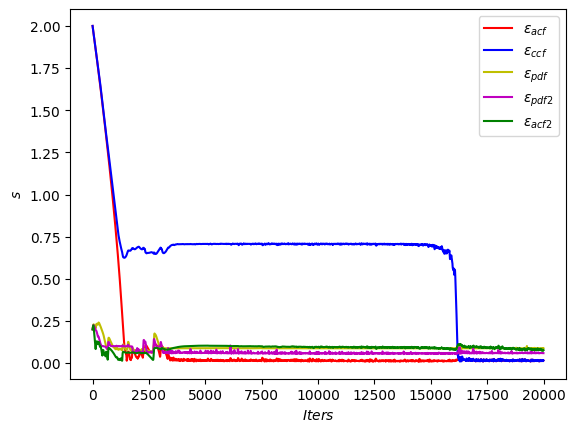

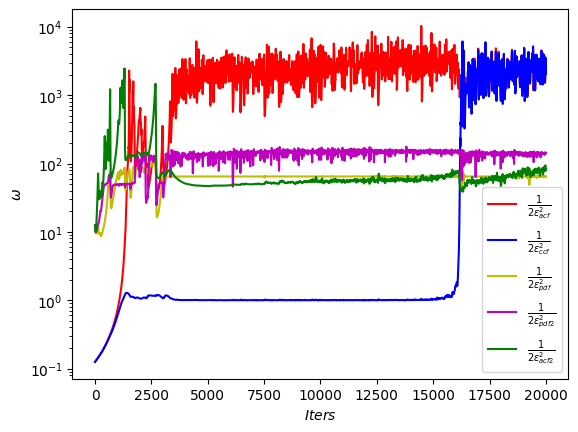

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

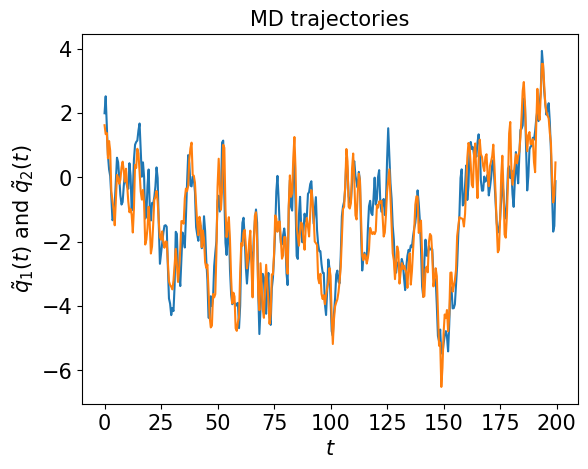

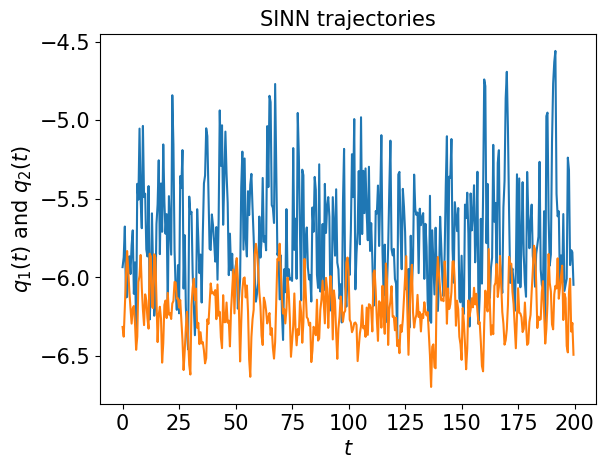

In [80]:
test1(model4)

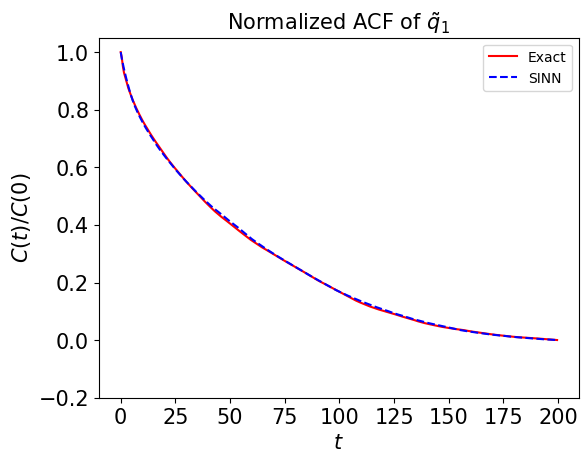

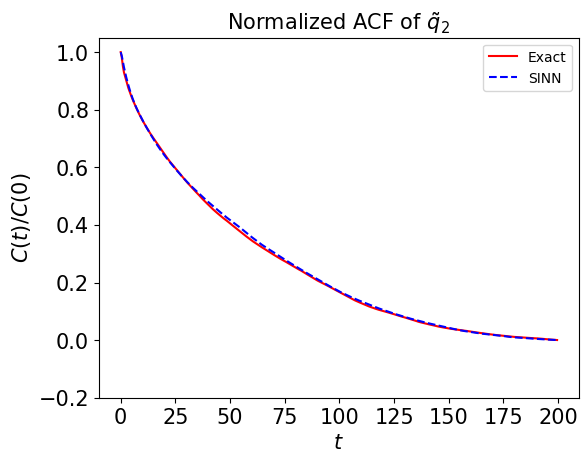

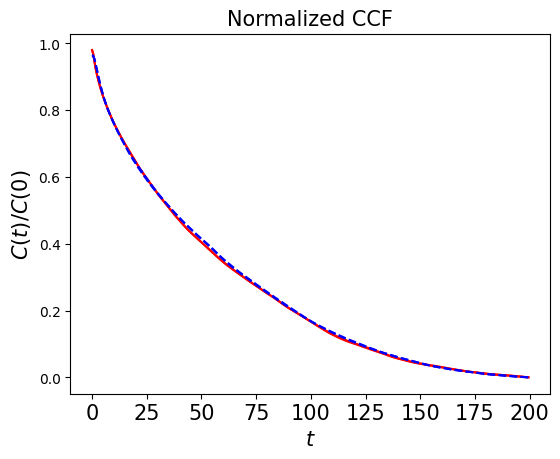

In [81]:
test2(model4)

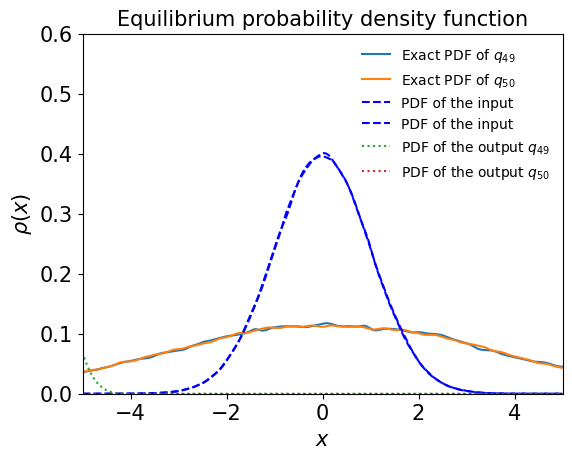

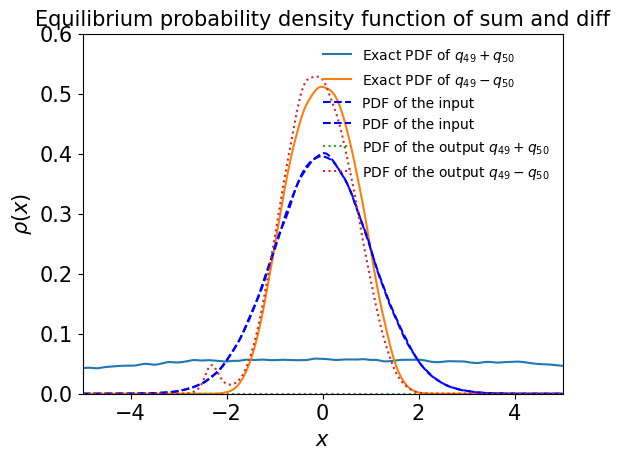

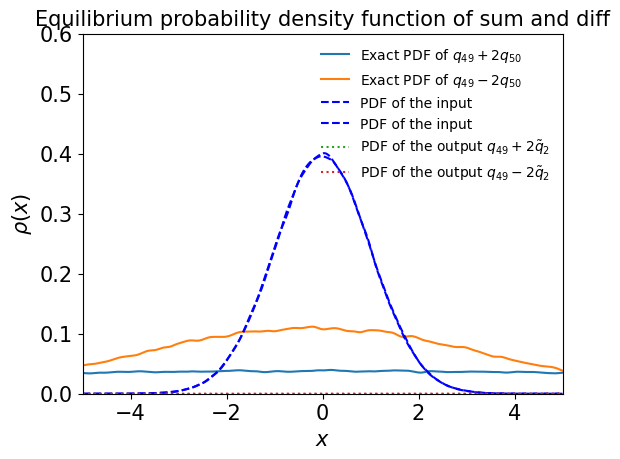

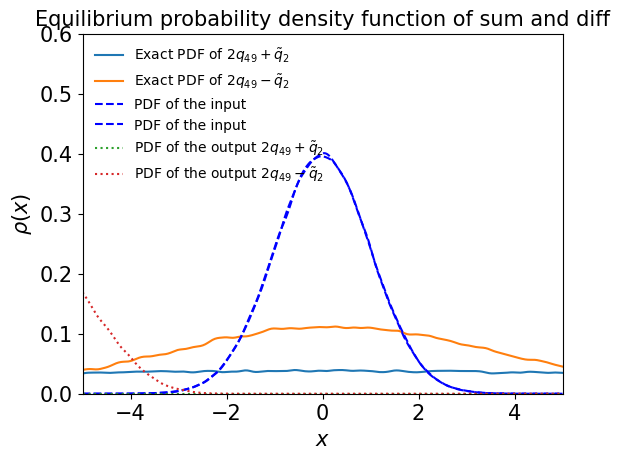

In [82]:
test3(model4)

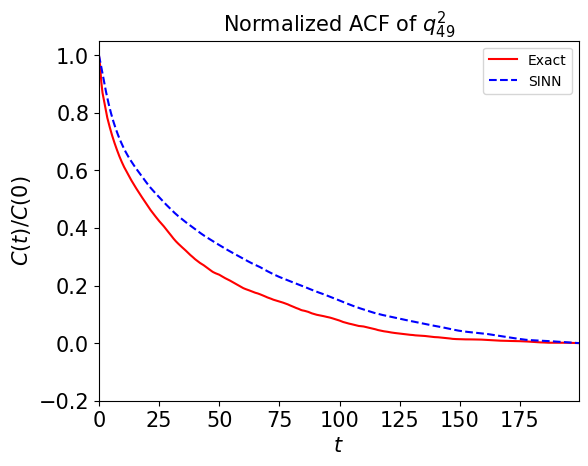

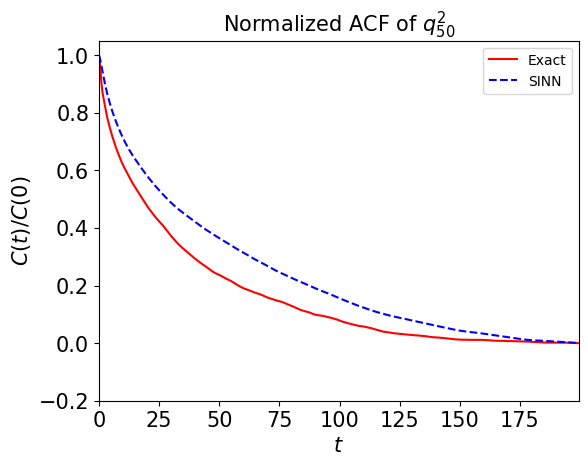

In [83]:
test4(model4)

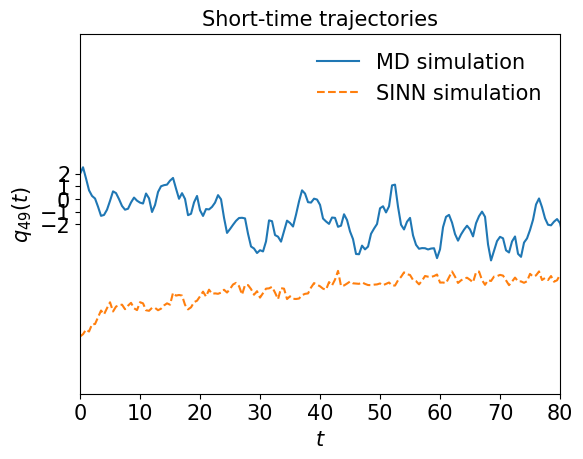

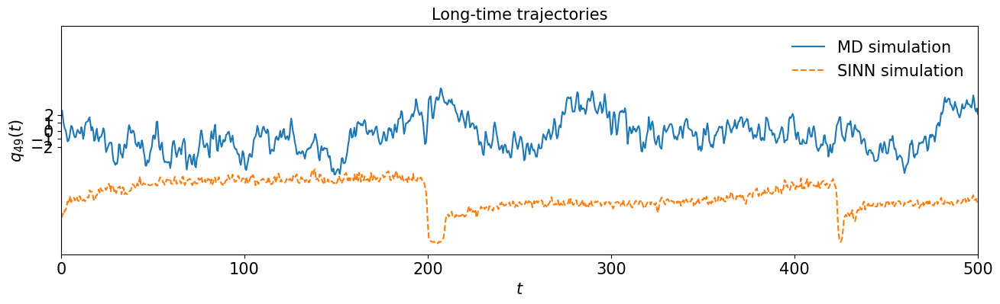

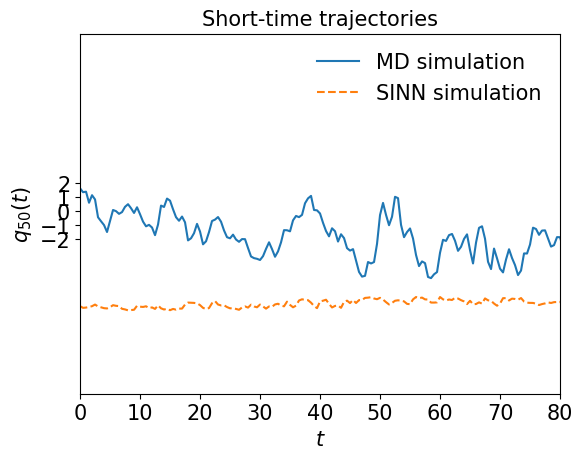

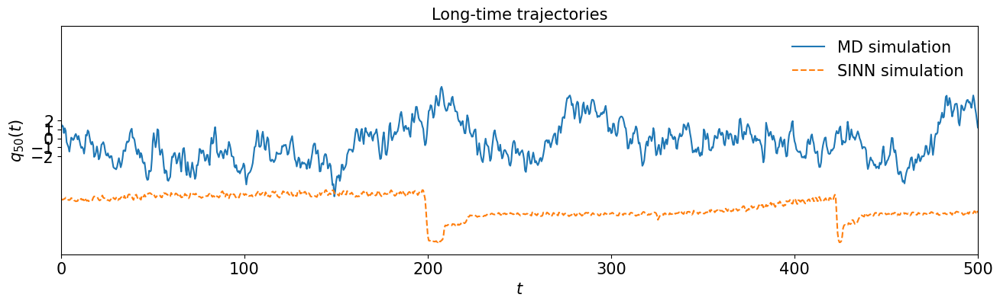

In [84]:
test5(model4)

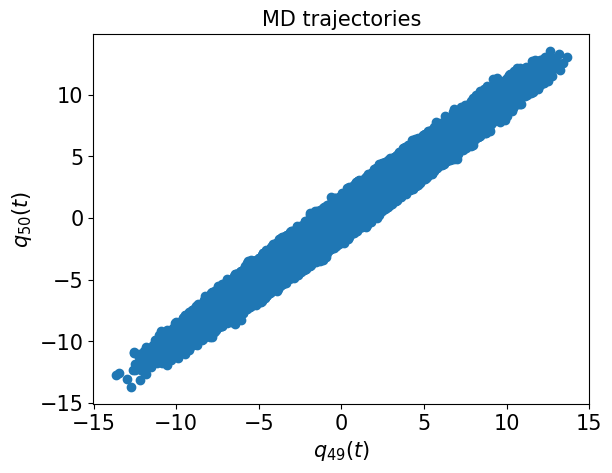

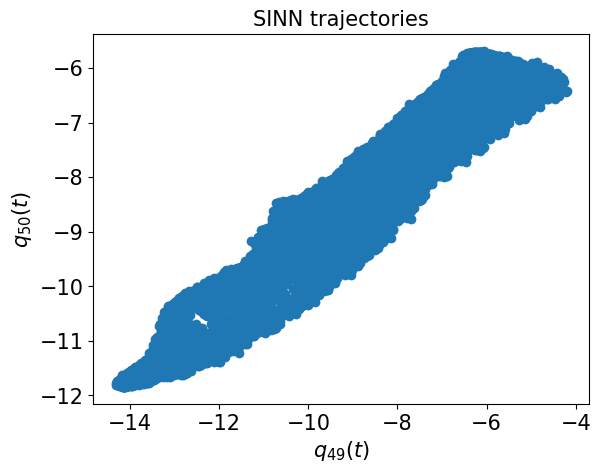

In [85]:
test6(model4)

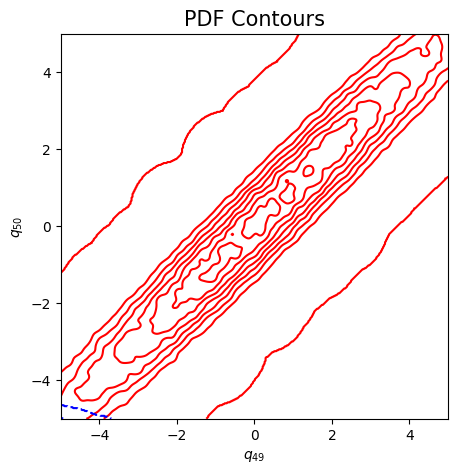

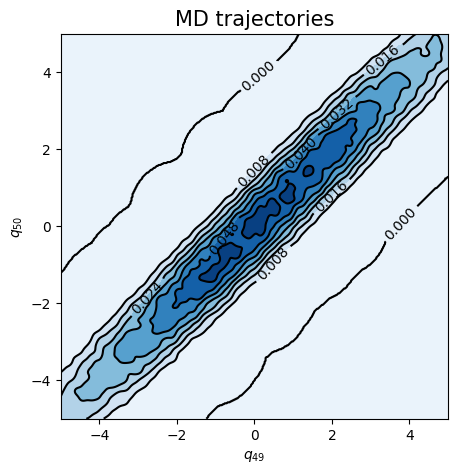

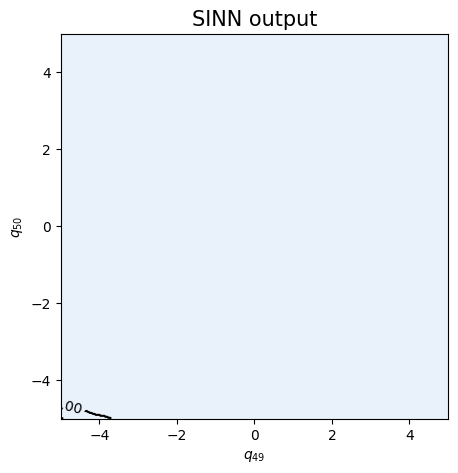

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8986, 0.8982, acf: 0.11365, ccf: 0.14494, pdf: 0.29350, pdf2: 0.28809, acf2: 0.05805
[50]-th step loss: 0.4435, 0.4196, acf: 0.03815, ccf: 0.32139, pdf: 0.02272, pdf2: 0.03152, acf2: 0.00579
[100]-th step loss: 0.4284, 0.4382, acf: 0.02031, ccf: 0.37669, pdf: 0.01462, pdf2: 0.02104, acf2: 0.00554
[150]-th step loss: 0.4896, 0.5016, acf: 0.00438, ccf: 0.46262, pdf: 0.01278, pdf2: 0.02027, acf2: 0.00151
[200]-th step loss: 0.5282, 0.5539, acf: 0.00049, ccf: 0.48293, pdf: 0.03724, pdf2: 0.02895, acf2: 0.00430
[250]-th step loss: 0.3920, 0.3920, acf: 0.09866, ccf: 0.17468, pdf: 0.04363, pdf2: 0.02955, acf2: 0.04543
[300]-th step loss: 0.5811, 0.4549, acf: 0.00146, ccf: 0.43534, pdf: 0.00503, pdf2: 0.01134, acf2: 0.00170
[350]-th step loss: 0.2785, 0.2670, acf: 0.02394, ccf: 0.22261, pdf: 0.00628, pdf2: 0.01255, acf2: 0.00159
[400]-th step loss: 0.4546, 0.4491, acf: 0.00573, ccf: 0.43148, pdf: 0.00085, pdf2: 0.00887, acf2: 0.00214
[450]-th step loss: 0.2769, 0.2747, acf:

[3850]-th step loss: 0.4825, 0.4778, acf: 0.00110, ccf: 0.46625, pdf: 0.00086, pdf2: 0.00809, acf2: 0.00152
[3900]-th step loss: 0.4816, 0.4799, acf: 0.00075, ccf: 0.46925, pdf: 0.00080, pdf2: 0.00801, acf2: 0.00107
[3950]-th step loss: 0.4622, 0.4675, acf: 0.00134, ccf: 0.45700, pdf: 0.00063, pdf2: 0.00787, acf2: 0.00062
[4000]-th step loss: 0.4726, 0.4845, acf: 0.00044, ccf: 0.47473, pdf: 0.00046, pdf2: 0.00777, acf2: 0.00111
[4050]-th step loss: 0.4660, 0.4779, acf: 0.00073, ccf: 0.46782, pdf: 0.00036, pdf2: 0.00779, acf2: 0.00117
[4100]-th step loss: 0.4426, 0.4749, acf: 0.00072, ccf: 0.46463, pdf: 0.00078, pdf2: 0.00780, acf2: 0.00102
[4150]-th step loss: 0.4533, 0.4694, acf: 0.00120, ccf: 0.45902, pdf: 0.00094, pdf2: 0.00772, acf2: 0.00050
[4200]-th step loss: 0.4732, 0.4793, acf: 0.00081, ccf: 0.47001, pdf: 0.00036, pdf2: 0.00783, acf2: 0.00025
[4250]-th step loss: 0.3864, 0.3837, acf: 0.02000, ccf: 0.34234, pdf: 0.00469, pdf2: 0.00952, acf2: 0.00712
[4300]-th step loss: 0.3601,

[7650]-th step loss: 0.0428, 0.0337, acf: 0.00789, ccf: 0.00837, pdf: 0.00769, pdf2: 0.00955, acf2: 0.00016
[7700]-th step loss: 0.0322, 0.0283, acf: 0.00497, ccf: 0.00502, pdf: 0.00766, pdf2: 0.00943, acf2: 0.00119
[7750]-th step loss: 0.0335, 0.0282, acf: 0.00504, ccf: 0.00512, pdf: 0.00768, pdf2: 0.00944, acf2: 0.00093
[7800]-th step loss: 0.0331, 0.0313, acf: 0.00690, ccf: 0.00701, pdf: 0.00764, pdf2: 0.00942, acf2: 0.00031
[7850]-th step loss: 0.0304, 0.0305, acf: 0.00581, ccf: 0.00664, pdf: 0.00776, pdf2: 0.00976, acf2: 0.00058
[7900]-th step loss: 0.0387, 0.0333, acf: 0.00549, ccf: 0.00765, pdf: 0.00912, pdf2: 0.01027, acf2: 0.00082
[7950]-th step loss: 0.0369, 0.0353, acf: 0.00851, ccf: 0.00945, pdf: 0.00755, pdf2: 0.00969, acf2: 0.00009
[8000]-th step loss: 0.0320, 0.0336, acf: 0.00788, ccf: 0.00837, pdf: 0.00744, pdf2: 0.00972, acf2: 0.00016
[8050]-th step loss: 0.0334, 0.0326, acf: 0.00759, ccf: 0.00807, pdf: 0.00738, pdf2: 0.00941, acf2: 0.00012
[8100]-th step loss: 0.0283,

[11450]-th step loss: 0.0167, 0.0161, acf: 0.00005, ccf: 0.00004, pdf: 0.00416, pdf2: 0.00915, acf2: 0.00271
[11500]-th step loss: 0.0149, 0.0148, acf: 0.00017, ccf: 0.00014, pdf: 0.00382, pdf2: 0.00921, acf2: 0.00145
[11550]-th step loss: 0.0157, 0.0155, acf: 0.00006, ccf: 0.00005, pdf: 0.00389, pdf2: 0.00918, acf2: 0.00236
[11600]-th step loss: 0.0146, 0.0151, acf: 0.00007, ccf: 0.00004, pdf: 0.00396, pdf2: 0.00916, acf2: 0.00190
[11650]-th step loss: 0.0159, 0.0170, acf: 0.00031, ccf: 0.00024, pdf: 0.00404, pdf2: 0.00918, acf2: 0.00327
[11700]-th step loss: 0.0163, 0.0172, acf: 0.00020, ccf: 0.00016, pdf: 0.00438, pdf2: 0.00923, acf2: 0.00326
[11750]-th step loss: 0.0170, 0.0161, acf: 0.00015, ccf: 0.00012, pdf: 0.00403, pdf2: 0.00920, acf2: 0.00261
[11800]-th step loss: 0.0156, 0.0167, acf: 0.00016, ccf: 0.00013, pdf: 0.00449, pdf2: 0.00919, acf2: 0.00274
[11850]-th step loss: 0.0154, 0.0158, acf: 0.00008, ccf: 0.00003, pdf: 0.00427, pdf2: 0.00917, acf2: 0.00226
[11900]-th step los

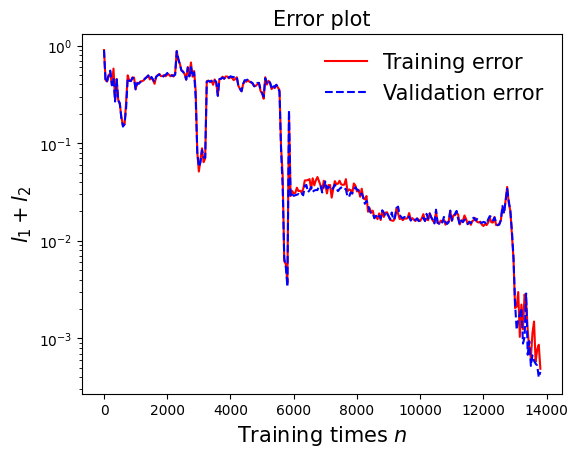

In [88]:
draw_loss(model5)

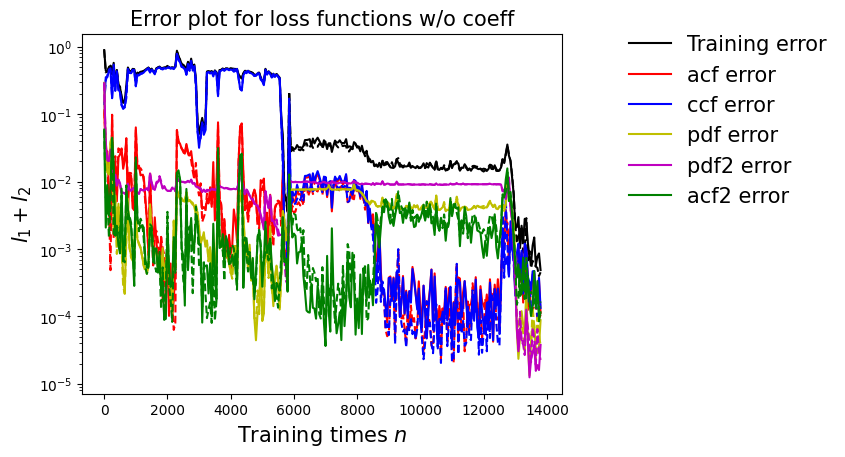

In [89]:
draw_errors(model5)

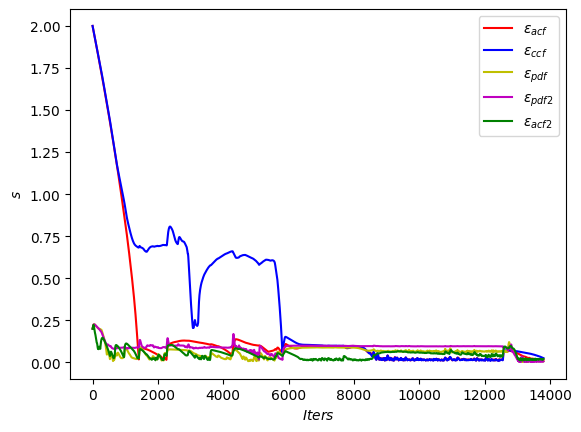

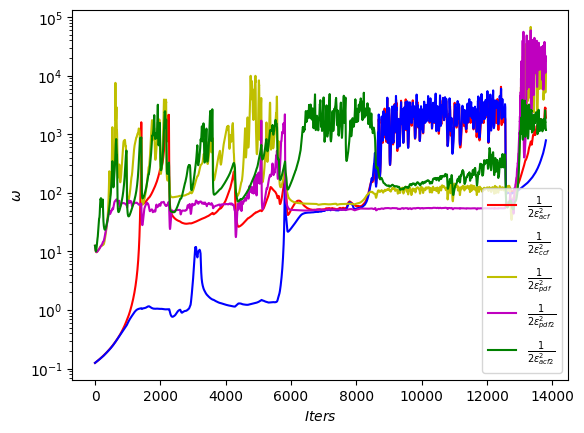

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

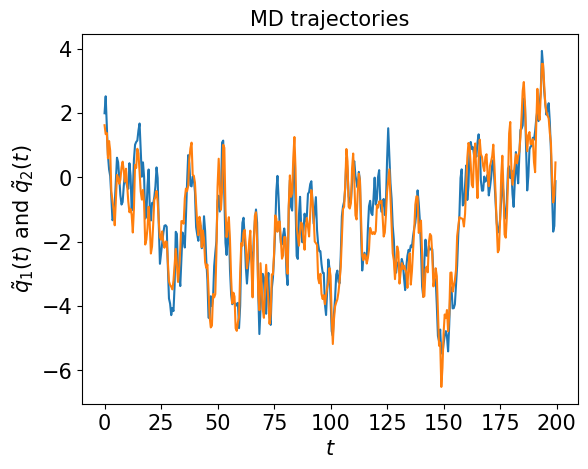

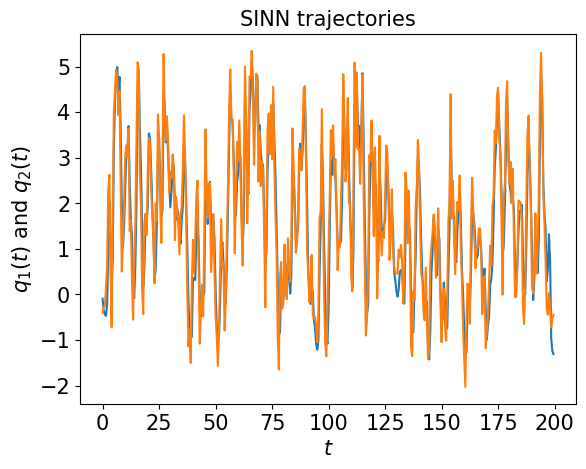

In [91]:
test1(model5)

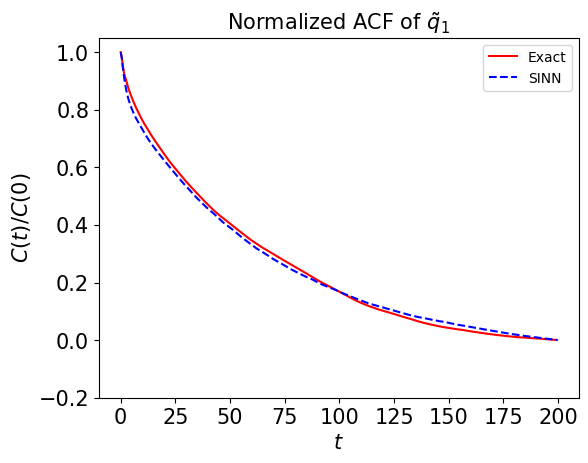

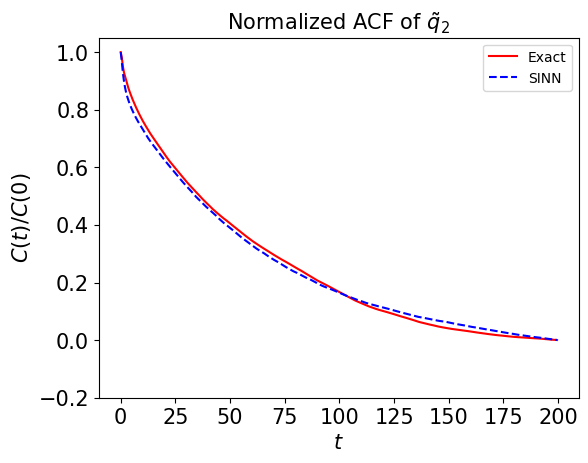

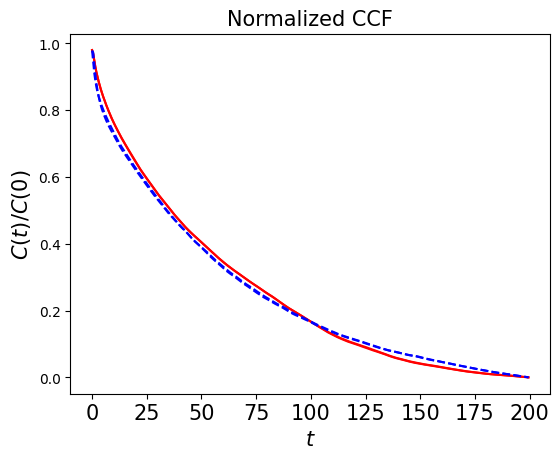

In [92]:
test2(model5)

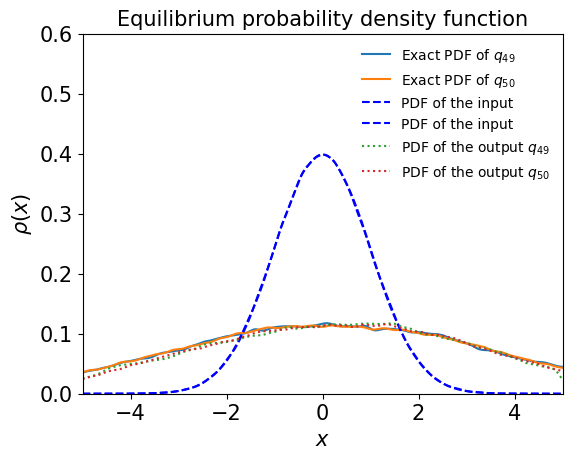

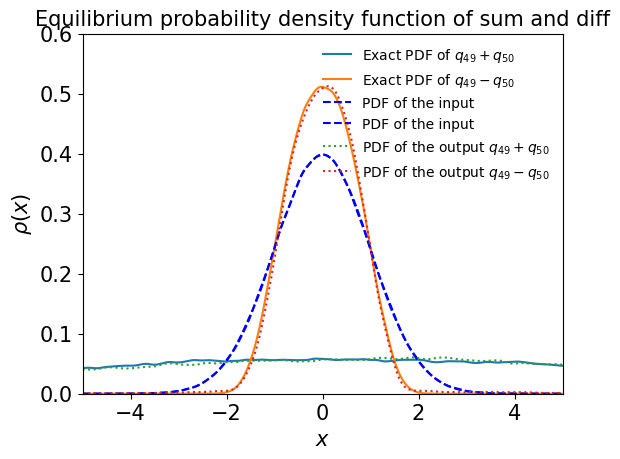

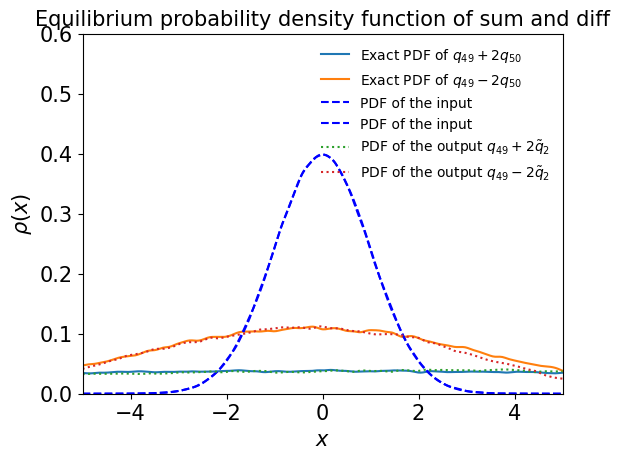

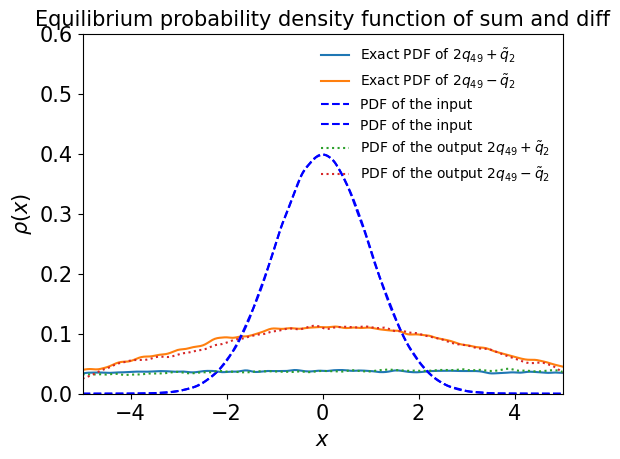

In [93]:
test3(model5)

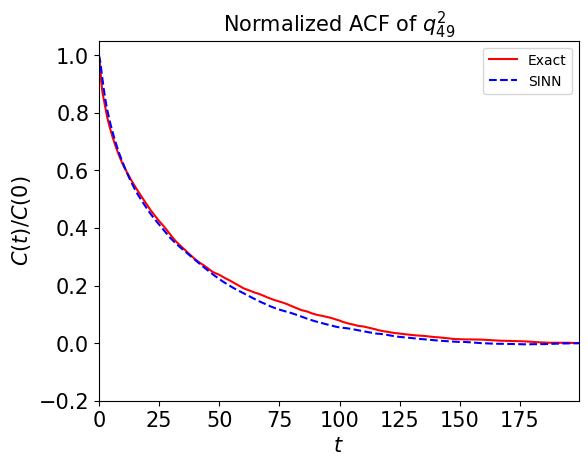

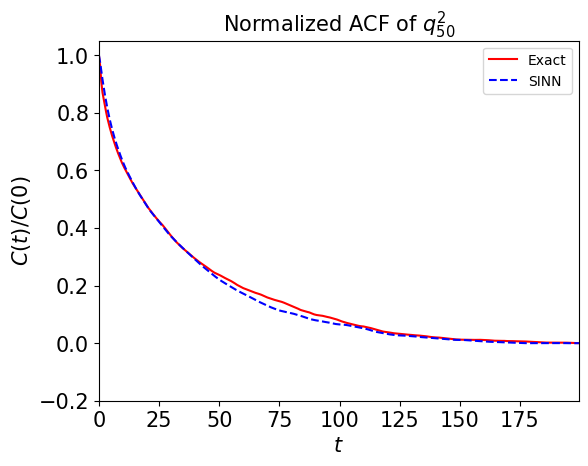

In [94]:
test4(model5)

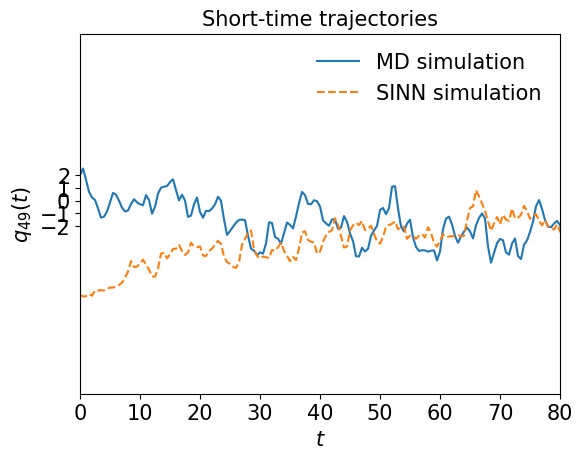

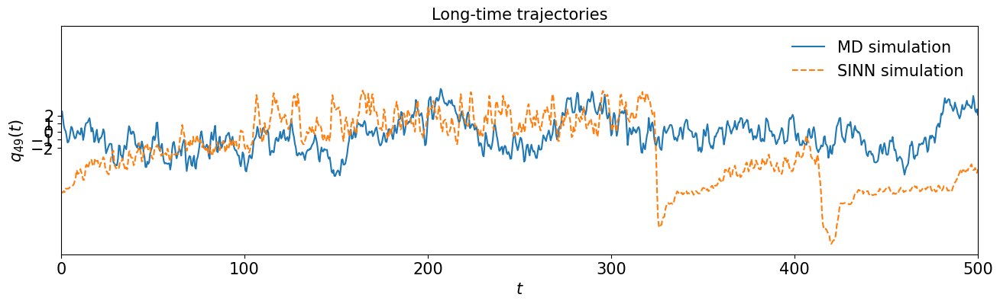

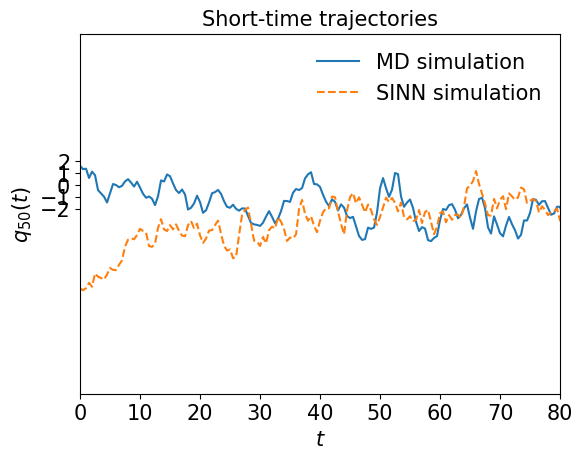

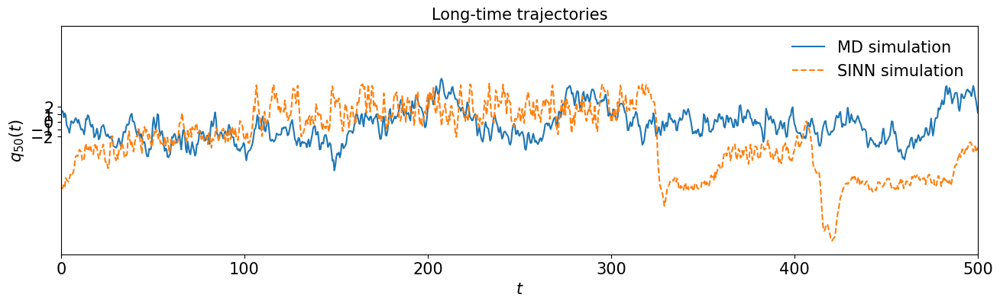

In [95]:
test5(model5)

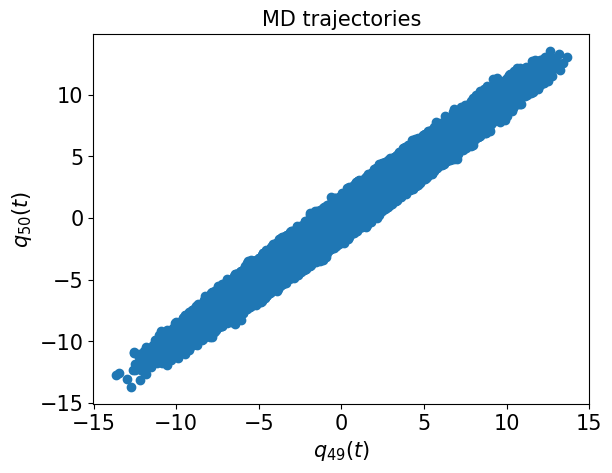

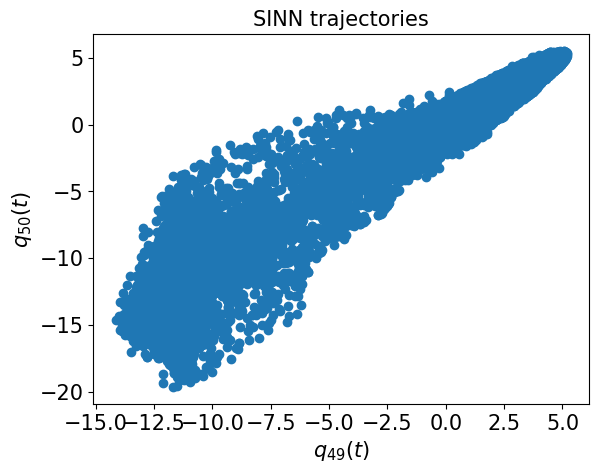

In [96]:
test6(model5)

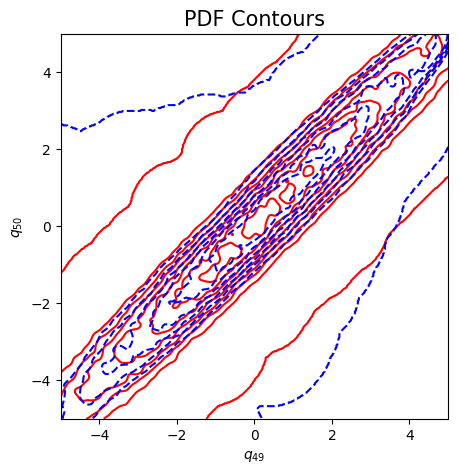

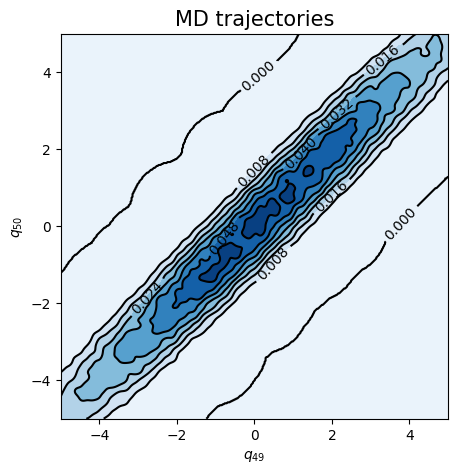

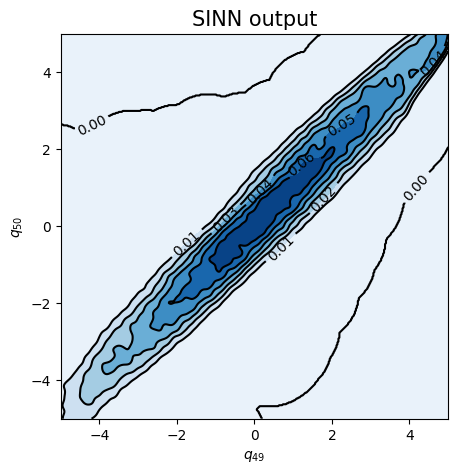

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.9031, 0.9015, acf: 0.11441, ccf: 0.14752, pdf: 0.29333, pdf2: 0.28746, acf2: 0.05876
[50]-th step loss: 0.3980, 0.4026, acf: 0.03297, ccf: 0.32051, pdf: 0.01800, pdf2: 0.02954, acf2: 0.00155
[100]-th step loss: 0.3909, 0.3949, acf: 0.02443, ccf: 0.34333, pdf: 0.00787, pdf2: 0.01807, acf2: 0.00119
[150]-th step loss: 0.4023, 0.4071, acf: 0.02501, ccf: 0.34497, pdf: 0.01353, pdf2: 0.02119, acf2: 0.00238
[200]-th step loss: 0.3955, 0.3998, acf: 0.02347, ccf: 0.34800, pdf: 0.00905, pdf2: 0.01699, acf2: 0.00230
[250]-th step loss: 0.4603, 0.4562, acf: 0.00421, ccf: 0.43538, pdf: 0.00390, pdf2: 0.01248, acf2: 0.00019
[300]-th step loss: 0.4433, 0.4357, acf: 0.06250, ccf: 0.25862, pdf: 0.00765, pdf2: 0.08399, acf2: 0.02292
[350]-th step loss: 0.4452, 0.3784, acf: 0.04612, ccf: 0.25210, pdf: 0.00774, pdf2: 0.05949, acf2: 0.01291
[400]-th step loss: 0.4505, 0.4458, acf: 0.01420, ccf: 0.36404, pdf: 0.00774, pdf2: 0.05950, acf2: 0.00028
[450]-th step loss: 0.4326, 0.4398, acf:

[3850]-th step loss: 0.4665, 0.4678, acf: 0.01069, ccf: 0.38969, pdf: 0.00774, pdf2: 0.05947, acf2: 0.00017
[3900]-th step loss: 0.4795, 0.4767, acf: 0.00837, ccf: 0.40067, pdf: 0.00774, pdf2: 0.05947, acf2: 0.00044
[3950]-th step loss: 0.4545, 0.4575, acf: 0.01218, ccf: 0.37805, pdf: 0.00774, pdf2: 0.05947, acf2: 0.00007
[4000]-th step loss: 0.4406, 0.4492, acf: 0.01406, ccf: 0.36773, pdf: 0.00774, pdf2: 0.05947, acf2: 0.00017
[4050]-th step loss: 0.4597, 0.4666, acf: 0.00989, ccf: 0.38936, pdf: 0.00774, pdf2: 0.05946, acf2: 0.00016
[4100]-th step loss: 0.4622, 0.4580, acf: 0.01134, ccf: 0.37940, pdf: 0.00774, pdf2: 0.05946, acf2: 0.00009
[4150]-th step loss: 0.4491, 0.4571, acf: 0.01212, ccf: 0.37771, pdf: 0.00774, pdf2: 0.05946, acf2: 0.00006
[4200]-th step loss: 0.4764, 0.4600, acf: 0.01129, ccf: 0.38138, pdf: 0.00774, pdf2: 0.05946, acf2: 0.00009
[4250]-th step loss: 0.4572, 0.4556, acf: 0.01197, ccf: 0.37637, pdf: 0.00774, pdf2: 0.05946, acf2: 0.00007
[4300]-th step loss: 0.4456,

[7650]-th step loss: 0.4537, 0.4622, acf: 0.01042, ccf: 0.38449, pdf: 0.00774, pdf2: 0.05945, acf2: 0.00007
[7700]-th step loss: 0.4576, 0.4524, acf: 0.01243, ccf: 0.37270, pdf: 0.00774, pdf2: 0.05945, acf2: 0.00008
[7750]-th step loss: 0.4815, 0.4870, acf: 0.01123, ccf: 0.40734, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00124
[7800]-th step loss: 0.4652, 0.4634, acf: 0.00979, ccf: 0.38630, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00013
[7850]-th step loss: 0.4858, 0.4747, acf: 0.00812, ccf: 0.39907, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00033
[7900]-th step loss: 0.4760, 0.4733, acf: 0.00819, ccf: 0.39763, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00031
[7950]-th step loss: 0.4647, 0.4686, acf: 0.00899, ccf: 0.39230, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00019
[8000]-th step loss: 0.4698, 0.4767, acf: 0.00768, ccf: 0.40141, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00042
[8050]-th step loss: 0.4768, 0.4675, acf: 0.00922, ccf: 0.39091, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00016
[8100]-th step loss: 0.4884,

[11450]-th step loss: 0.4598, 0.4649, acf: 0.00983, ccf: 0.38774, pdf: 0.00773, pdf2: 0.05944, acf2: 0.00014
[11500]-th step loss: 0.4585, 0.4567, acf: 0.01124, ccf: 0.37819, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00007
[11550]-th step loss: 0.4710, 0.4718, acf: 0.00848, ccf: 0.39580, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00035
[11600]-th step loss: 0.4551, 0.4600, acf: 0.01088, ccf: 0.38185, pdf: 0.00773, pdf2: 0.05944, acf2: 0.00007
[11650]-th step loss: 0.4557, 0.4622, acf: 0.01023, ccf: 0.38472, pdf: 0.00773, pdf2: 0.05944, acf2: 0.00010
[11700]-th step loss: 0.4665, 0.4687, acf: 0.00896, ccf: 0.39228, pdf: 0.00773, pdf2: 0.05944, acf2: 0.00024
[11750]-th step loss: 0.4407, 0.4488, acf: 0.01288, ccf: 0.36864, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00014
[11800]-th step loss: 0.4557, 0.4685, acf: 0.00901, ccf: 0.39206, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00023
[11850]-th step loss: 0.4669, 0.4617, acf: 0.01029, ccf: 0.38415, pdf: 0.00773, pdf2: 0.05945, acf2: 0.00013
[11900]-th step los

[15250]-th step loss: 0.4662, 0.4633, acf: 0.01027, ccf: 0.38567, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00017
[15300]-th step loss: 0.4523, 0.4581, acf: 0.01115, ccf: 0.37967, pdf: 0.00773, pdf2: 0.05944, acf2: 0.00008
[15350]-th step loss: 0.4560, 0.4585, acf: 0.01103, ccf: 0.38024, pdf: 0.00774, pdf2: 0.05943, acf2: 0.00008
[15400]-th step loss: 0.4631, 0.4617, acf: 0.01064, ccf: 0.38386, pdf: 0.00773, pdf2: 0.05943, acf2: 0.00008
[15450]-th step loss: 0.4608, 0.4615, acf: 0.01042, ccf: 0.38384, pdf: 0.00773, pdf2: 0.05944, acf2: 0.00012
[15500]-th step loss: 0.4688, 0.4778, acf: 0.00767, ccf: 0.40249, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00048
[15550]-th step loss: 0.4454, 0.4576, acf: 0.01132, ccf: 0.37904, pdf: 0.00773, pdf2: 0.05944, acf2: 0.00007
[15600]-th step loss: 0.4544, 0.4677, acf: 0.00955, ccf: 0.39078, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00015
[15650]-th step loss: 0.4544, 0.4608, acf: 0.01041, ccf: 0.38313, pdf: 0.00774, pdf2: 0.05944, acf2: 0.00009
[15700]-th step los

[19050]-th step loss: 0.4515, 0.4540, acf: 0.01213, ccf: 0.37468, pdf: 0.00773, pdf2: 0.05940, acf2: 0.00008
[19100]-th step loss: 0.4609, 0.4568, acf: 0.01155, ccf: 0.37810, pdf: 0.00773, pdf2: 0.05940, acf2: 0.00006
[19150]-th step loss: 0.4729, 0.4570, acf: 0.01143, ccf: 0.37832, pdf: 0.00773, pdf2: 0.05940, acf2: 0.00007
[19200]-th step loss: 0.4602, 0.4671, acf: 0.00946, ccf: 0.39028, pdf: 0.00773, pdf2: 0.05940, acf2: 0.00018
[19250]-th step loss: 0.4652, 0.4611, acf: 0.01036, ccf: 0.38351, pdf: 0.00773, pdf2: 0.05940, acf2: 0.00010
[19300]-th step loss: 0.4827, 0.4704, acf: 0.00898, ccf: 0.39405, pdf: 0.00773, pdf2: 0.05939, acf2: 0.00022
[19350]-th step loss: 0.5902, 0.5846, acf: 0.01136, ccf: 0.39827, pdf: 0.09547, pdf2: 0.07876, acf2: 0.00078
[19400]-th step loss: 0.3975, 0.3935, acf: 0.00472, ccf: 0.34044, pdf: 0.02631, pdf2: 0.01996, acf2: 0.00211
[19450]-th step loss: 0.3748, 0.3828, acf: 0.00075, ccf: 0.34153, pdf: 0.02470, pdf2: 0.01221, acf2: 0.00364
[19500]-th step los

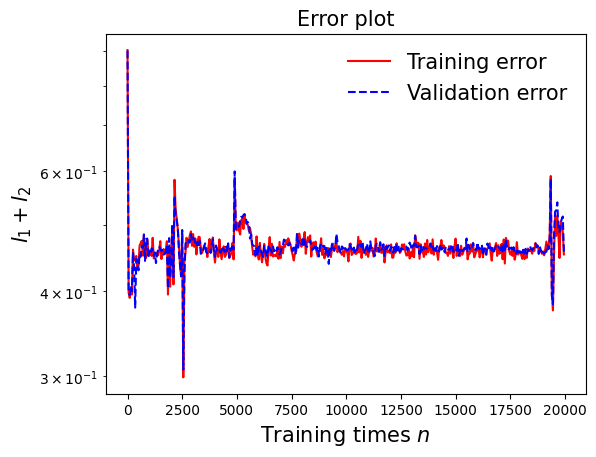

In [99]:
draw_loss(model6)

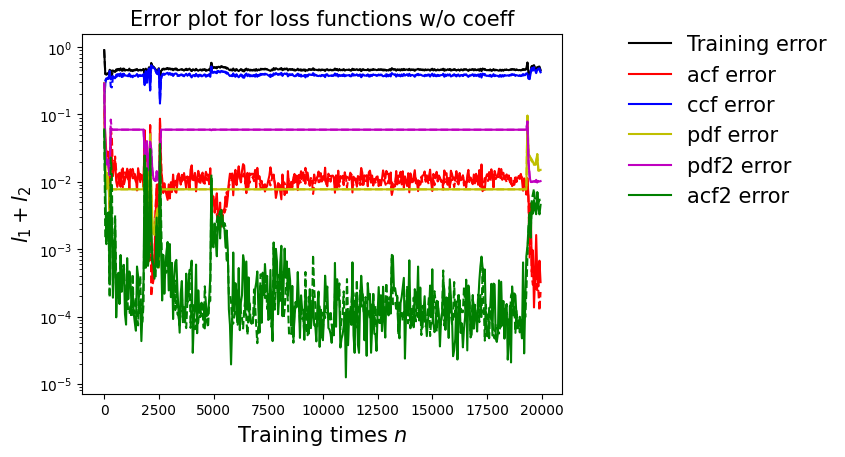

In [100]:
draw_errors(model6)

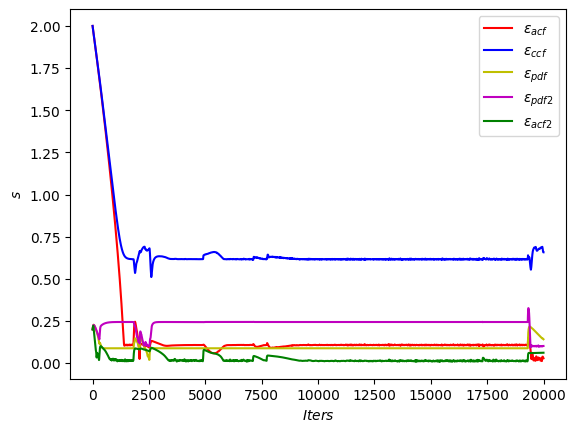

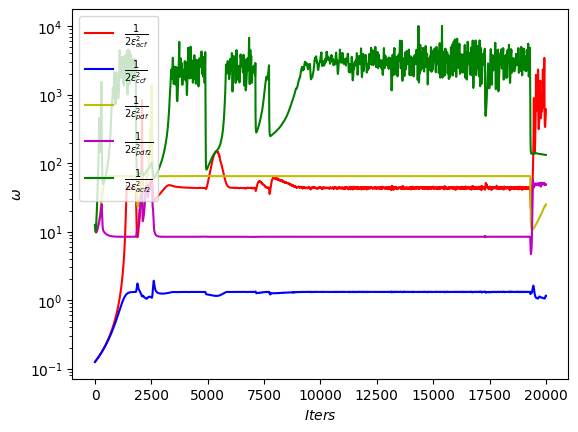

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

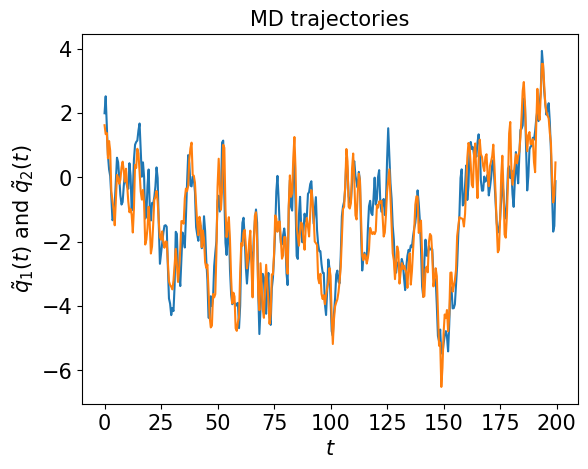

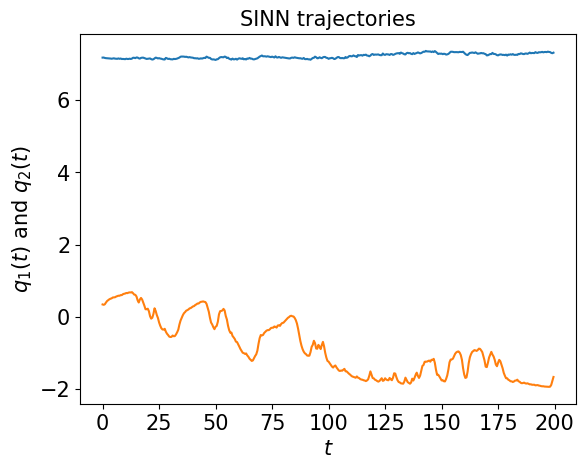

In [102]:
test1(model6)

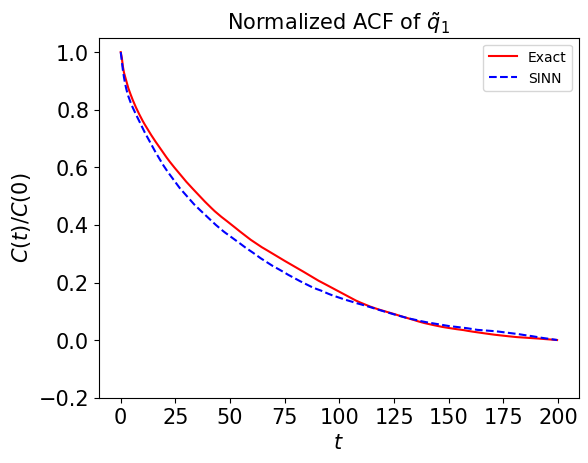

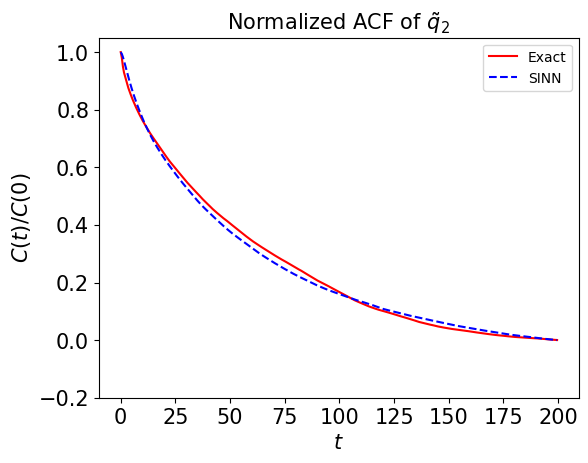

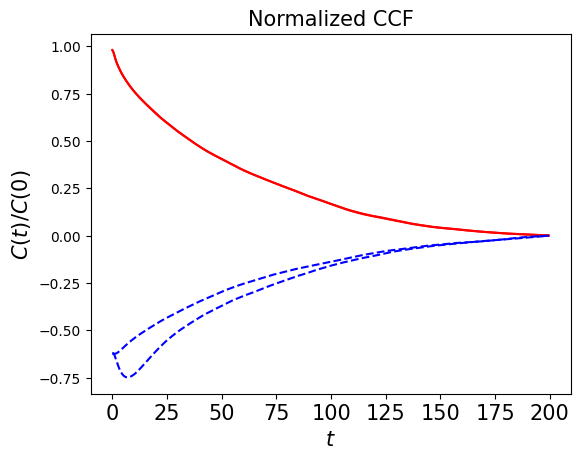

In [103]:
test2(model6)

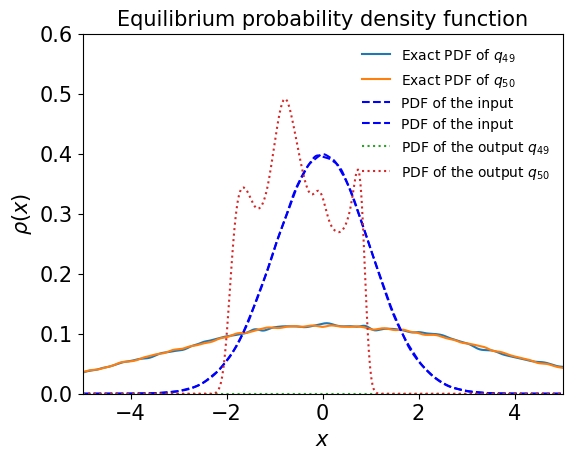

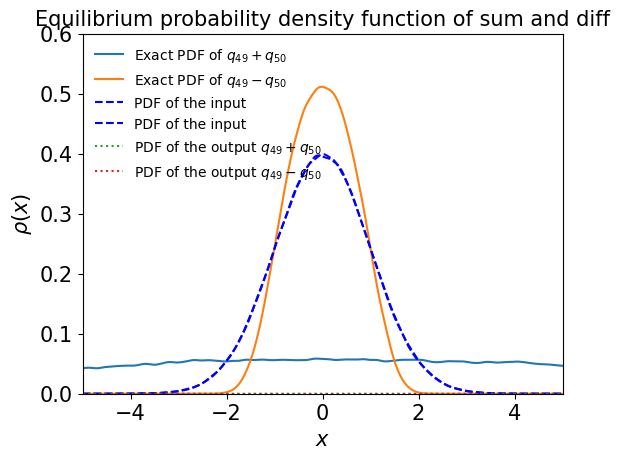

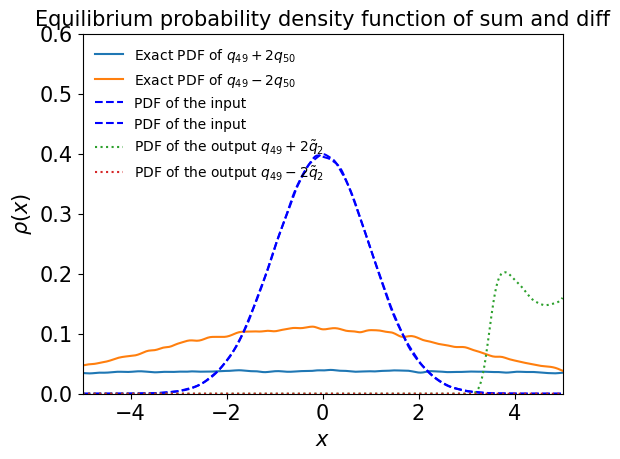

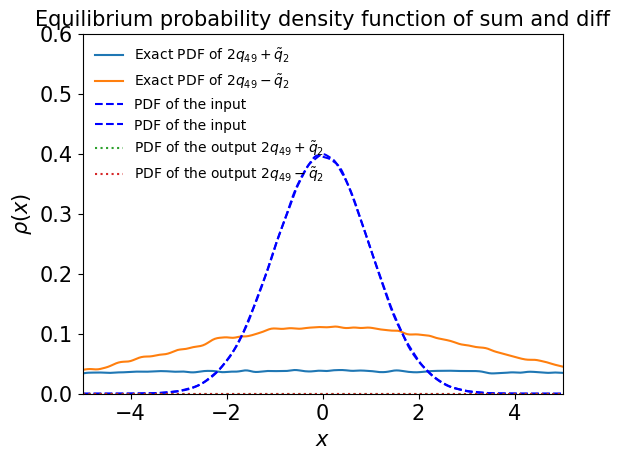

In [104]:
test3(model6)

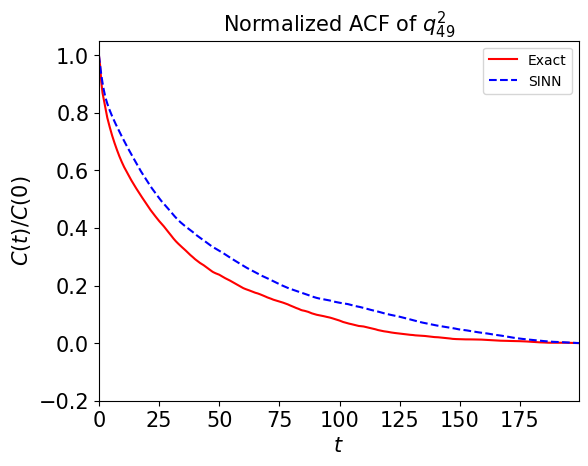

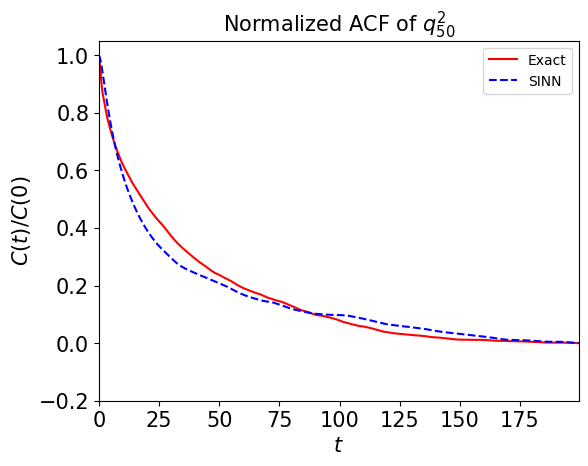

In [105]:
test4(model6)

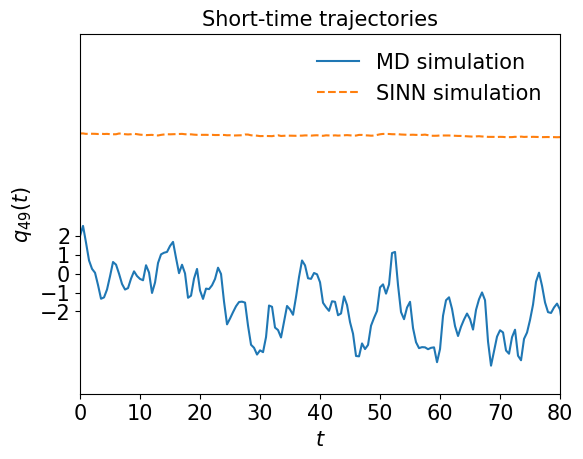

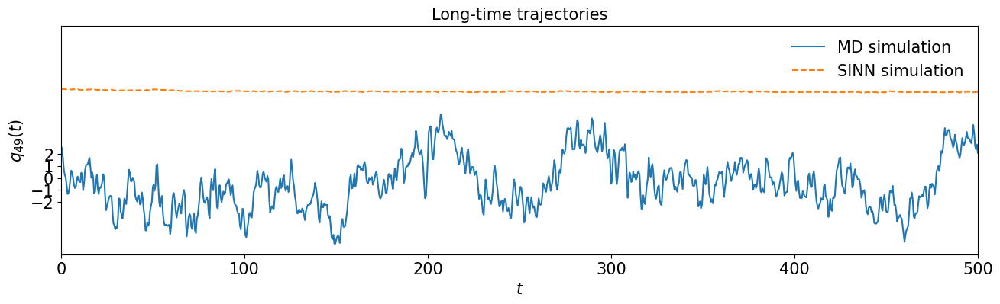

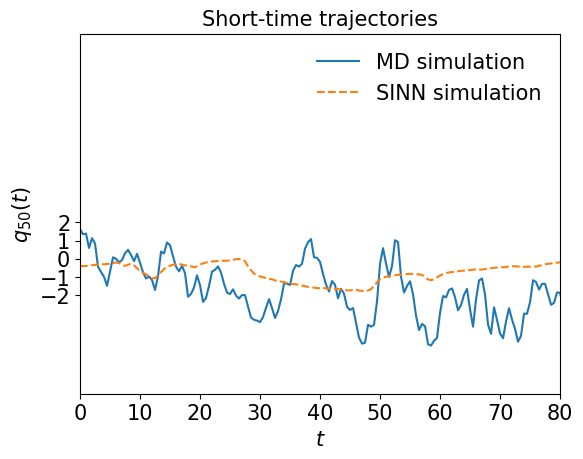

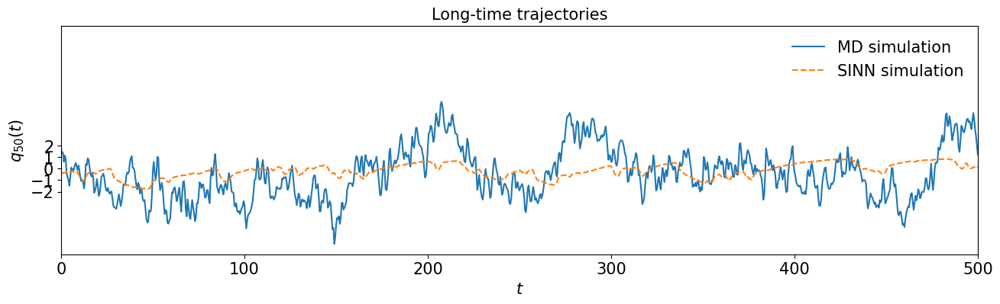

In [106]:
test5(model6)

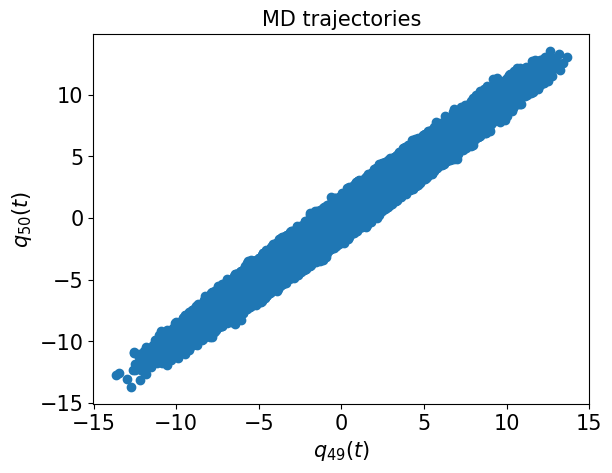

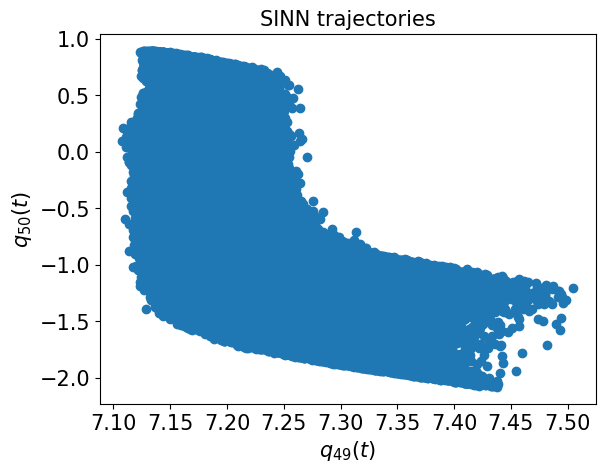

In [107]:
test6(model6)

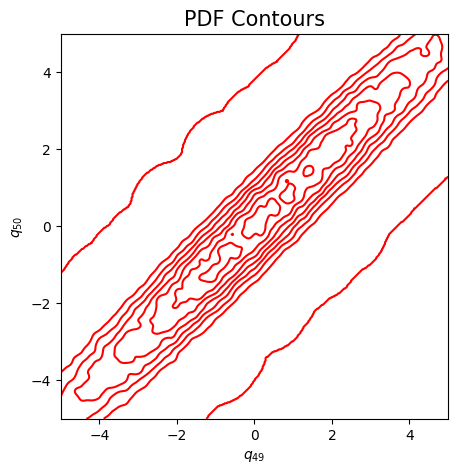

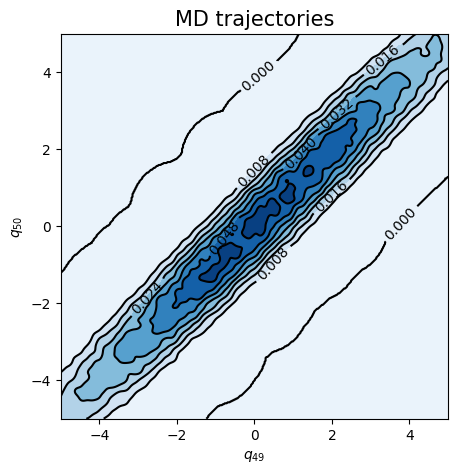

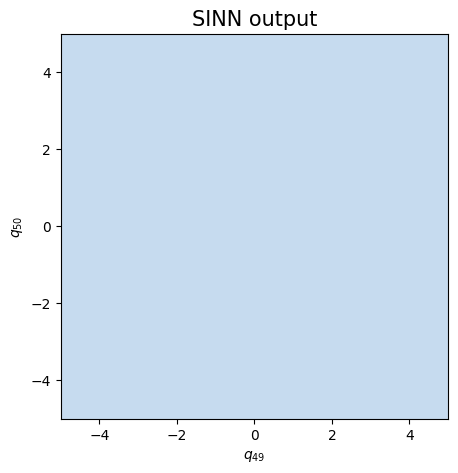

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8782, 0.8727, acf: 0.11543, ccf: 0.11613, pdf: 0.29363, pdf2: 0.28793, acf2: 0.05963
[50]-th step loss: 0.1046, 0.0972, acf: 0.02012, ccf: 0.02029, pdf: 0.02965, pdf2: 0.02296, acf2: 0.00420
[100]-th step loss: 0.0541, 0.0468, acf: 0.01353, ccf: 0.01383, pdf: 0.00994, pdf2: 0.00795, acf2: 0.00157
[150]-th step loss: 0.0445, 0.0443, acf: 0.00291, ccf: 0.00280, pdf: 0.02204, pdf2: 0.01573, acf2: 0.00083
[200]-th step loss: 0.0372, 0.0569, acf: 0.00870, ccf: 0.00850, pdf: 0.00870, pdf2: 0.02579, acf2: 0.00521
[250]-th step loss: 0.0924, 0.0587, acf: 0.00914, ccf: 0.00906, pdf: 0.00653, pdf2: 0.01063, acf2: 0.02333
[300]-th step loss: 0.0438, 0.0513, acf: 0.01899, ccf: 0.01931, pdf: 0.00778, pdf2: 0.00469, acf2: 0.00049
[350]-th step loss: 0.1066, 0.1128, acf: 0.04505, ccf: 0.04503, pdf: 0.00532, pdf2: 0.00579, acf2: 0.01161
[400]-th step loss: 0.0740, 0.0725, acf: 0.03180, ccf: 0.03188, pdf: 0.00142, pdf2: 0.00194, acf2: 0.00550
[450]-th step loss: 0.1306, 0.1134, acf:

[3850]-th step loss: 0.0053, 0.0036, acf: 0.00086, ccf: 0.00087, pdf: 0.00064, pdf2: 0.00026, acf2: 0.00092
[3900]-th step loss: 0.0033, 0.0044, acf: 0.00142, ccf: 0.00142, pdf: 0.00042, pdf2: 0.00015, acf2: 0.00095
[3950]-th step loss: 0.0055, 0.0053, acf: 0.00140, ccf: 0.00140, pdf: 0.00114, pdf2: 0.00040, acf2: 0.00094
[4000]-th step loss: 0.0075, 0.0144, acf: 0.00212, ccf: 0.00211, pdf: 0.00436, pdf2: 0.00252, acf2: 0.00326
[4050]-th step loss: 0.0243, 0.0747, acf: 0.02706, ccf: 0.02699, pdf: 0.00704, pdf2: 0.00283, acf2: 0.01074
[4100]-th step loss: 0.0242, 0.0252, acf: 0.00381, ccf: 0.00142, pdf: 0.01057, pdf2: 0.00432, acf2: 0.00511
[4150]-th step loss: 0.0374, 0.0217, acf: 0.00656, ccf: 0.00534, pdf: 0.00431, pdf2: 0.00183, acf2: 0.00367
[4200]-th step loss: 0.0104, 0.0110, acf: 0.00157, ccf: 0.00075, pdf: 0.00275, pdf2: 0.00118, acf2: 0.00475
[4250]-th step loss: 0.2721, 0.2751, acf: 0.10622, ccf: 0.10613, pdf: 0.00753, pdf2: 0.00360, acf2: 0.05163
[4300]-th step loss: 0.2654,

[7650]-th step loss: 0.0271, 0.0229, acf: 0.00017, ccf: 0.00021, pdf: 0.00784, pdf2: 0.00386, acf2: 0.01085
[7700]-th step loss: 0.0196, 0.0211, acf: 0.00019, ccf: 0.00022, pdf: 0.00825, pdf2: 0.00344, acf2: 0.00904
[7750]-th step loss: 0.0223, 0.0248, acf: 0.00025, ccf: 0.00024, pdf: 0.00775, pdf2: 0.00400, acf2: 0.01259
[7800]-th step loss: 0.0250, 0.0275, acf: 0.00025, ccf: 0.00026, pdf: 0.00806, pdf2: 0.00420, acf2: 0.01475
[7850]-th step loss: 0.0241, 0.0241, acf: 0.00008, ccf: 0.00008, pdf: 0.00800, pdf2: 0.00380, acf2: 0.01210
[7900]-th step loss: 0.0213, 0.0210, acf: 0.00004, ccf: 0.00004, pdf: 0.00762, pdf2: 0.00341, acf2: 0.00994
[7950]-th step loss: 0.0213, 0.0226, acf: 0.00002, ccf: 0.00003, pdf: 0.00775, pdf2: 0.00397, acf2: 0.01080
[8000]-th step loss: 0.0231, 0.0232, acf: 0.00010, ccf: 0.00010, pdf: 0.00772, pdf2: 0.00370, acf2: 0.01159
[8050]-th step loss: 0.0213, 0.0216, acf: 0.00002, ccf: 0.00002, pdf: 0.00772, pdf2: 0.00342, acf2: 0.01038
[8100]-th step loss: 0.0216,

[11450]-th step loss: 0.0006, 0.0005, acf: 0.00005, ccf: 0.00006, pdf: 0.00008, pdf2: 0.00003, acf2: 0.00033
[11500]-th step loss: 0.0006, 0.0005, acf: 0.00005, ccf: 0.00006, pdf: 0.00010, pdf2: 0.00006, acf2: 0.00026
[11550]-th step loss: 0.0021, 0.0022, acf: 0.00012, ccf: 0.00013, pdf: 0.00064, pdf2: 0.00021, acf2: 0.00110
[11600]-th step loss: 0.0008, 0.0004, acf: 0.00004, ccf: 0.00004, pdf: 0.00005, pdf2: 0.00002, acf2: 0.00026
[11650]-th step loss: 0.0009, 0.0004, acf: 0.00005, ccf: 0.00005, pdf: 0.00005, pdf2: 0.00002, acf2: 0.00025
[11700]-th step loss: 0.0013, 0.0005, acf: 0.00008, ccf: 0.00008, pdf: 0.00019, pdf2: 0.00006, acf2: 0.00011
[11750]-th step loss: 0.0003, 0.0005, acf: 0.00006, ccf: 0.00006, pdf: 0.00004, pdf2: 0.00004, acf2: 0.00028
Training finished
Training time: 927.71
Training time per iteration: 0.08
Number of Iterations:11751


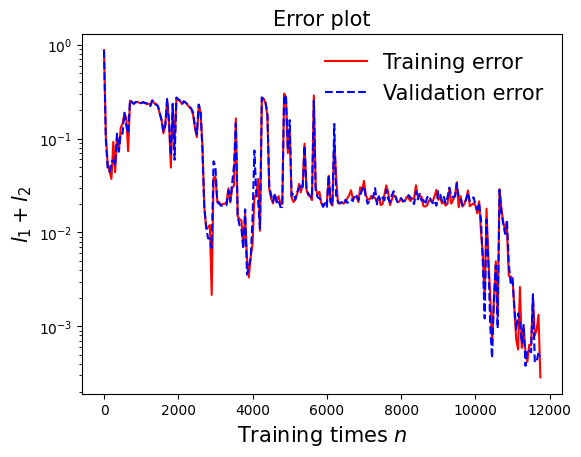

In [110]:
draw_loss(model7)

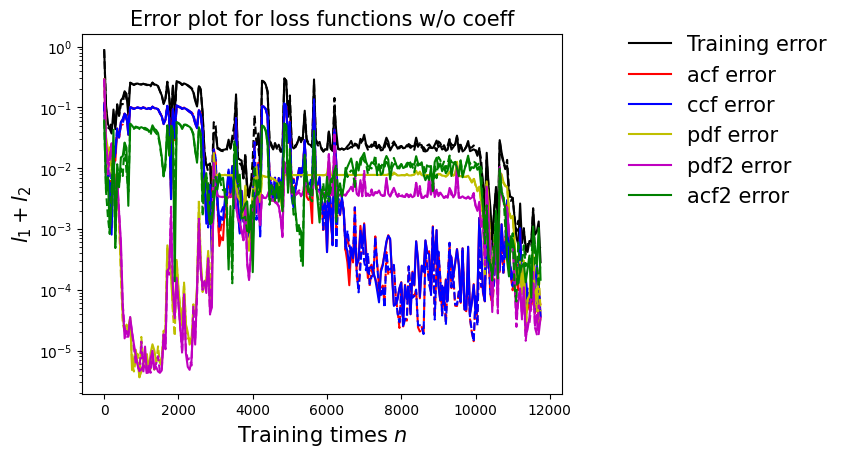

In [111]:
draw_errors(model7)

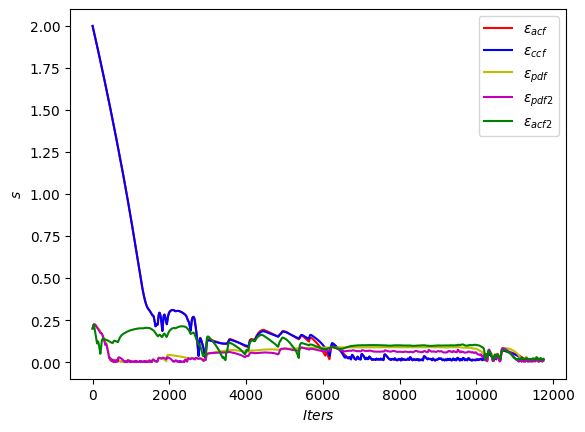

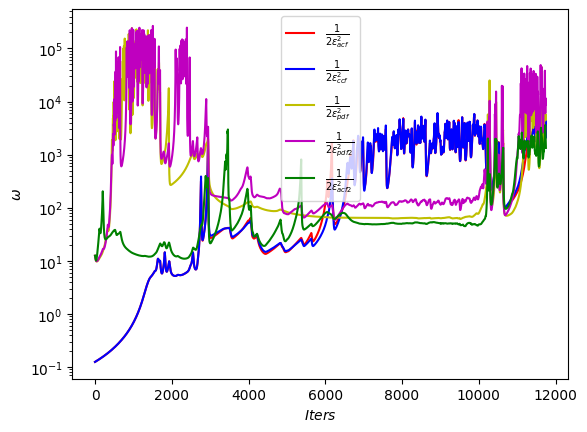

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

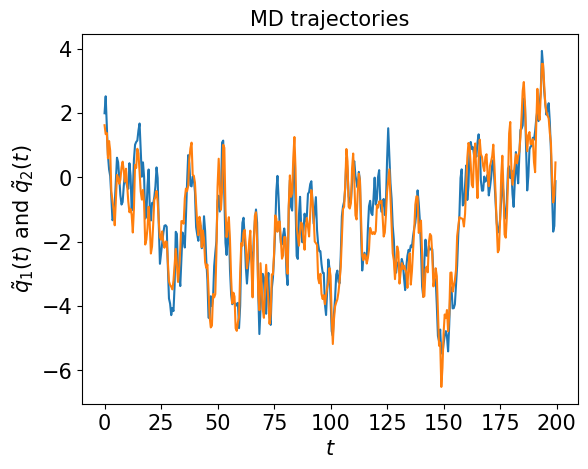

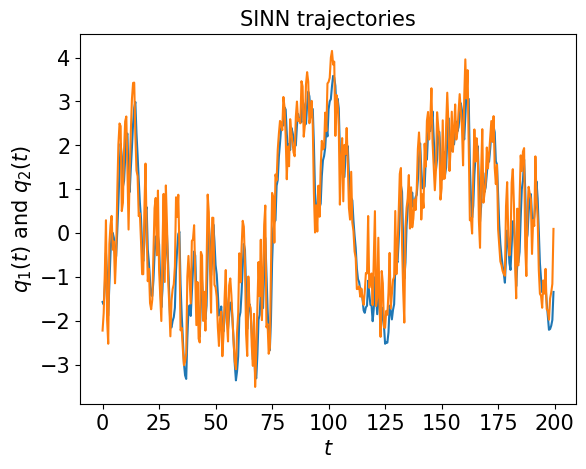

In [113]:
test1(model7)

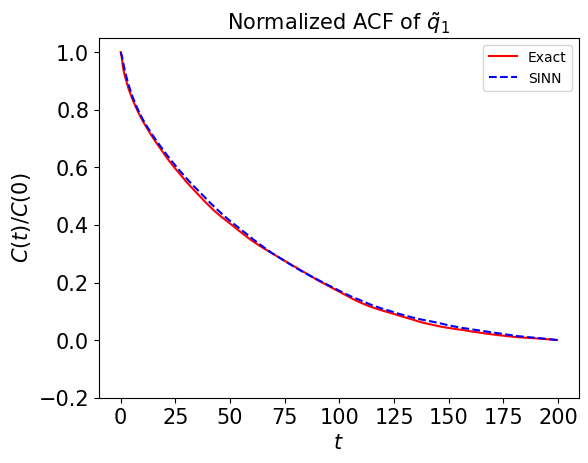

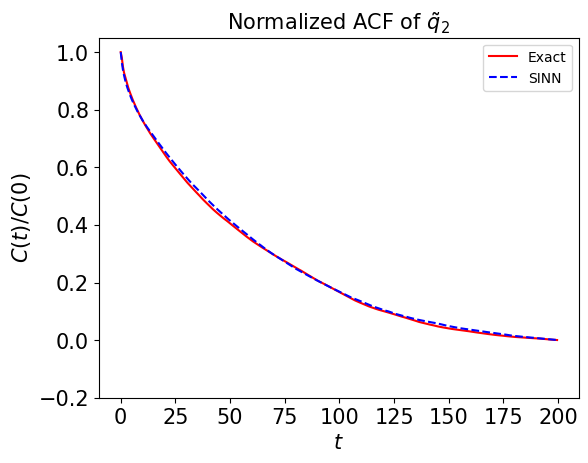

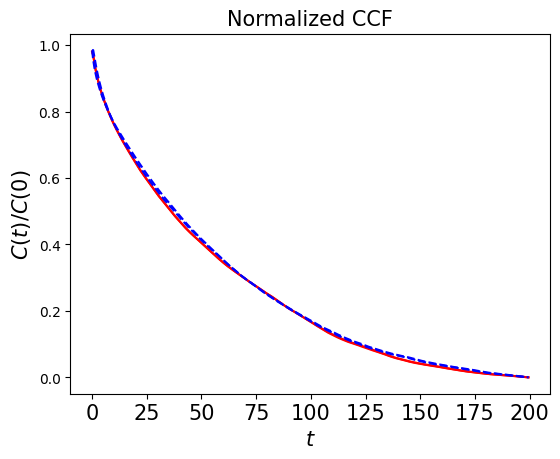

In [114]:
test2(model7)

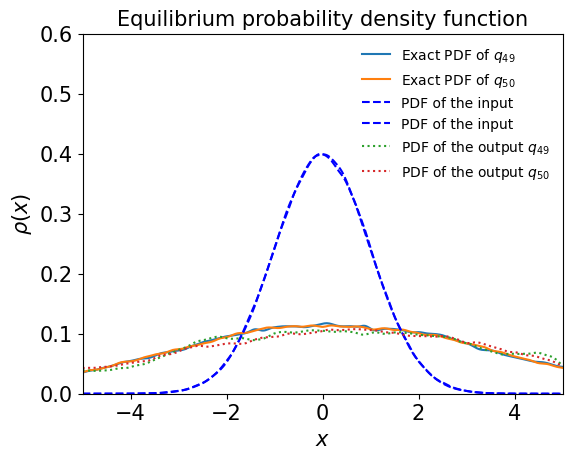

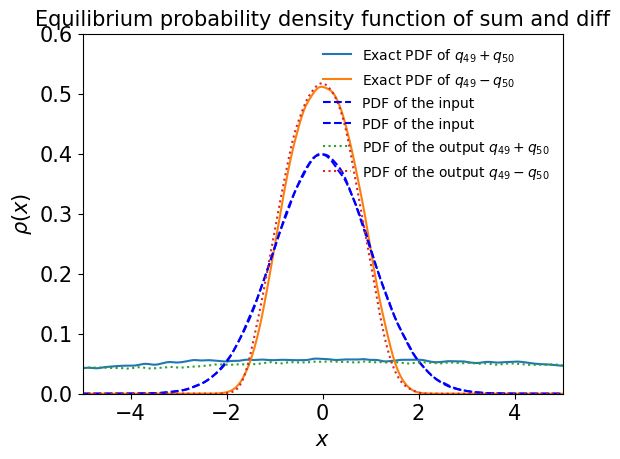

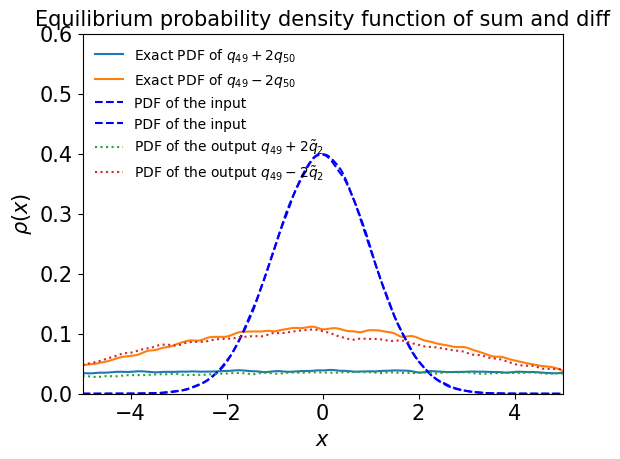

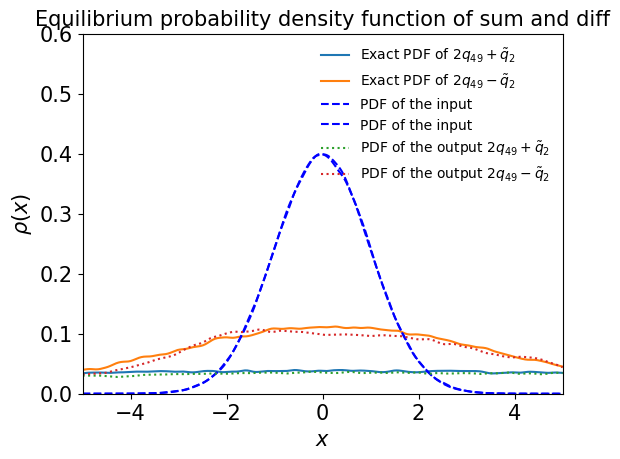

In [115]:
test3(model7)

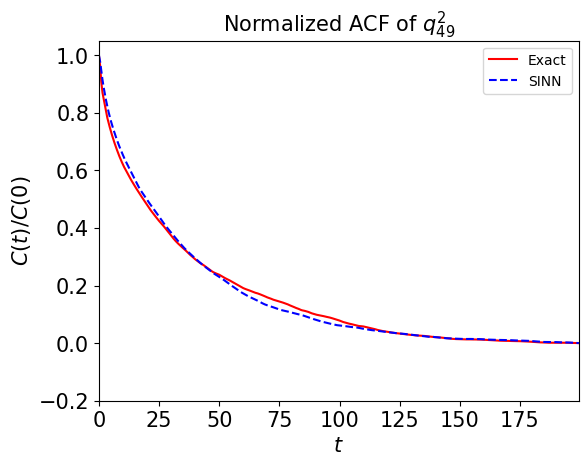

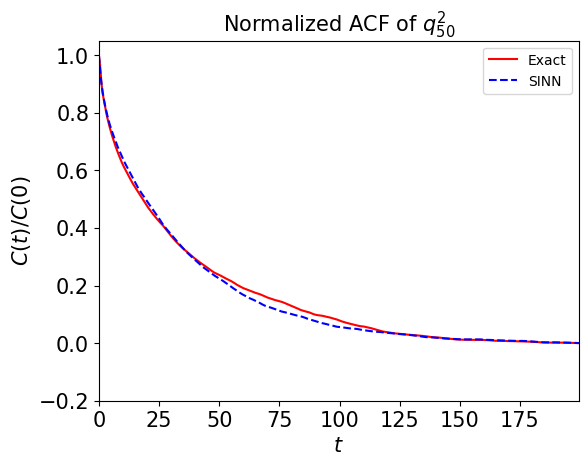

In [116]:
test4(model7)

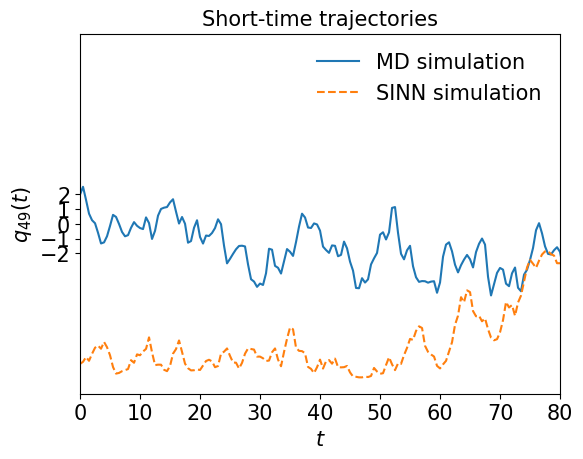

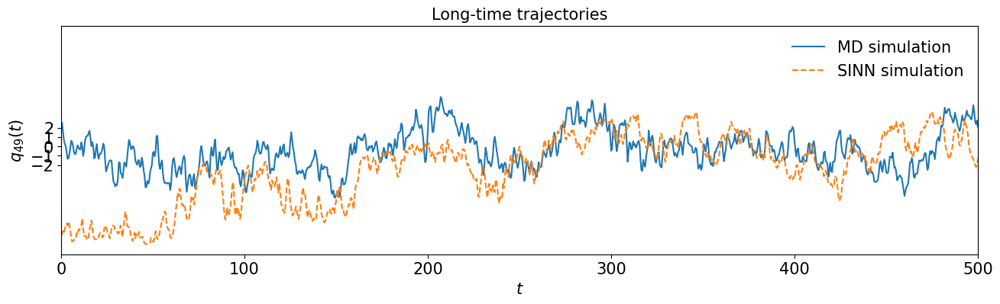

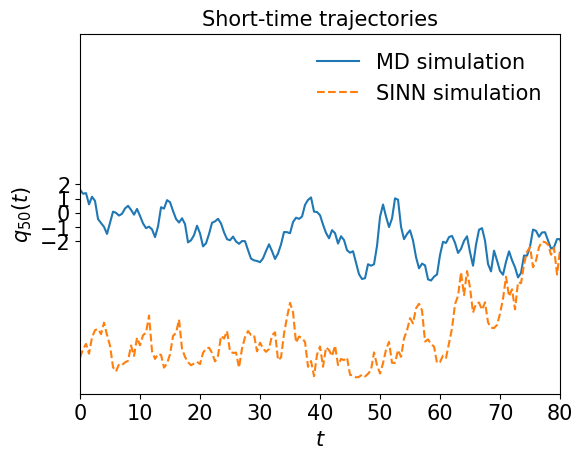

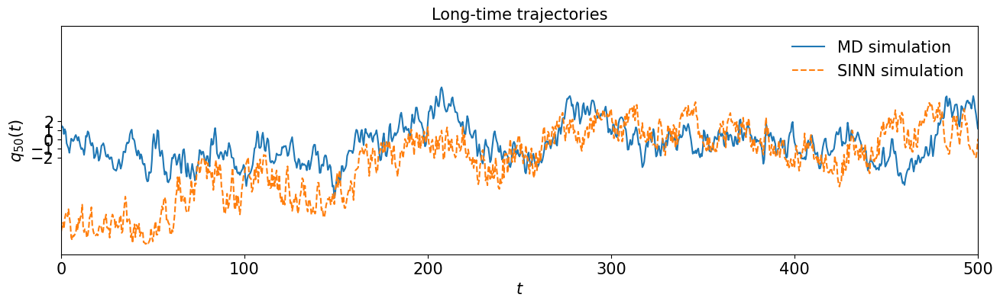

In [117]:
test5(model7)

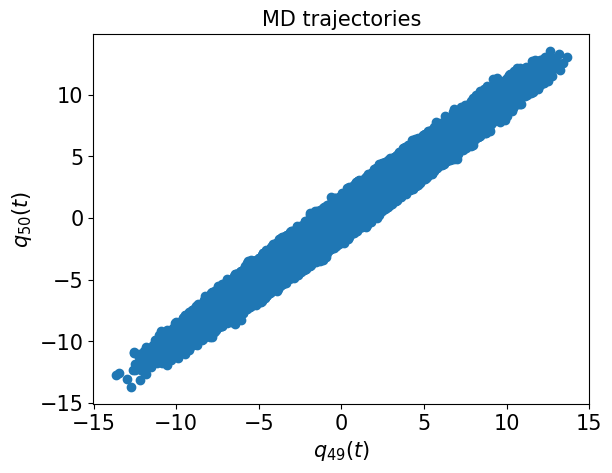

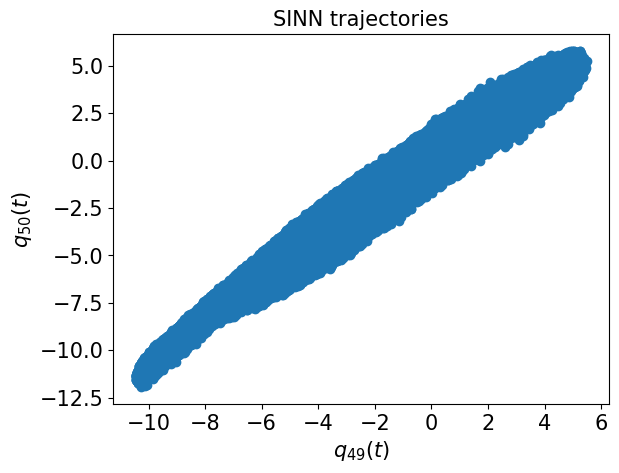

In [118]:
test6(model7)

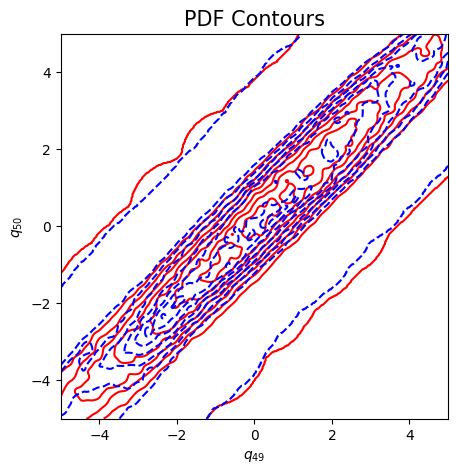

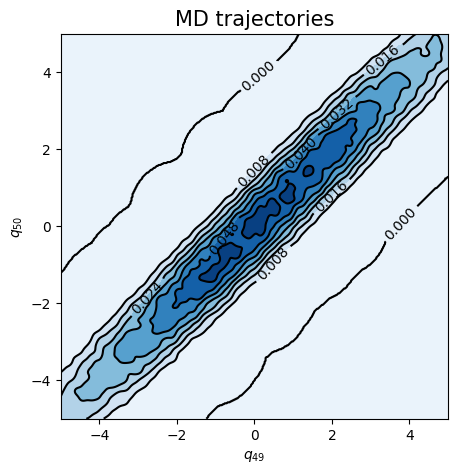

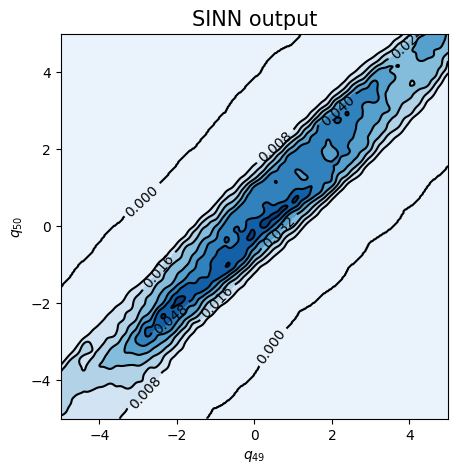

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.9005, 0.8939, acf: 0.11412, ccf: 0.13891, pdf: 0.29353, pdf2: 0.28885, acf2: 0.05846
[50]-th step loss: 0.0987, 0.1041, acf: 0.02740, ccf: 0.02951, pdf: 0.02677, pdf2: 0.01688, acf2: 0.00355
[100]-th step loss: 0.0437, 0.0392, acf: 0.00990, ccf: 0.01150, pdf: 0.01069, pdf2: 0.00652, acf2: 0.00063
[150]-th step loss: 0.0426, 0.0419, acf: 0.00991, ccf: 0.01293, pdf: 0.00813, pdf2: 0.01045, acf2: 0.00051
[200]-th step loss: 0.0511, 0.0451, acf: 0.01204, ccf: 0.01494, pdf: 0.00745, pdf2: 0.01032, acf2: 0.00037
[250]-th step loss: 0.0927, 0.0798, acf: 0.00892, ccf: 0.01377, pdf: 0.03505, pdf2: 0.02185, acf2: 0.00024
[300]-th step loss: 0.1192, 0.0864, acf: 0.01067, ccf: 0.05466, pdf: 0.01162, pdf2: 0.00866, acf2: 0.00084
[350]-th step loss: 0.2324, 0.1796, acf: 0.00678, ccf: 0.15594, pdf: 0.01081, pdf2: 0.00576, acf2: 0.00034
[400]-th step loss: 0.3314, 0.2636, acf: 0.00765, ccf: 0.24055, pdf: 0.00732, pdf2: 0.00798, acf2: 0.00012
[450]-th step loss: 0.3019, 0.1826, acf:

[3850]-th step loss: 0.0327, 0.0326, acf: 0.00035, ccf: 0.00035, pdf: 0.01309, pdf2: 0.01018, acf2: 0.00863
[3900]-th step loss: 0.0259, 0.0287, acf: 0.00014, ccf: 0.00015, pdf: 0.00896, pdf2: 0.00941, acf2: 0.01006
[3950]-th step loss: 0.0261, 0.0274, acf: 0.00257, ccf: 0.00254, pdf: 0.00908, pdf2: 0.01088, acf2: 0.00234
[4000]-th step loss: 0.0893, 0.0412, acf: 0.00147, ccf: 0.00147, pdf: 0.02122, pdf2: 0.00962, acf2: 0.00745
[4050]-th step loss: 0.0410, 0.0425, acf: 0.00229, ccf: 0.00230, pdf: 0.01923, pdf2: 0.00942, acf2: 0.00932
[4100]-th step loss: 0.0280, 0.0271, acf: 0.00127, ccf: 0.00108, pdf: 0.00633, pdf2: 0.00947, acf2: 0.00893
[4150]-th step loss: 0.0237, 0.0248, acf: 0.00058, ccf: 0.00044, pdf: 0.00562, pdf2: 0.00951, acf2: 0.00866
[4200]-th step loss: 0.1282, 0.1310, acf: 0.00652, ccf: 0.00640, pdf: 0.08886, pdf2: 0.02493, acf2: 0.00426
[4250]-th step loss: 0.0555, 0.0582, acf: 0.00363, ccf: 0.00355, pdf: 0.03403, pdf2: 0.00987, acf2: 0.00717
[4300]-th step loss: 0.0353,

[7650]-th step loss: 0.0203, 0.0204, acf: 0.00023, ccf: 0.00024, pdf: 0.00409, pdf2: 0.00906, acf2: 0.00682
[7700]-th step loss: 0.0207, 0.0213, acf: 0.00025, ccf: 0.00026, pdf: 0.00446, pdf2: 0.00925, acf2: 0.00706
[7750]-th step loss: 0.0282, 0.0266, acf: 0.00011, ccf: 0.00010, pdf: 0.00529, pdf2: 0.00977, acf2: 0.01130
[7800]-th step loss: 0.0244, 0.0231, acf: 0.00026, ccf: 0.00021, pdf: 0.00540, pdf2: 0.00978, acf2: 0.00748
[7850]-th step loss: 0.0180, 0.0197, acf: 0.00012, ccf: 0.00012, pdf: 0.00409, pdf2: 0.00896, acf2: 0.00642
[7900]-th step loss: 0.0180, 0.0183, acf: 0.00005, ccf: 0.00002, pdf: 0.00409, pdf2: 0.00909, acf2: 0.00501
[7950]-th step loss: 0.0181, 0.0181, acf: 0.00007, ccf: 0.00006, pdf: 0.00397, pdf2: 0.00899, acf2: 0.00505
[8000]-th step loss: 0.0189, 0.0202, acf: 0.00019, ccf: 0.00019, pdf: 0.00419, pdf2: 0.00913, acf2: 0.00653
[8050]-th step loss: 0.0171, 0.0193, acf: 0.00014, ccf: 0.00014, pdf: 0.00408, pdf2: 0.00901, acf2: 0.00588
[8100]-th step loss: 0.0168,

[11450]-th step loss: 0.0181, 0.0187, acf: 0.00014, ccf: 0.00014, pdf: 0.00402, pdf2: 0.00884, acf2: 0.00552
[11500]-th step loss: 0.0184, 0.0175, acf: 0.00006, ccf: 0.00006, pdf: 0.00398, pdf2: 0.00881, acf2: 0.00453
[11550]-th step loss: 0.0205, 0.0223, acf: 0.00008, ccf: 0.00008, pdf: 0.00404, pdf2: 0.00878, acf2: 0.00937
[11600]-th step loss: 0.0197, 0.0189, acf: 0.00005, ccf: 0.00006, pdf: 0.00421, pdf2: 0.00900, acf2: 0.00563
[11650]-th step loss: 0.0177, 0.0187, acf: 0.00006, ccf: 0.00006, pdf: 0.00432, pdf2: 0.00897, acf2: 0.00532
[11700]-th step loss: 0.0167, 0.0179, acf: 0.00017, ccf: 0.00017, pdf: 0.00396, pdf2: 0.00881, acf2: 0.00478
[11750]-th step loss: 0.0168, 0.0188, acf: 0.00012, ccf: 0.00012, pdf: 0.00400, pdf2: 0.00883, acf2: 0.00572
[11800]-th step loss: 0.0168, 0.0172, acf: 0.00003, ccf: 0.00003, pdf: 0.00399, pdf2: 0.00884, acf2: 0.00429
[11850]-th step loss: 0.0235, 0.0188, acf: 0.00010, ccf: 0.00010, pdf: 0.00417, pdf2: 0.00888, acf2: 0.00558
[11900]-th step los

[15250]-th step loss: 0.0373, 0.0354, acf: 0.00872, ccf: 0.00868, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00036
[15300]-th step loss: 0.0460, 0.0432, acf: 0.01279, ccf: 0.01274, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00007
[15350]-th step loss: 0.0410, 0.0360, acf: 0.00911, ccf: 0.00907, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00023
[15400]-th step loss: 0.0367, 0.0401, acf: 0.01124, ccf: 0.01119, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00006
[15450]-th step loss: 0.0444, 0.0415, acf: 0.01194, ccf: 0.01189, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00009
[15500]-th step loss: 0.0388, 0.0385, acf: 0.01041, ccf: 0.01036, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00013
[15550]-th step loss: 0.0355, 0.0386, acf: 0.01046, ccf: 0.01041, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00010
[15600]-th step loss: 0.0369, 0.0409, acf: 0.01163, ccf: 0.01159, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00006
[15650]-th step loss: 0.0391, 0.0407, acf: 0.01156, ccf: 0.01151, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00007
[15700]-th step los

[19050]-th step loss: 0.0346, 0.0380, acf: 0.01014, ccf: 0.01010, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00013
[19100]-th step loss: 0.0375, 0.0390, acf: 0.01069, ccf: 0.01065, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00009
[19150]-th step loss: 0.0384, 0.0395, acf: 0.01093, ccf: 0.01088, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00006
[19200]-th step loss: 0.0416, 0.0378, acf: 0.01008, ccf: 0.01004, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00010
[19250]-th step loss: 0.0332, 0.0378, acf: 0.01002, ccf: 0.00997, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00018
[19300]-th step loss: 0.0375, 0.0390, acf: 0.01067, ccf: 0.01063, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00007
[19350]-th step loss: 0.0396, 0.0404, acf: 0.01140, ccf: 0.01135, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00006
[19400]-th step loss: 0.0367, 0.0386, acf: 0.01048, ccf: 0.01044, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00010
[19450]-th step loss: 0.0458, 0.0407, acf: 0.01155, ccf: 0.01150, pdf: 0.00774, pdf2: 0.00987, acf2: 0.00006
[19500]-th step los

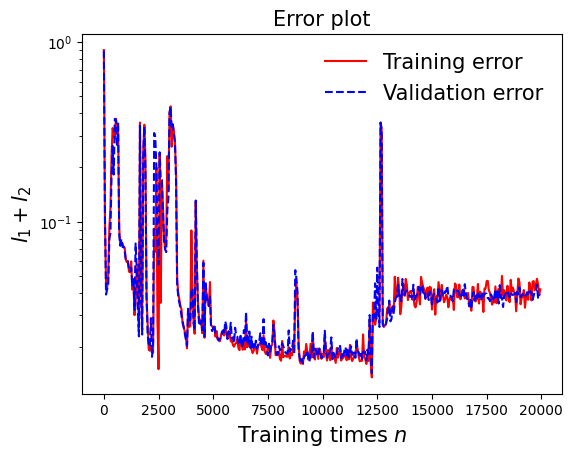

In [121]:
draw_loss(model8)

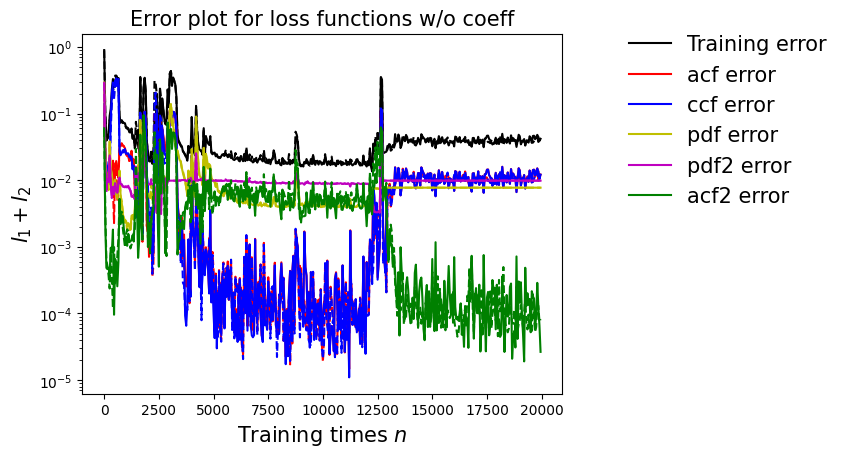

In [122]:
draw_errors(model8)

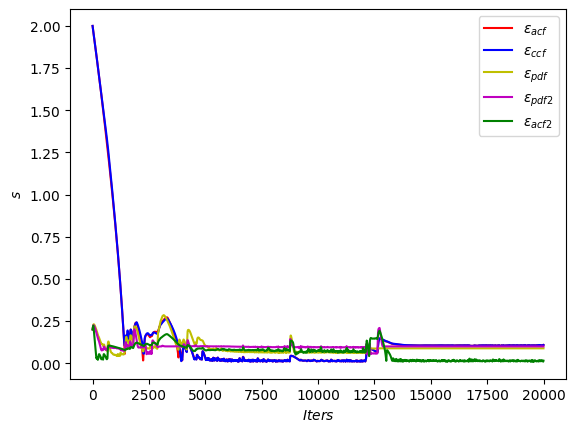

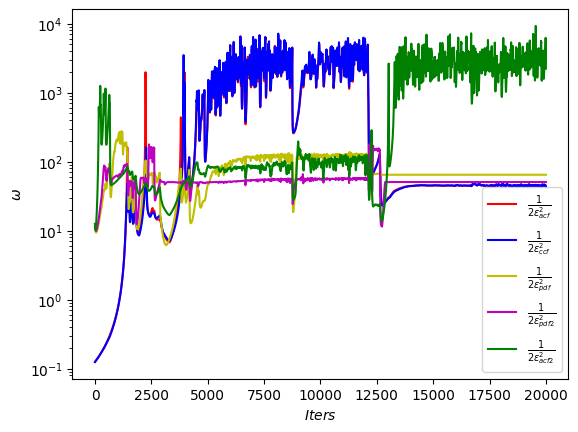

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

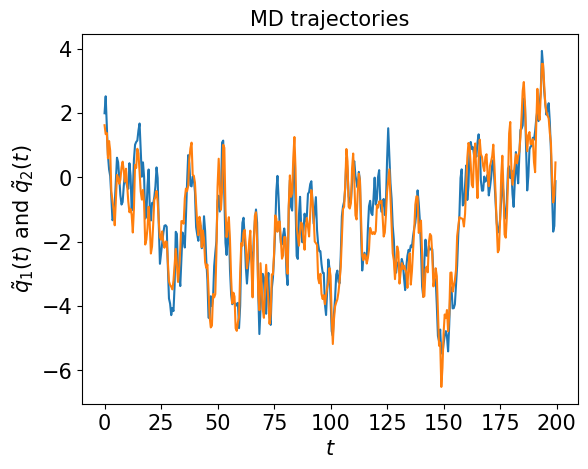

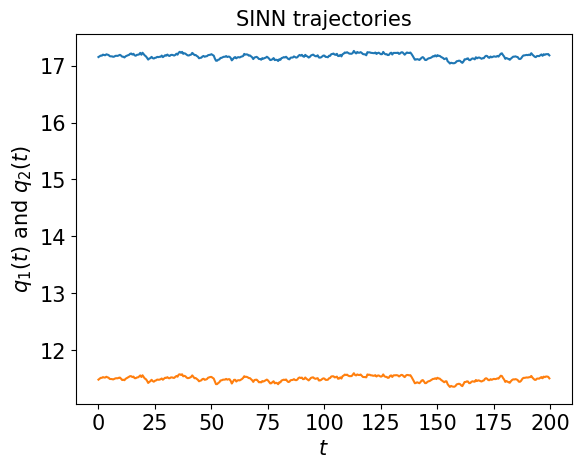

In [124]:
test1(model8)

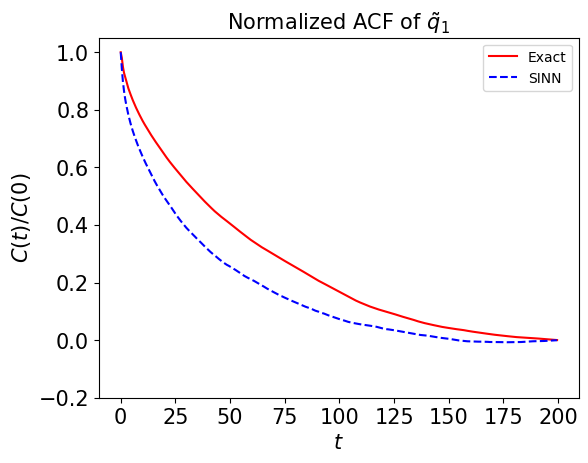

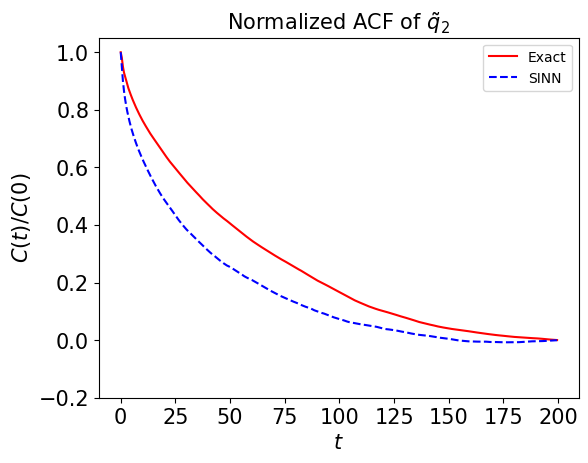

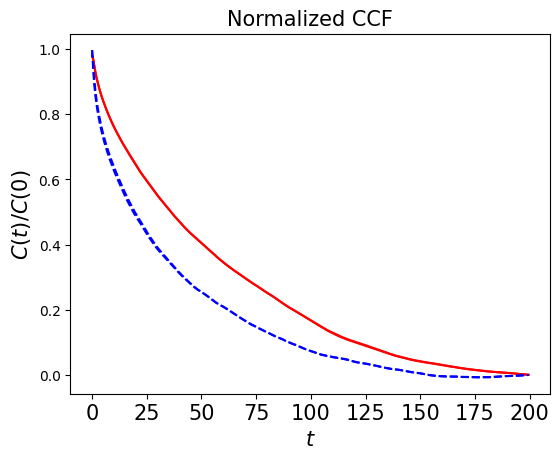

In [125]:
test2(model8)

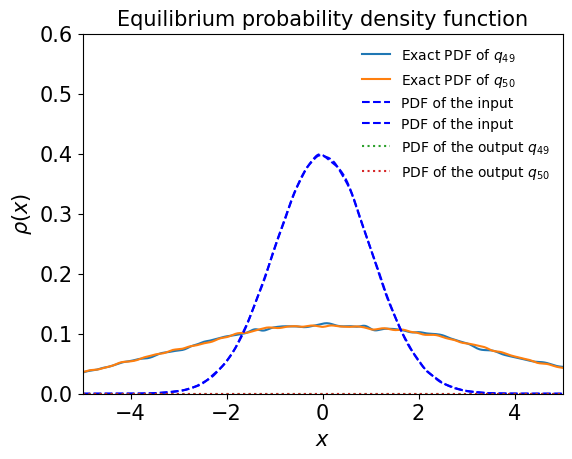

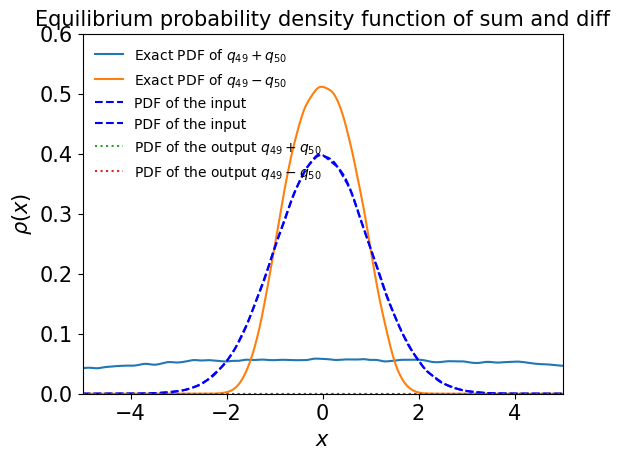

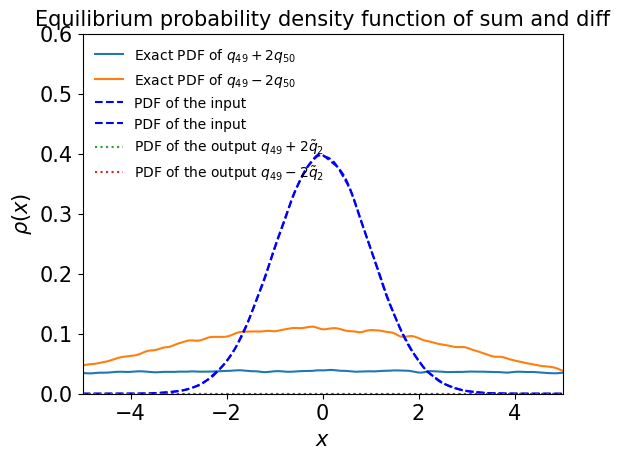

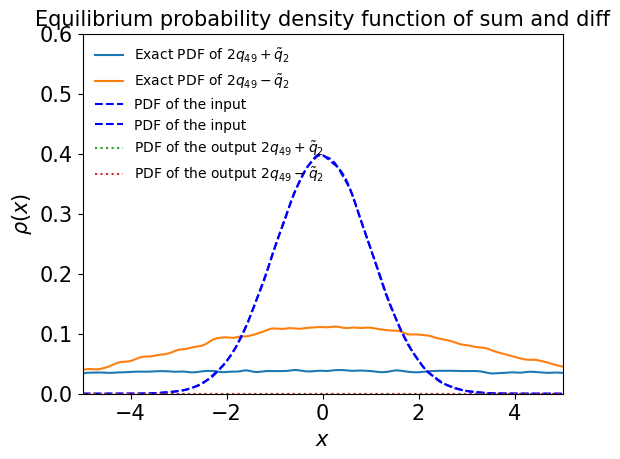

In [126]:
test3(model8)

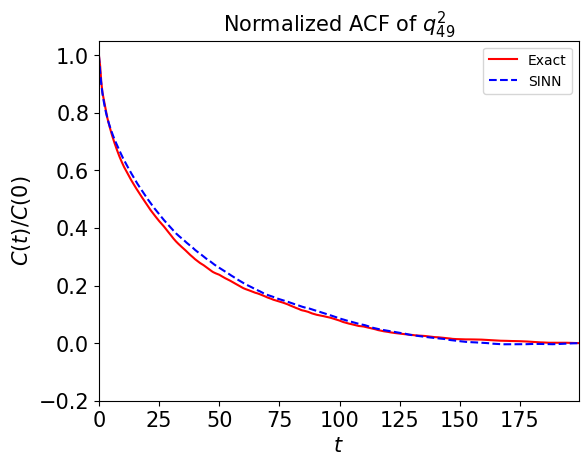

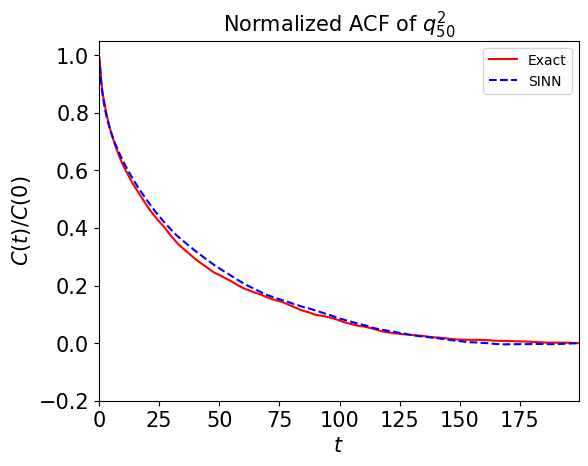

In [127]:
test4(model8)

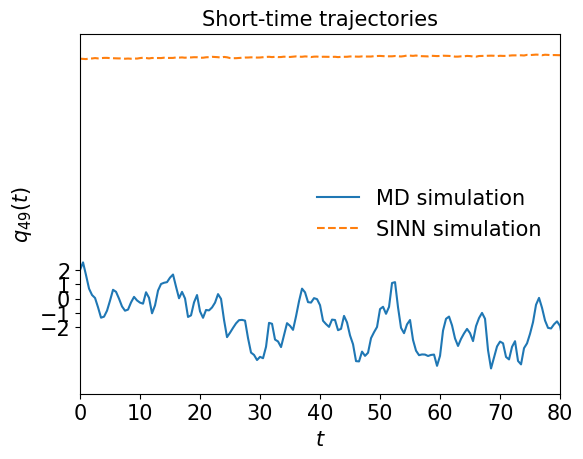

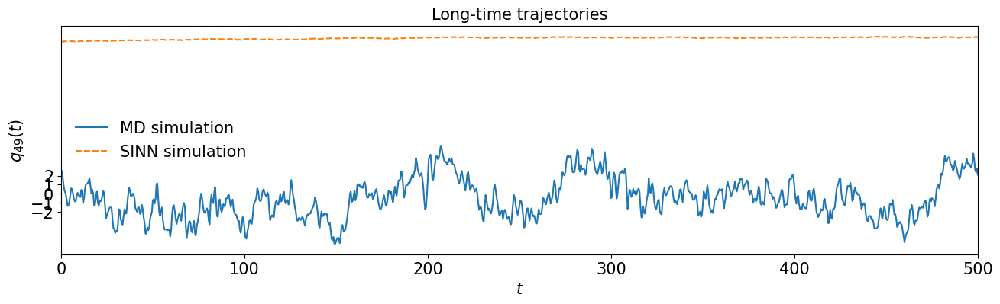

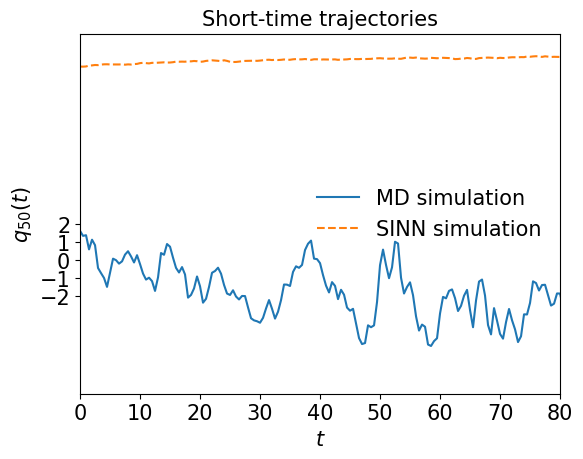

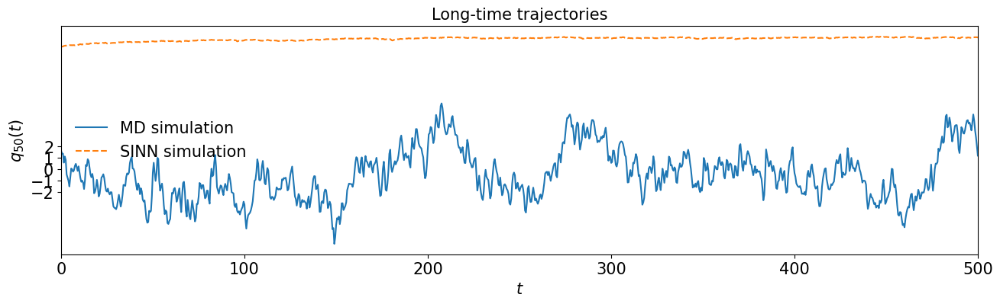

In [128]:
test5(model8)

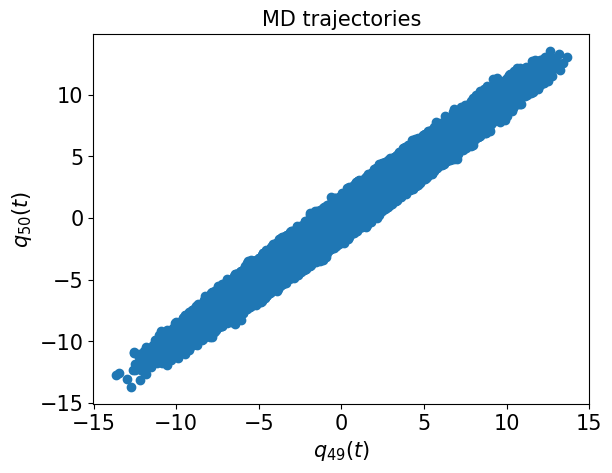

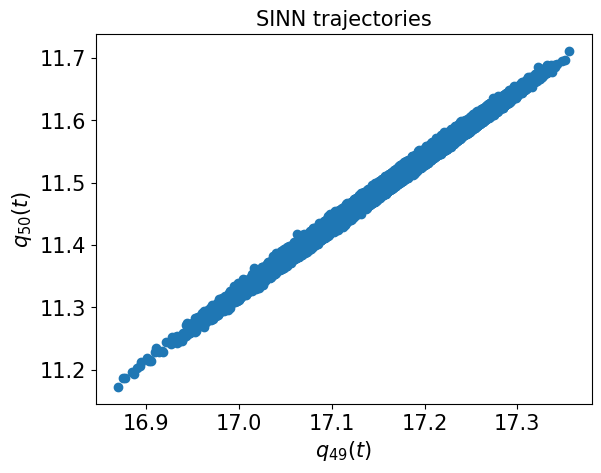

In [129]:
test6(model8)

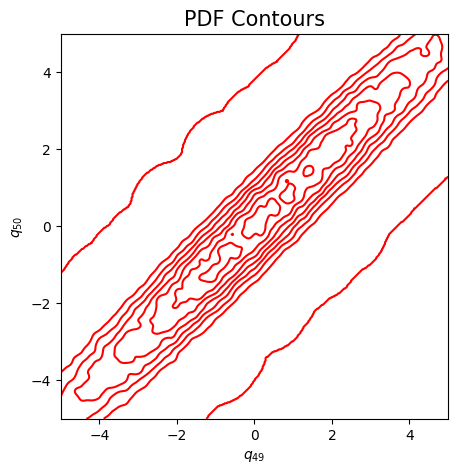

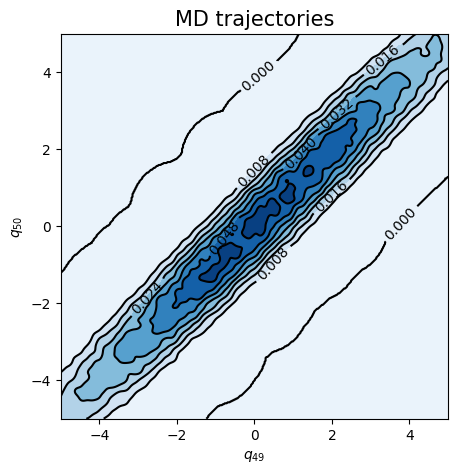

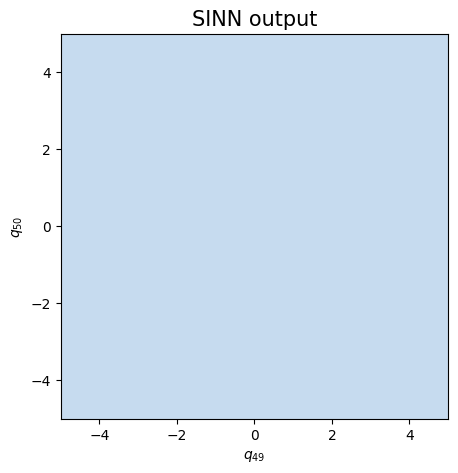

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8950, 0.8872, acf: 0.11520, ccf: 0.12911, pdf: 0.29394, pdf2: 0.28952, acf2: 0.05940
[50]-th step loss: 0.3935, 0.3892, acf: 0.05743, ccf: 0.26824, pdf: 0.02261, pdf2: 0.02189, acf2: 0.01903
[100]-th step loss: 0.3649, 0.3352, acf: 0.02575, ccf: 0.28868, pdf: 0.00892, pdf2: 0.01135, acf2: 0.00046
[150]-th step loss: 0.3295, 0.3316, acf: 0.01698, ccf: 0.29651, pdf: 0.00909, pdf2: 0.00796, acf2: 0.00103
[200]-th step loss: 0.0831, 0.0977, acf: 0.01653, ccf: 0.01754, pdf: 0.04225, pdf2: 0.01951, acf2: 0.00192
[250]-th step loss: 0.0903, 0.0712, acf: 0.02082, ccf: 0.02190, pdf: 0.01567, pdf2: 0.01113, acf2: 0.00163
[300]-th step loss: 0.0471, 0.0495, acf: 0.01472, ccf: 0.01540, pdf: 0.00882, pdf2: 0.00911, acf2: 0.00146
[350]-th step loss: 0.0445, 0.0443, acf: 0.01415, ccf: 0.01525, pdf: 0.00591, pdf2: 0.00866, acf2: 0.00029
[400]-th step loss: 0.4030, 0.4073, acf: 0.08393, ccf: 0.21020, pdf: 0.05766, pdf2: 0.01876, acf2: 0.03671
[450]-th step loss: 0.4338, 0.4512, acf:

[3850]-th step loss: 0.0309, 0.0345, acf: 0.00715, ccf: 0.00720, pdf: 0.00773, pdf2: 0.01169, acf2: 0.00072
[3900]-th step loss: 0.0377, 0.0578, acf: 0.01858, ccf: 0.01851, pdf: 0.00773, pdf2: 0.01198, acf2: 0.00101
[3950]-th step loss: 0.0333, 0.0341, acf: 0.00449, ccf: 0.00462, pdf: 0.00774, pdf2: 0.01343, acf2: 0.00381
[4000]-th step loss: 0.0286, 0.0290, acf: 0.00305, ccf: 0.00309, pdf: 0.00774, pdf2: 0.01111, acf2: 0.00398
[4050]-th step loss: 0.0303, 0.0295, acf: 0.00392, ccf: 0.00393, pdf: 0.00774, pdf2: 0.01101, acf2: 0.00288
[4100]-th step loss: 0.0283, 0.0283, acf: 0.00308, ccf: 0.00309, pdf: 0.00774, pdf2: 0.01098, acf2: 0.00342
[4150]-th step loss: 0.0303, 0.0298, acf: 0.00447, ccf: 0.00446, pdf: 0.00774, pdf2: 0.01093, acf2: 0.00216
[4200]-th step loss: 0.0282, 0.0291, acf: 0.00404, ccf: 0.00403, pdf: 0.00774, pdf2: 0.01092, acf2: 0.00233
[4250]-th step loss: 0.0311, 0.0323, acf: 0.00621, ccf: 0.00619, pdf: 0.00774, pdf2: 0.01097, acf2: 0.00114
[4300]-th step loss: 0.0321,

[7650]-th step loss: 0.0295, 0.0287, acf: 0.00006, ccf: 0.00006, pdf: 0.00772, pdf2: 0.00975, acf2: 0.01114
[7700]-th step loss: 0.0270, 0.0293, acf: 0.00009, ccf: 0.00009, pdf: 0.00773, pdf2: 0.00953, acf2: 0.01186
[7750]-th step loss: 0.0273, 0.0320, acf: 0.00024, ccf: 0.00025, pdf: 0.00772, pdf2: 0.00944, acf2: 0.01435
[7800]-th step loss: 0.0307, 0.0311, acf: 0.00019, ccf: 0.00019, pdf: 0.00773, pdf2: 0.00973, acf2: 0.01327
[7850]-th step loss: 0.0282, 0.0284, acf: 0.00003, ccf: 0.00003, pdf: 0.00772, pdf2: 0.00940, acf2: 0.01127
[7900]-th step loss: 0.0258, 0.0282, acf: 0.00002, ccf: 0.00003, pdf: 0.00772, pdf2: 0.00940, acf2: 0.01103
[7950]-th step loss: 0.0281, 0.0308, acf: 0.00012, ccf: 0.00012, pdf: 0.00773, pdf2: 0.01007, acf2: 0.01277
[8000]-th step loss: 0.0257, 0.0279, acf: 0.00004, ccf: 0.00004, pdf: 0.00773, pdf2: 0.00980, acf2: 0.01028
[8050]-th step loss: 0.0267, 0.0278, acf: 0.00002, ccf: 0.00002, pdf: 0.00772, pdf2: 0.00952, acf2: 0.01047
[8100]-th step loss: 0.0275,

[11450]-th step loss: 0.0259, 0.0279, acf: 0.00004, ccf: 0.00004, pdf: 0.00780, pdf2: 0.00928, acf2: 0.01071
[11500]-th step loss: 0.0284, 0.0267, acf: 0.00002, ccf: 0.00002, pdf: 0.00769, pdf2: 0.00906, acf2: 0.00988
[11550]-th step loss: 0.0280, 0.0276, acf: 0.00005, ccf: 0.00005, pdf: 0.00769, pdf2: 0.00911, acf2: 0.01067
[11600]-th step loss: 0.0294, 0.0270, acf: 0.00002, ccf: 0.00002, pdf: 0.00773, pdf2: 0.00904, acf2: 0.01016
[11650]-th step loss: 0.0276, 0.0293, acf: 0.00013, ccf: 0.00013, pdf: 0.00771, pdf2: 0.00910, acf2: 0.01227
[11700]-th step loss: 0.0284, 0.0280, acf: 0.00005, ccf: 0.00005, pdf: 0.00768, pdf2: 0.00916, acf2: 0.01101
[11750]-th step loss: 0.0262, 0.0282, acf: 0.00006, ccf: 0.00006, pdf: 0.00772, pdf2: 0.00907, acf2: 0.01126
[11800]-th step loss: 0.0240, 0.0257, acf: 0.00004, ccf: 0.00003, pdf: 0.00769, pdf2: 0.00902, acf2: 0.00896
[11850]-th step loss: 0.0262, 0.0270, acf: 0.00004, ccf: 0.00004, pdf: 0.00767, pdf2: 0.00908, acf2: 0.01023
[11900]-th step los

[15250]-th step loss: 0.0115, 0.0117, acf: 0.00006, ccf: 0.00007, pdf: 0.00016, pdf2: 0.01125, acf2: 0.00013
[15300]-th step loss: 0.0122, 0.0119, acf: 0.00007, ccf: 0.00014, pdf: 0.00012, pdf2: 0.01136, acf2: 0.00018
[15350]-th step loss: 0.0117, 0.0117, acf: 0.00004, ccf: 0.00010, pdf: 0.00019, pdf2: 0.01130, acf2: 0.00011
[15400]-th step loss: 0.0119, 0.0121, acf: 0.00003, ccf: 0.00009, pdf: 0.00036, pdf2: 0.01145, acf2: 0.00012
[15450]-th step loss: 0.0124, 0.0121, acf: 0.00006, ccf: 0.00006, pdf: 0.00008, pdf2: 0.01168, acf2: 0.00025
[15500]-th step loss: 0.0124, 0.0125, acf: 0.00010, ccf: 0.00009, pdf: 0.00008, pdf2: 0.01200, acf2: 0.00020
[15550]-th step loss: 0.0116, 0.0117, acf: 0.00008, ccf: 0.00010, pdf: 0.00007, pdf2: 0.01136, acf2: 0.00013
[15600]-th step loss: 0.0119, 0.0116, acf: 0.00005, ccf: 0.00006, pdf: 0.00006, pdf2: 0.01136, acf2: 0.00006
[15650]-th step loss: 0.0128, 0.0119, acf: 0.00002, ccf: 0.00009, pdf: 0.00009, pdf2: 0.01165, acf2: 0.00009
[15700]-th step los

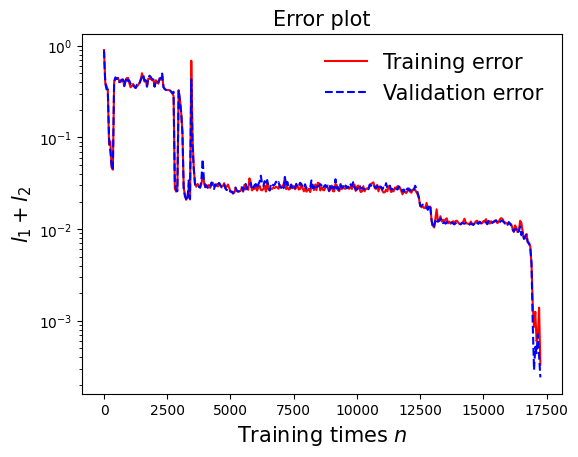

In [132]:
draw_loss(model9)

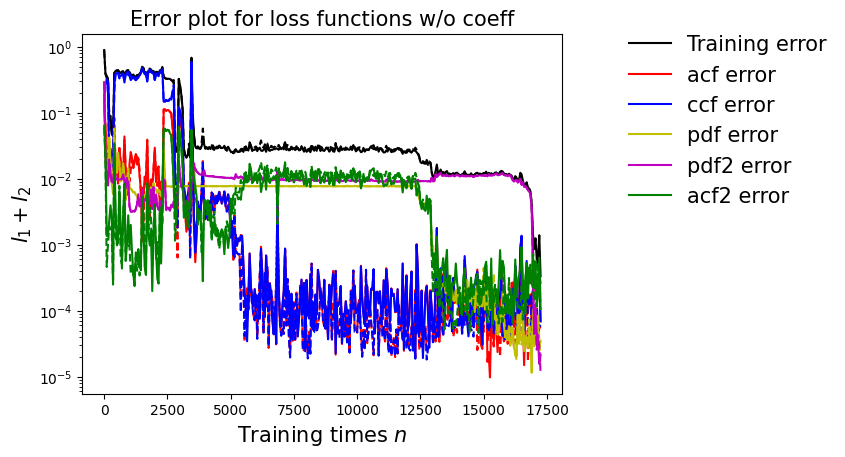

In [133]:
draw_errors(model9)

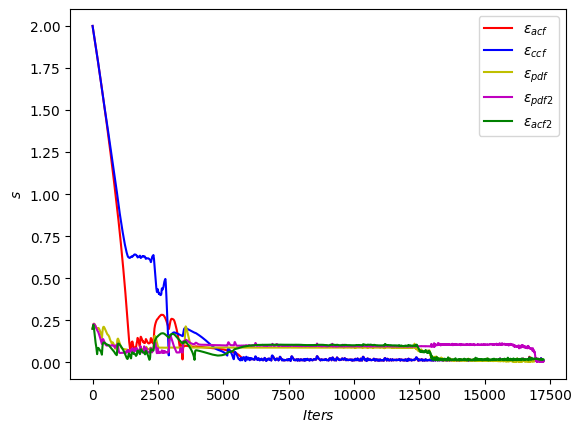

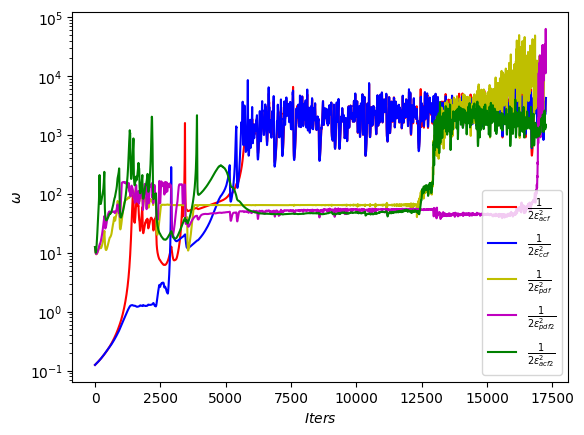

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

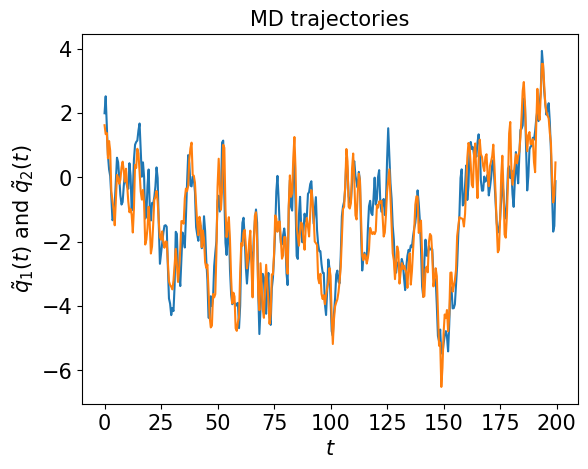

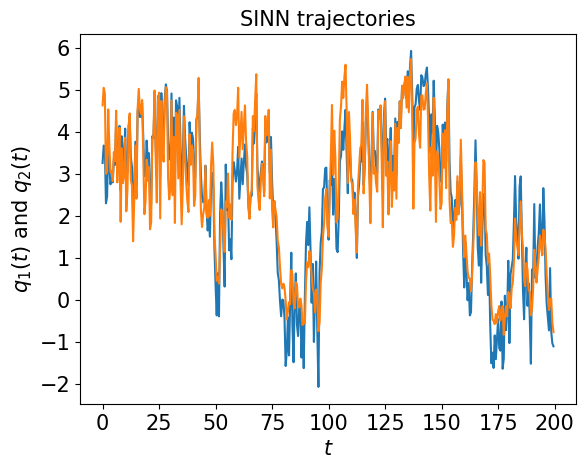

In [135]:
test1(model9)

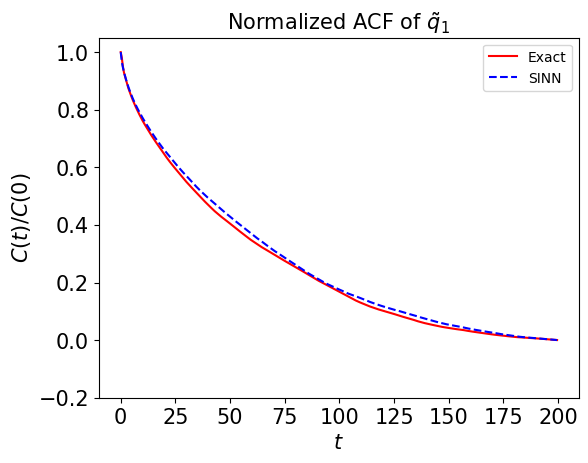

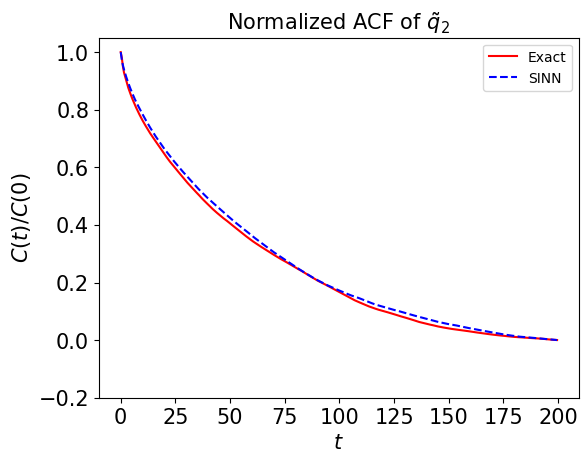

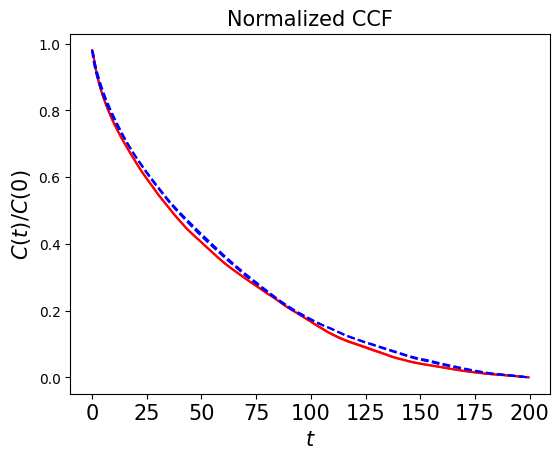

In [136]:
test2(model9)

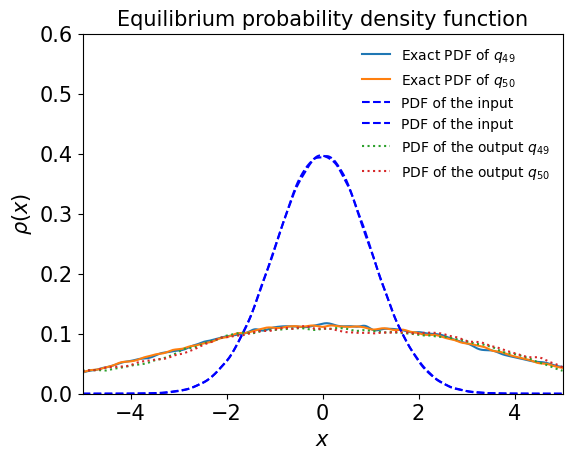

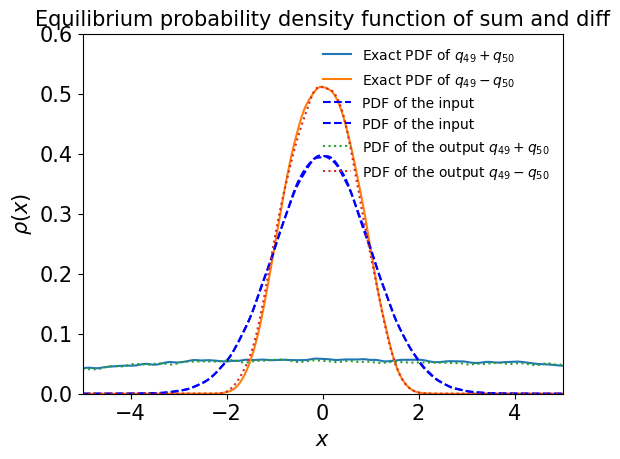

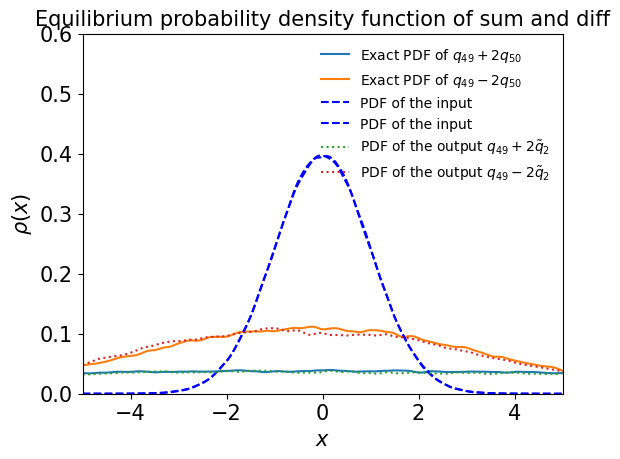

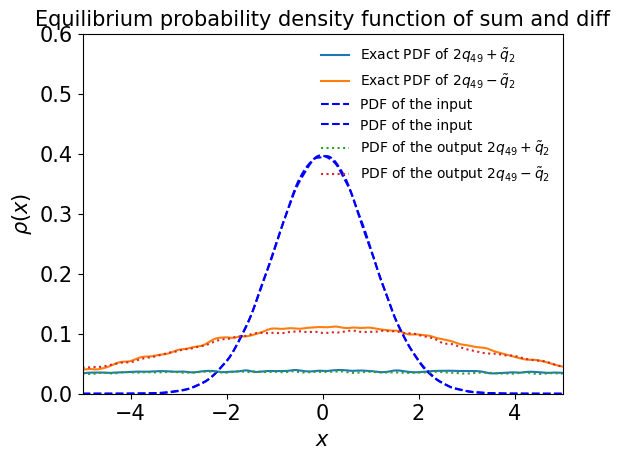

In [137]:
test3(model9)

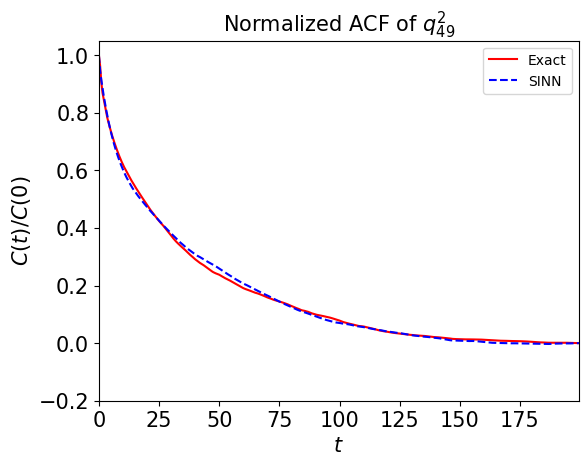

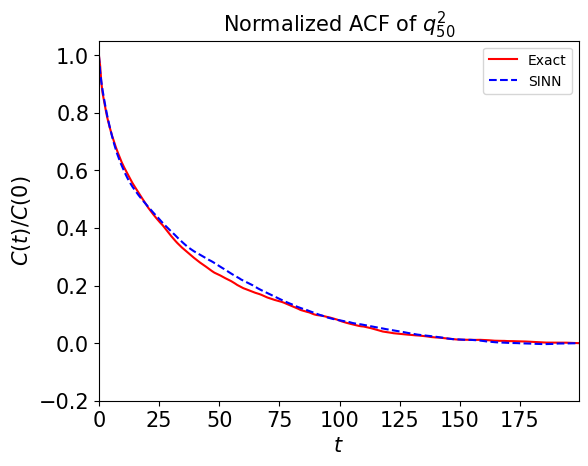

In [138]:
test4(model9)

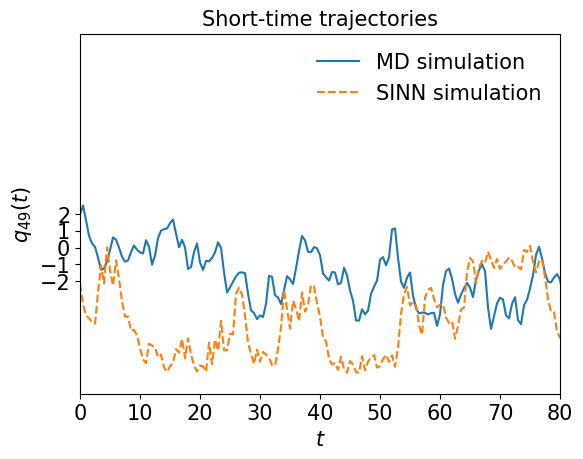

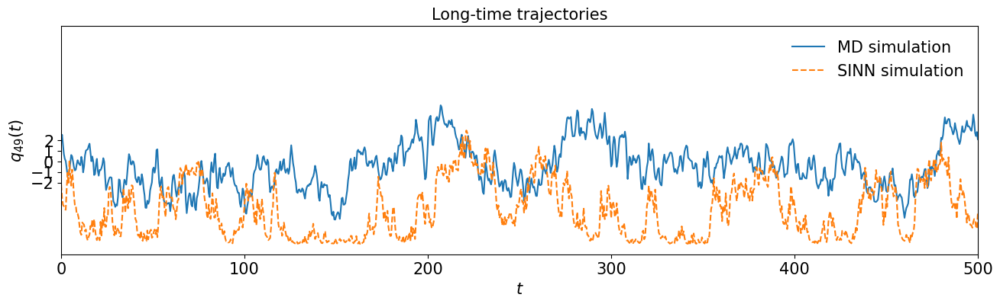

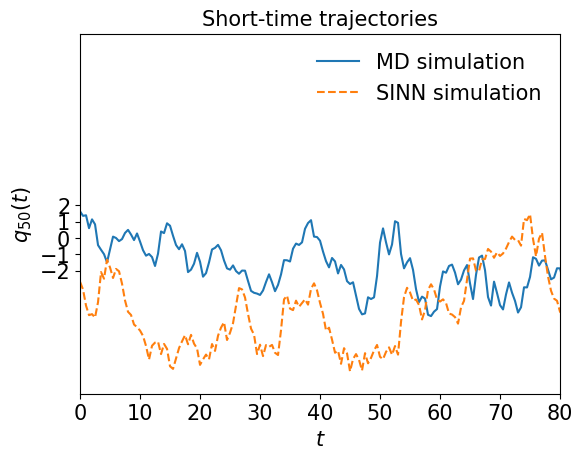

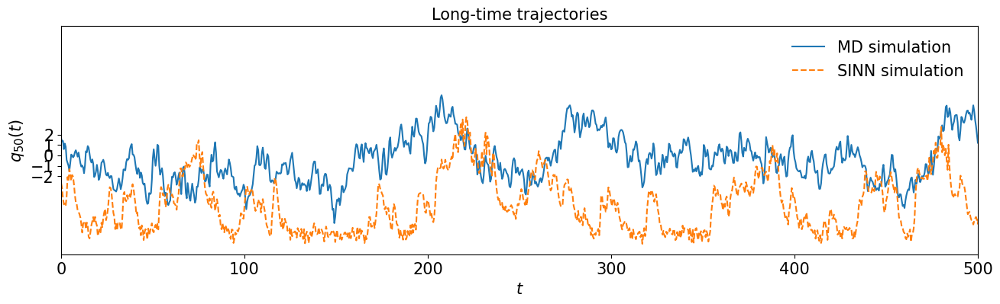

In [139]:
test5(model9)

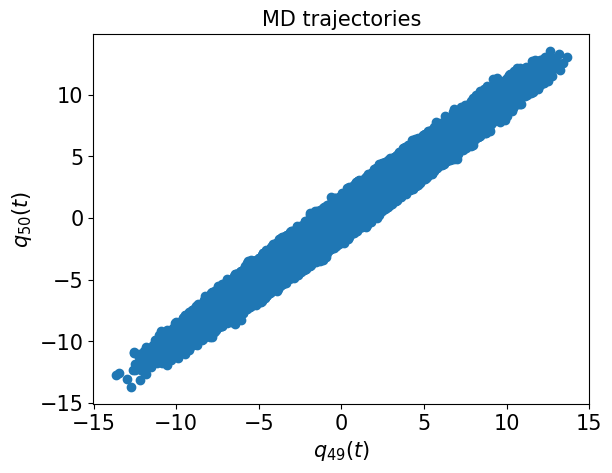

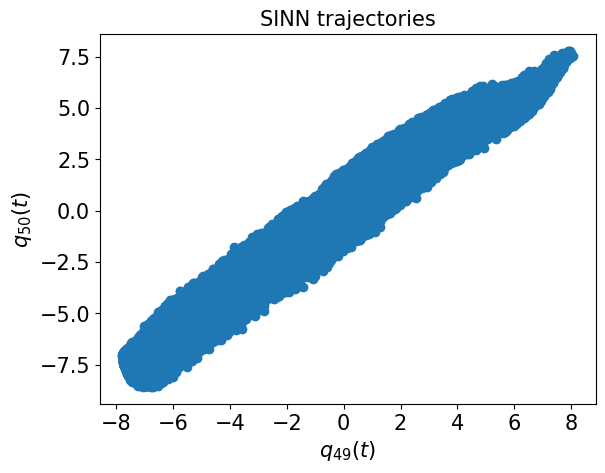

In [140]:
test6(model9)

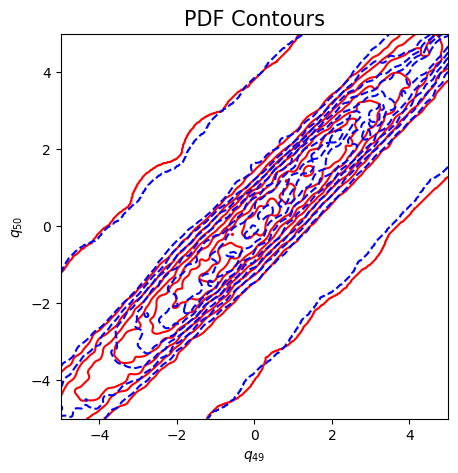

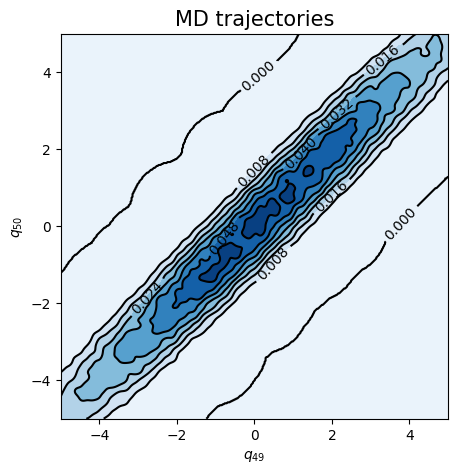

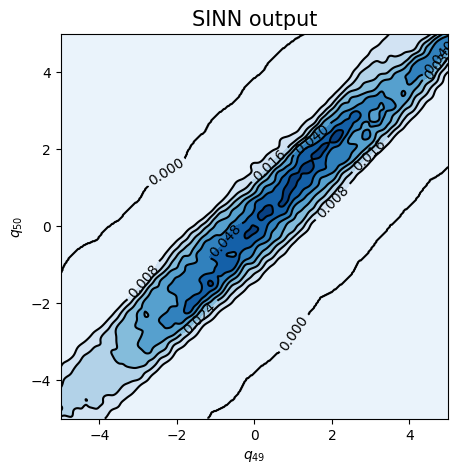

In [141]:
test7(model9)